In [1]:
options(warn=-1)
library(dplyr)
library(Seurat)
library(SeuratWrappers)
library(tidyverse)
library(RColorBrewer)
library(patchwork)
library(wesanderson)
library(pheatmap)
library(ggrepel)
library(ggplot2)
library(reshape2)
library(Hmisc)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Attaching SeuratObject

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ forcats   1.0.0          ✔ readr     2.1.4     
✔ ggplot2   3.5.0.9000     ✔ stringr   1.5.1     
✔ lubridate 1.9.3          ✔ tibble    3.2.1     
✔ purrr     1.0.2          ✔ tidyr     1.3.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths



Attaching package: ‘Hmisc’


The following object is masked from ‘package:SeuratObject’:

    Key


The following object is masked fr

In [2]:
pal <- wes_palette("Zissou1", 100, type = "continuous")
pal1<-wes_palette("Zissou1")
currentcol<-c('#B40F20',"#E59D07","lightgrey","#6C5B4E","#F69572","#84B678","#E49417","#5BBCD6","#FB7069","#C1BB7B","#F1DD7B","black","dark grey","#6C261C","#A14C29")

In [3]:
czi<-readRDS("chengpa/CZI6intergrated-3-30-2022.rds")

In [4]:
czi

An object of class Seurat 
50048 features across 113304 samples within 3 assays 
Active assay: integrated (4000 features, 1841 variable features)
 2 other assays present: RNA, SCT
 2 dimensional reductions calculated: pca, umap

In [5]:
colnames(czi@meta.data)

[1] "orig.ident"   "nCount_RNA"   "nFeature_RNA" "percent.mt"   "percent.rb"  
 [6] "Pt"           "Site"         "Gender"       "Age"          "nCount_SCT"  
[11] "nFeature_SCT"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



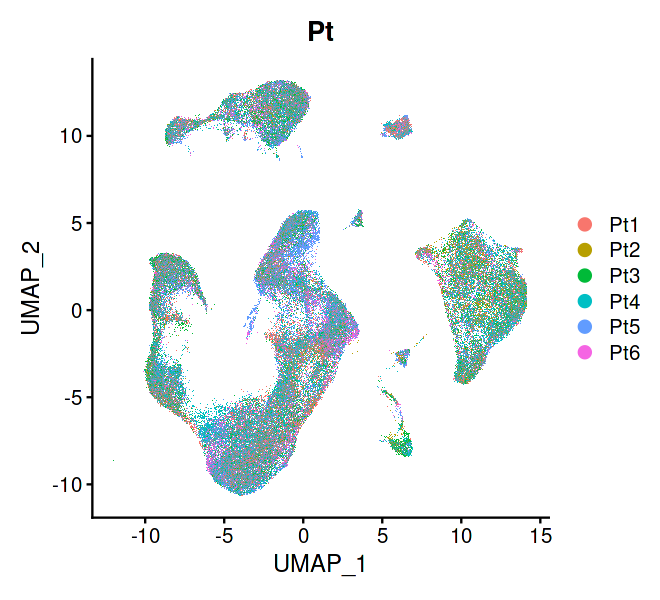

In [7]:
options(repr.plot.width=5.5, repr.plot.height=5)
DimPlot(czi, reduction = "umap", group.by = "Pt", label = F, label.size = 6,repel = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



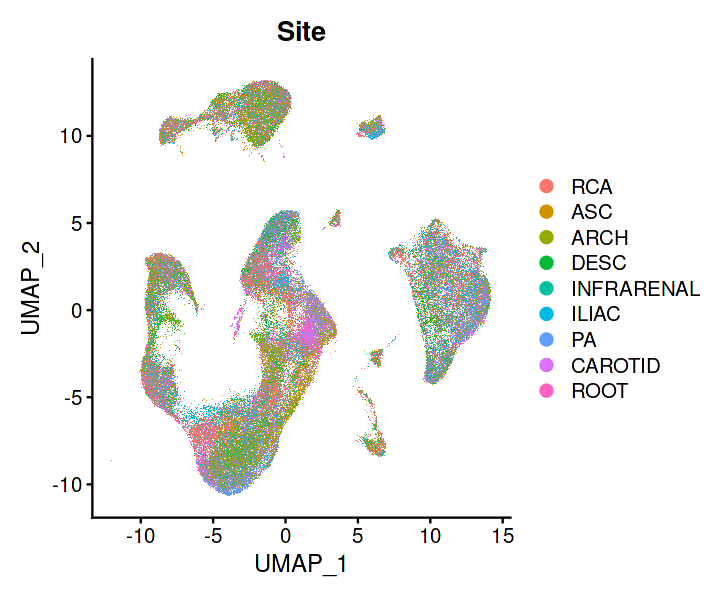

In [70]:
options(repr.plot.width=6, repr.plot.height=5)
DimPlot(czi, reduction = "umap", group.by = "Site",shuffle = T, label = F, label.size = 6,repel = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



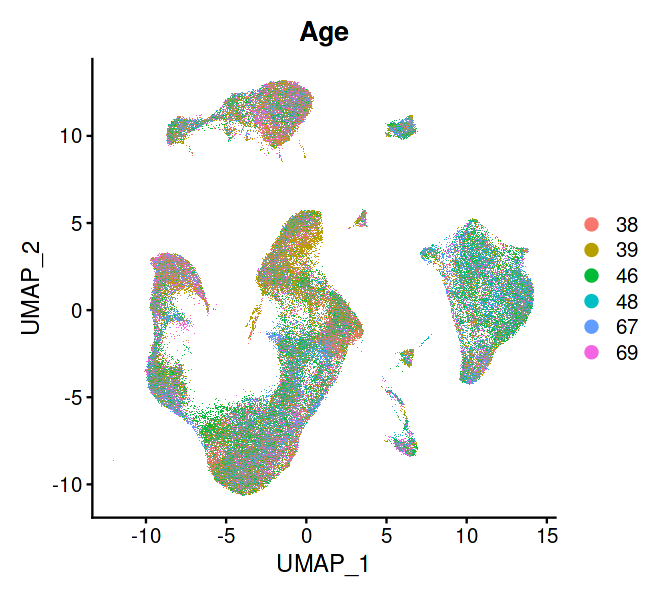

In [9]:
options(repr.plot.width=5.5, repr.plot.height=5)
DimPlot(czi, reduction = "umap", group.by = "Age", label = F, label.size = 6,repel = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



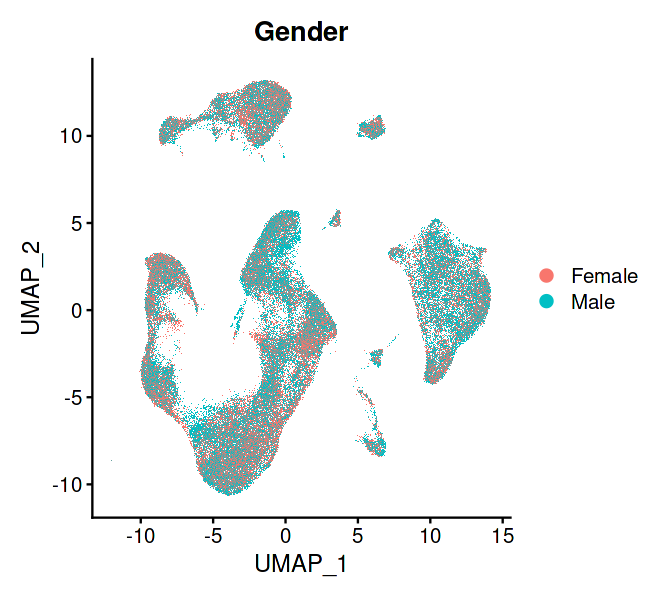

In [10]:
options(repr.plot.width=5.5, repr.plot.height=5)
DimPlot(czi, reduction = "umap", group.by = "Gender", label = F, label.size = 6,repel = TRUE)

In [11]:
DefaultAssay(czi)<-'integrated'
czi<-FindNeighbors(czi, dims = 1:50)
czi<-FindClusters(czi, resolution = 0.08)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 113304
Number of edges: 4124241

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9767
Number of communities: 8
Elapsed time: 59 seconds


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



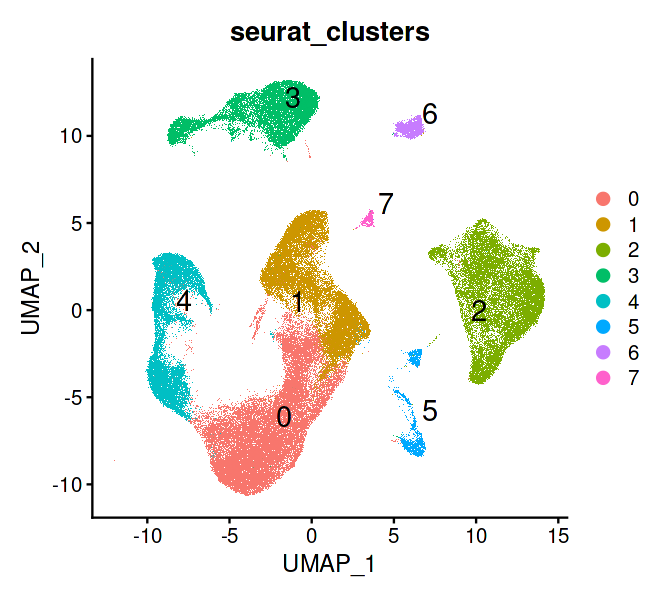

In [21]:
options(repr.plot.width=5.5, repr.plot.height=5)
DimPlot(czi, reduction = "umap", group.by = "seurat_clusters", label = T, label.size = 6,repel = TRUE)

In [22]:
levels(czi$seurat_clusters)

[1] "0" "1" "2" "3" "4" "5" "6" "7"

In [26]:
czi$seurat_clusters->Idents(czi)
cluster.ids <- c("Smooth Muscle", "Fibroblast", "Macrophage", "Endothelial1", "Microvasculature",
                "Lymphocyte","Endothelial2","Other Mesencyhmal cells")
names(cluster.ids) <- levels(czi)
czi <- RenameIdents(czi, cluster.ids)
levels(czi)<- c( "Endothelial1", "Endothelial2","Fibroblast", "Lymphocyte", "Microvasculature","Smooth Muscle","Macrophage", "Other Mesencyhmal cells")
czi$celltype<-Idents(czi)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



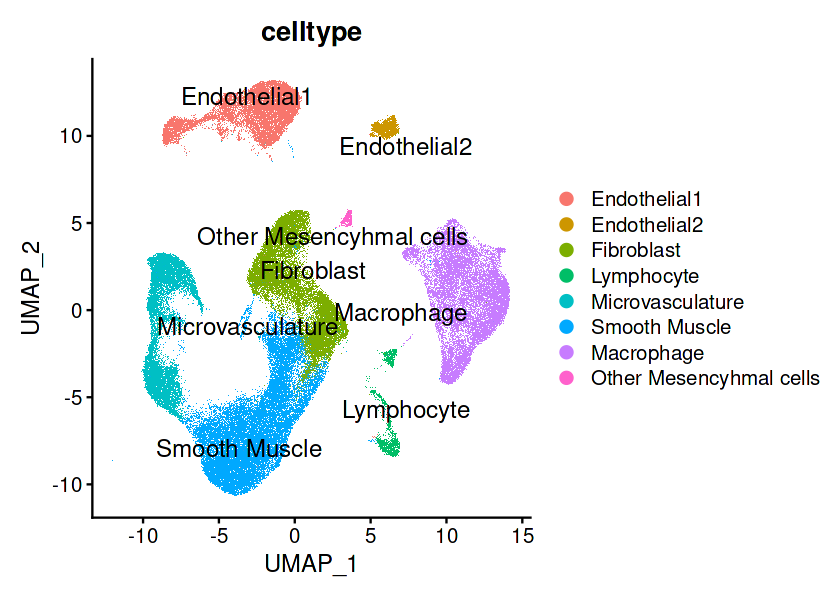

In [14]:
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(czi, reduction = "umap", group.by = "celltype", label = T, label.size = 5,repel = T)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



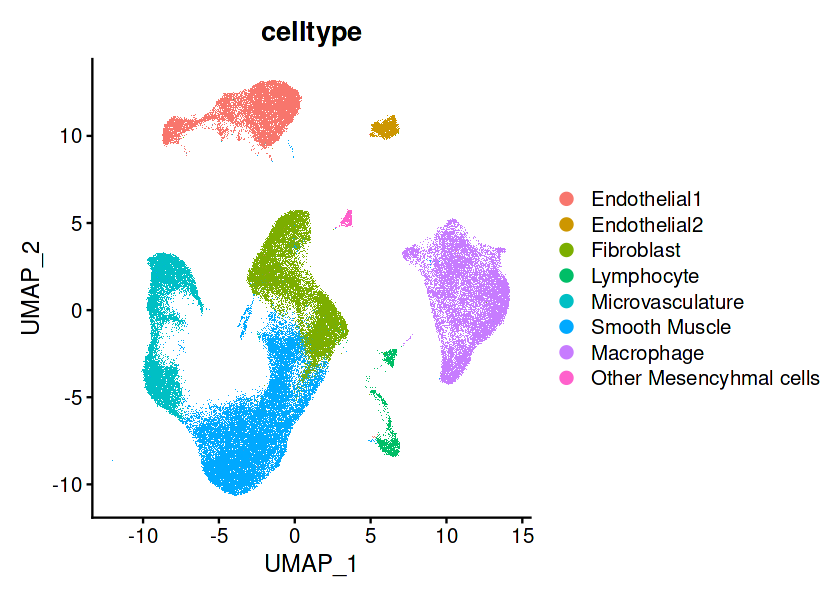

In [6]:
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(czi, reduction = "umap", group.by = "celltype", label = F, label.size = 5,repel = T)

In [27]:
czi$integrated_snn_res.0.08->Idents(czi)
cluster.ids <- c("Smooth Muscle", "Fibroblast", "Macrophage", "Endothelial1", "Microvasculature",
                "Lymphocyte","Endothelial2","Fibroblast")
names(cluster.ids) <- levels(czi)
czi <- RenameIdents(czi, cluster.ids)
levels(czi)<- c( "Endothelial1", "Endothelial2","Fibroblast", "Lymphocyte", "Microvasculature","Smooth Muscle","Macrophage")
czi$celltype2<-Idents(czi)

In [28]:
czi$integrated_snn_res.0.08->Idents(czi)
cluster.ids <- c("Smooth Muscle", "Fibroblast1", "Macrophage", "Endothelial1", "Microvasculature",
                "Lymphocyte","Endothelial2","Fibroblast2")
names(cluster.ids) <- levels(czi)
czi <- RenameIdents(czi, cluster.ids)
levels(czi)<- c( "Endothelial1", "Endothelial2","Fibroblast1", "Fibroblast2", "Lymphocyte", "Microvasculature","Smooth Muscle","Macrophage")
czi$celltype3<-Idents(czi)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



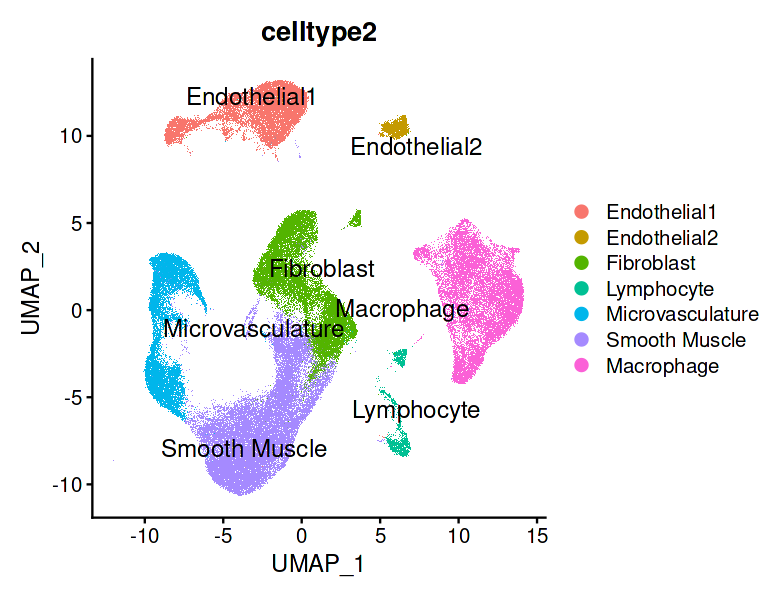

In [29]:
options(repr.plot.width=6.5, repr.plot.height=5)
DimPlot(czi, reduction = "umap", group.by = "celltype2", label = T, label.size = 5,repel = TRUE)

In [3]:
readRDS('RDS/CZI_processed.rds')->czi

In [30]:
saveRDS(czi,'RDS/CZI_processed.rds')

In [31]:
czi$celltype->Idents(czi)
FindAllMarkers(czi,assay = 'RNA',verbose = F)->celltype_marker
write.table(celltype_marker,'Markers/celltype_mks.txt',sep = '\t',quote=F)

In [32]:
czi$celltype->Idents(czi)
FindAllMarkers(czi,assay = 'SCT',verbose = F)->celltype_sct_marker
write.table(celltype_sct_marker,'Markers/celltype_sct_mks.txt',sep = '\t',quote=F)

In [33]:
czi$celltype->Idents(czi)
FindAllMarkers(czi,assay = 'integrated',verbose = F)->celltype_igt_marker
write.table(celltype_igt_marker,'Markers/celltype_igt_mks.txt',sep = '\t',quote=F)

In [34]:
czi$integrated_snn_res.0.08->Idents(czi)
FindAllMarkers(czi,assay = 'RNA', verbose = F)->clu_marker
write.table(clu_marker,'Markers/clu_mks.txt',sep = '\t',quote=F)

In [35]:
czi$integrated_snn_res.0.08->Idents(czi)
FindAllMarkers(czi,assay = 'SCT', verbose = F)->clu_sct_marker
write.table(clu_sct_marker,'Markers/clu_sct_mks.txt',sep = '\t',quote=F)

In [36]:
czi$integrated_snn_res.0.08->Idents(czi)
FindAllMarkers(czi,assay = 'integrated',verbose = F)->clu_igt_marker
write.table(clu_igt_marker,'Markers/clu_igt_mks.txt',sep = '\t',quote=F)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


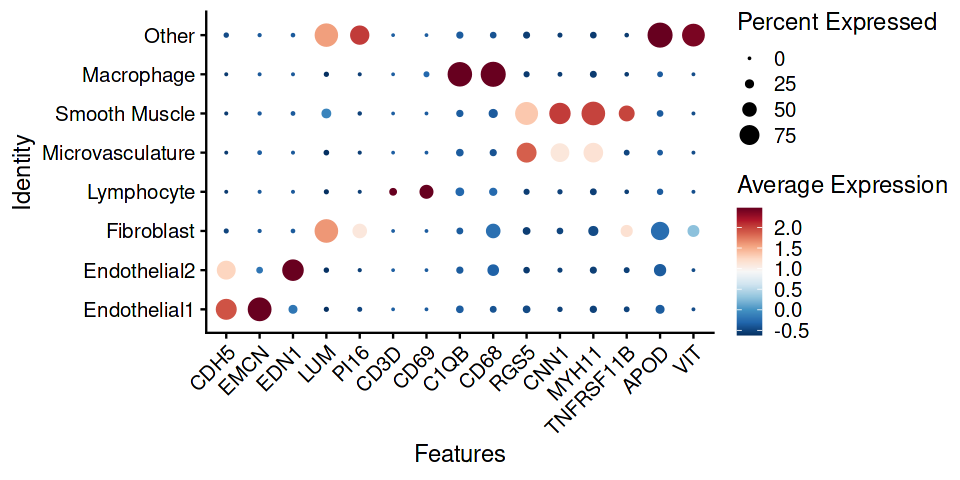

In [47]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=8, repr.plot.height=4)
DotPlot(czi, features = c("CDH5","EMCN","EDN1",#EC,
                          "LUM",'PI16',#FB
                         "CD3D",'CD69', #Lymphocyte
                         "C1QB","CD68",#MP
                          "RGS5", #Microvasculature
                         "CNN1","MYH11","TNFRSF11B",#SMC
                            "APOD",'VIT'#other
                        ),group.by='celltype')+RotatedAxis()+
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


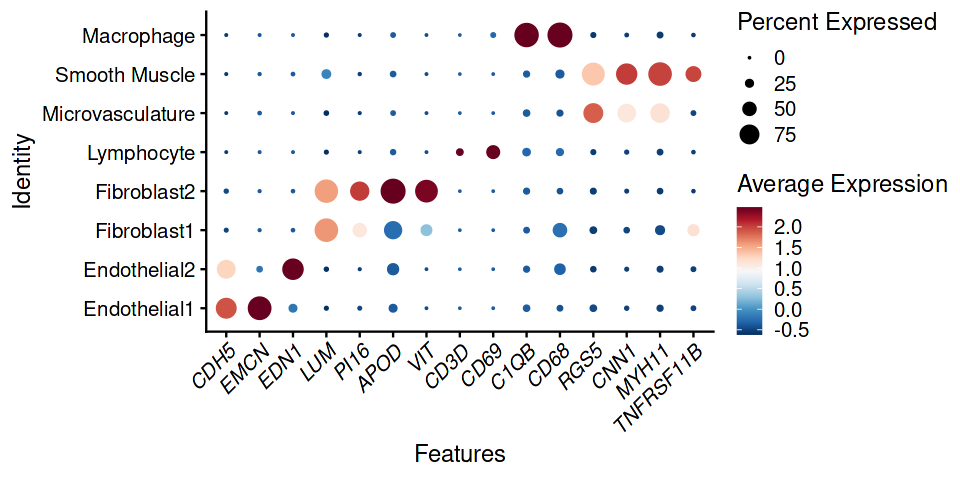

In [29]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=8, repr.plot.height=4)
DotPlot(czi, features = c("CDH5","EMCN","EDN1",#EC,
                          "LUM",'PI16',#FB
                            "APOD",'VIT',#FB2
                         "CD3D",'CD69', #Lymphocyte
                         "C1QB","CD68",#MP
                          "RGS5", #Microvasculature
                         "CNN1","MYH11","TNFRSF11B"#SMC
                        ),group.by='celltype3')+RotatedAxis()+
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
           theme( axis.text.x = element_text(face='italic'))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


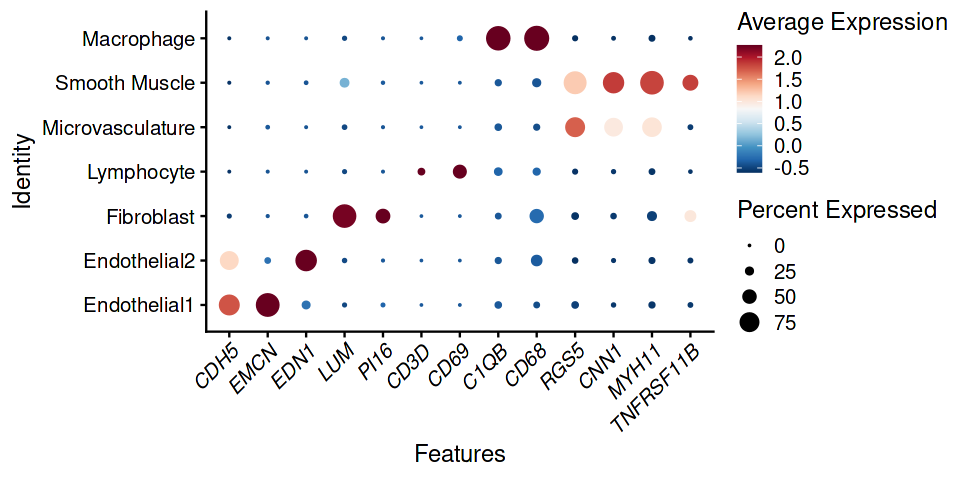

In [30]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=8, repr.plot.height=4)
DotPlot(czi, features = c("CDH5","EMCN","EDN1",#EC,
                          "LUM",'PI16',#FB
                         "CD3D","CD69", #Lymphocyte
                         "C1QB","CD68",#MP
                          "RGS5", #Microvasculature
                         "CNN1","MYH11","TNFRSF11B"#SMC
                        ),group.by='celltype2')+RotatedAxis()+
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
     theme( axis.text.x = element_text(face='italic'))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To di

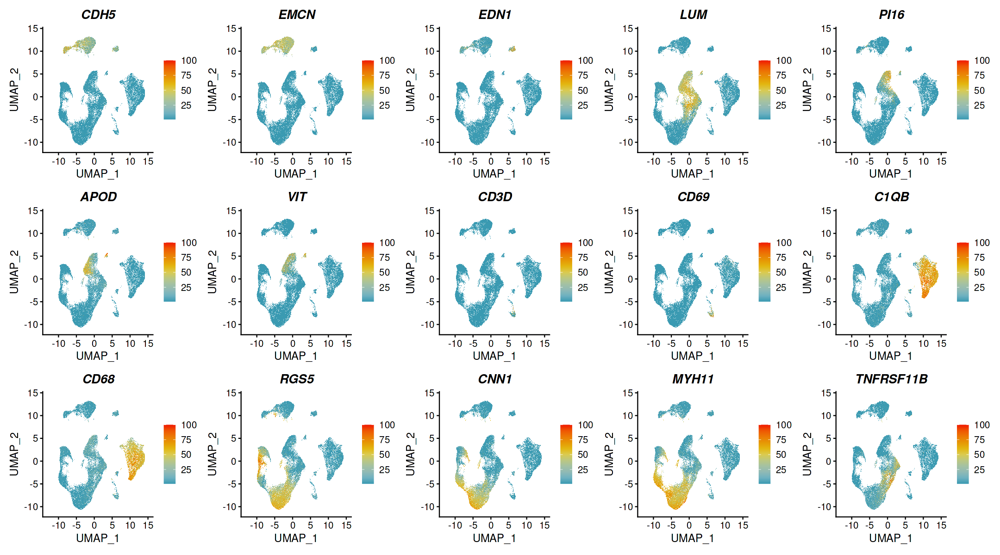

In [33]:
DefaultAssay(czi)<-'SCT'
options(repr.plot.width=18, repr.plot.height=10)
FeaturePlot(czi,features = c("CDH5","EMCN","EDN1",#EC,
                          "LUM",'PI16',#FB
                            "APOD",'VIT',#FB2
                         "CD3D",'CD69', #Lymphocyte
                         "C1QB","CD68",#MP
                          "RGS5", #Microvasculature
                         "CNN1","MYH11","TNFRSF11B"#SMC
                        ), cols = pal, ncol=5,  min.cutoff = 0.01) &theme( plot.title = element_text(face='bold.italic'))

In [163]:
czi$celltype->Idents(czi)
subset(czi, ident=c('Smooth Muscle','Microvasculature'))->smc_micro

In [164]:
subset(czi, ident=c('Fibroblast'))->fb

In [15]:
subset(czi, ident=c('Endothelial1','Endothelial2'))->ec

In [155]:
subset(czi, subset=celltype=='Smooth Muscle')->smc

In [61]:
saveRDS(smc_micro,'RDS/smc_micro.rds')

In [62]:
saveRDS(smc,'RDS/smc.rds')

In [63]:
saveRDS(fb,'RDS/fb.rds')

In [64]:
saveRDS(ec,'RDS/ec.rds')

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



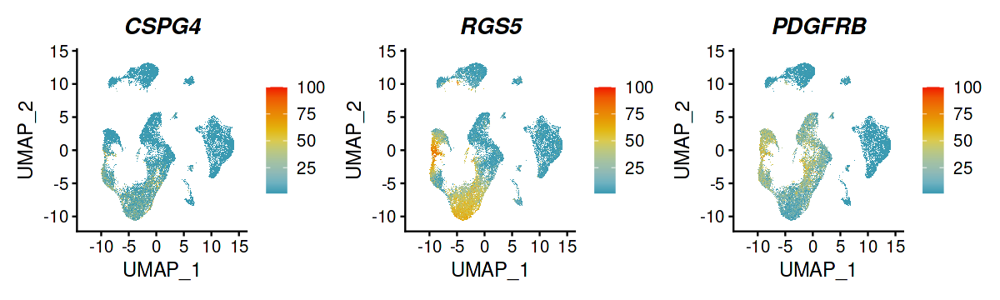

In [34]:
DefaultAssay(czi)<-'SCT'
options(repr.plot.width=10, repr.plot.height=3)
FeaturePlot(czi, features = c('CSPG4','RGS5','PDGFRB'), cols = pal, ncol=3,  min.cutoff = 0.01)&theme( plot.title = element_text(face='bold.italic'))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


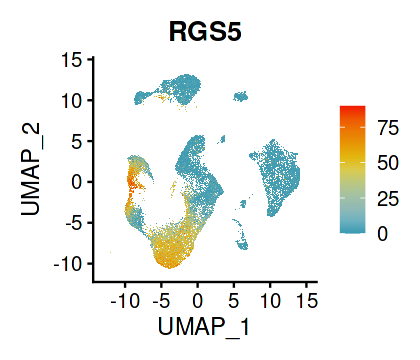

In [33]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=3.5, repr.plot.height=3)
FeaturePlot(czi, slot='data',features = c('RGS5'), cols = pal, ncol=1,  min.cutoff = NA,  max.cutoff = NA) &
  scale_color_gradientn(
  colors = pal,
  limits = c(0, 90), oob = scales::squish
)

In [13]:
DefaultAssay(czi)<-'RNA'
NormalizeData(czi)->czi

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding 

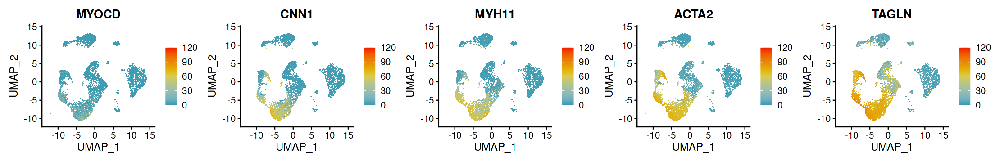

In [22]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=18.5, repr.plot.height=3)
FeaturePlot(czi, slot='data',features = c('MYOCD','CNN1','MYH11','ACTA2','TAGLN'), cols = pal, ncol=5,  min.cutoff = NA,  max.cutoff = NA) &
  scale_color_gradientn(
  colors = pal,
  limits = c(0, 120), oob = scales::squish
)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



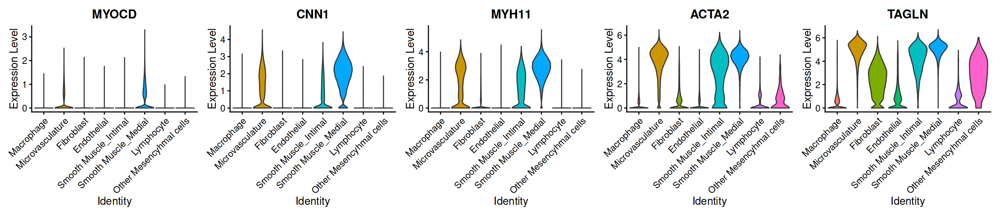

In [62]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=18.5, repr.plot.height=4)
VlnPlot(czi, ncol=5,features = c('MYOCD','CNN1','MYH11','ACTA2','TAGLN'),pt.size=0)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


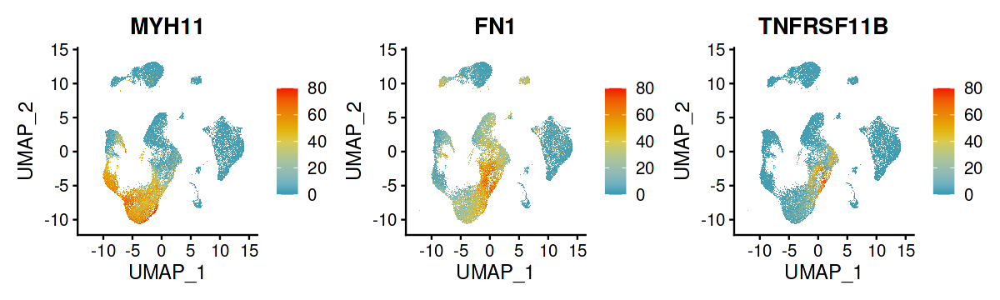

In [31]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=10, repr.plot.height=3)
FeaturePlot(czi, slot='data',features = c('MYH11','FN1','TNFRSF11B'), cols = pal, ncol=3,  min.cutoff = NA,  max.cutoff = NA) &
  scale_color_gradientn(
  colors = pal,
  limits = c(0, 80), oob = scales::squish
)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Picking joint bandwidth of 0.0139

Picking joint bandwidth of 0.0921

Picking joint bandwidth of 0.0507



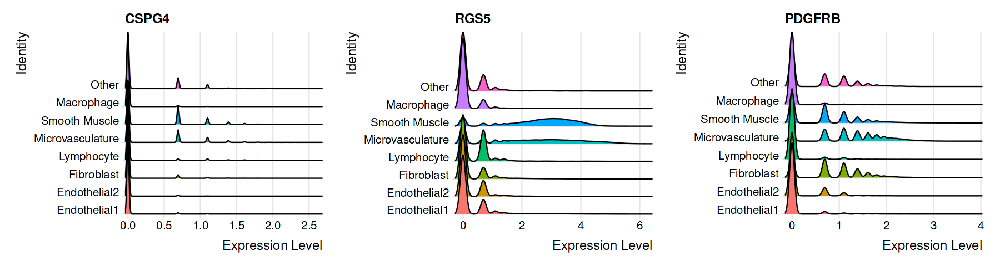

In [82]:
DefaultAssay(czi)<-'SCT'
options(repr.plot.width=15, repr.plot.height=4)
RidgePlot(czi, features = c('CSPG4','RGS5','PDGFRB'),  ncol=3)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



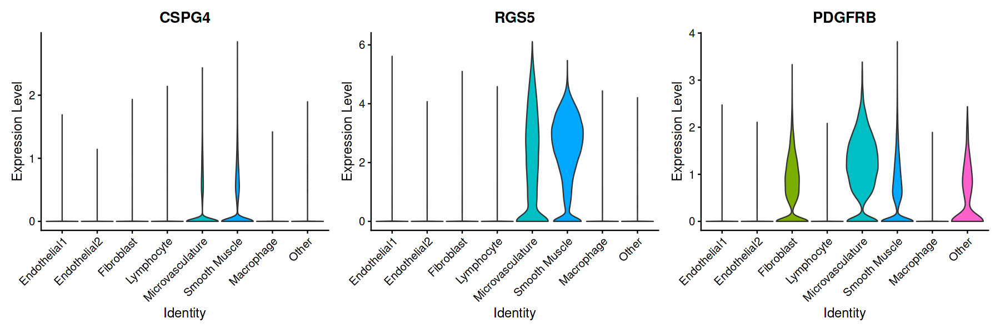

In [80]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=15, repr.plot.height=5)
VlnPlot(czi, features = c('CSPG4','RGS5','PDGFRB'),  ncol=3,pt.size=0)

In [87]:
FindMarkers(smc_micro,ident.1 = 'Smooth Muscle',ident.2='Microvasculature',assay = 'RNA',slot = 'data',
           only.pos = F,verbose=F)->smc_micro_de

In [88]:
RunPresto(smc_micro,ident.1 = 'Smooth Muscle',ident.2='Microvasculature',assay = 'RNA',slot = 'data',
           only.pos = F,verbose=F)->smc_micro_de_fast

In [98]:
write.table(smc_micro_de_fast, file= 'Markers/SMC_Micro_DE.txt',sep='\t',quote=F)

In [104]:
dim(smc_micro_de_fast)

[1] 587   6

In [104]:
read.table('Markers/GO//SMC_Micro_DEplot.txt',sep='\t',fill=NA,header=T)->dat

In [105]:
rownames(dat)->dat$rank
dat<- dat[seq(dim(dat)[1],1),]
dat<-transform(dat,rank=factor(rank,levels=unique(rank)))

In [106]:
head(dat)

,gene,p_val,auc,avg_log2FC,pct.1,pct.2,p_val_adj,label,rank
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>
587,NOV,0,0.9068041,1.263904,0.864,0.118,0,,587
586,OGN,0,0.9188681,1.253037,0.913,0.199,0,,586
585,MYH10,0,0.9288970,1.251935,0.922,0.209,0,MYH10,585
584,VCAN,0,0.8719207,1.229455,0.792,0.107,0,VCAN,584
583,FGL2,0,0.8844260,1.135961,0.797,0.065,0,,583
582,SPINT2,0,0.9027200,1.119710,0.853,0.117,0,,582


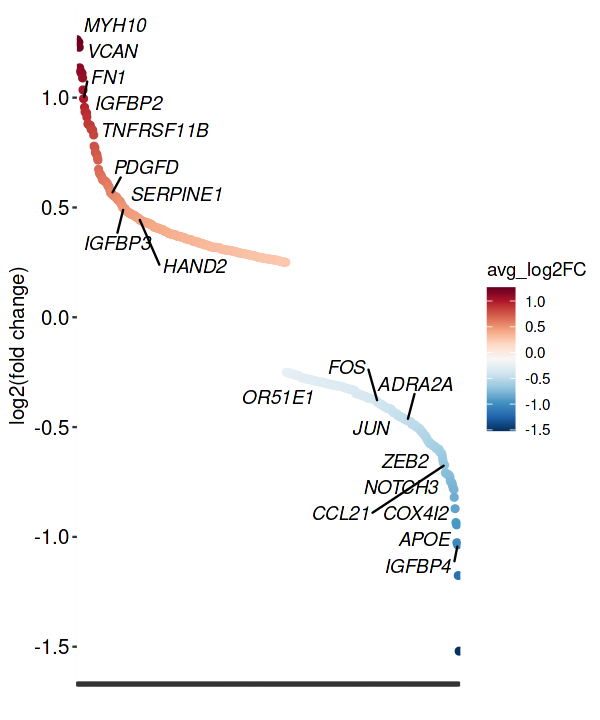

In [108]:
options(repr.plot.width=5, repr.plot.height=6)
ggplot(dat,aes(x=rank,y=avg_log2FC,label = label))+
    geom_jitter(aes(color=avg_log2FC))+
    geom_text_repel(max.overlaps = 100,fontface = "italic")+
     scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
	theme( 
		axis.text.y = element_text(size=12,colour = 'black'),
		axis.title = element_text(size=12,colour = 'black'),
		axis.text.x =element_blank()
	)+
	xlab("")+
	ylab("log2(fold change)")

In [134]:
bp<-read.table('Markers/GO/SMC_Micro_BP.txt',header=T,sep="\t")

In [135]:
bp[1:10,]->bp
bp$Term<-str_split_fixed(bp$Term,"~",2)[,2]
bp<- bp[seq(dim(bp)[1],1),]
bp<-transform(bp,Term=factor(Term,levels=unique(Term)))

In [136]:
colnames(bp)

[1] "Category"        "Term"            "Count"           "X."             
 [5] "PValue"          "Genes"           "List.Total"      "Pop.Hits"       
 [9] "Pop.Total"       "Fold.Enrichment" "Bonferroni"      "Benjamini"      
[13] "FDR"

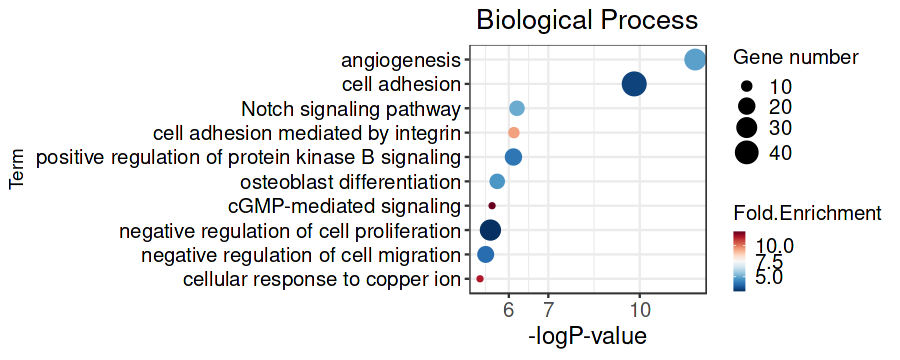

In [143]:
options(repr.plot.width=7.5, repr.plot.height=3)
ggplot(bp, aes(x=-1*log10(PValue), y=Term)) + 
	geom_point(aes(size=Count, color=Fold.Enrichment))+
    scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
	labs(
		color=expression(Fold.Enrichment), 
		size="Gene number",
		x="-logP-value",
		# y="Pathway name",
		title="Biological Process")+
	theme_bw()+
	scale_x_log10()+
	theme(
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=12),
		axis.title.x = element_text(size=14),
		legend.key.size = unit(0.1,"inches"),
		legend.text = element_text(size=12),
		legend.title = element_text(size=12),
		legend.background = element_rect(fill="transparent"),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [149]:
kegg<-read.table('Markers/GO/SMC_Micro_KEGG.txt',header=T,sep="\t")

In [150]:
kegg[1:10,]->kegg
kegg$Term<-str_split_fixed(kegg$Term,":",2)[,2]
kegg<- kegg[seq(dim(kegg)[1],1),]
kegg<-transform(kegg,Term=factor(Term,levels=unique(Term)))

In [151]:
colnames(kegg)

[1] "Category"        "Term"            "Count"           "X."             
 [5] "PValue"          "Genes"           "List.Total"      "Pop.Hits"       
 [9] "Pop.Total"       "Fold.Enrichment" "Bonferroni"      "Benjamini"      
[13] "FDR"

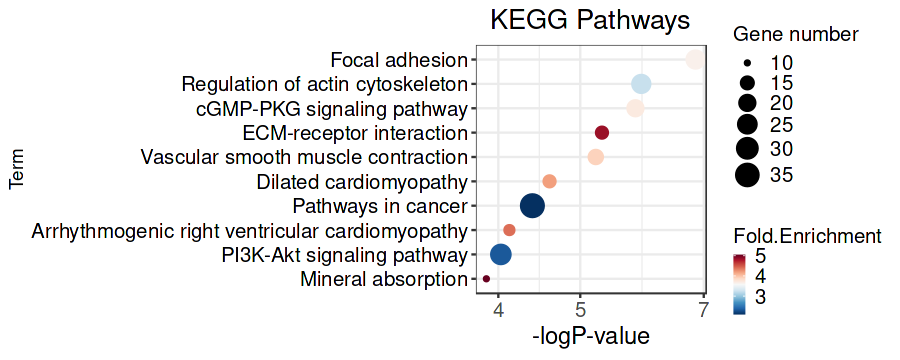

In [153]:
options(repr.plot.width=7.5, repr.plot.height=3)
ggplot(kegg, aes(x=-1*log10(PValue), y=Term)) + 
	geom_point(aes(size=Count, color=Fold.Enrichment))+
    scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
	labs(
		color=expression(Fold.Enrichment), 
		size="Gene number",
		x="-logP-value",
		# y="Pathway name",
		title="KEGG Pathways")+
	theme_bw()+
	scale_x_log10()+
	theme(
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=12),
		axis.title.x = element_text(size=14),
		legend.key.size = unit(0.1,"inches"),
		legend.text = element_text(size=12),
		legend.title = element_text(size=12),
		legend.background = element_rect(fill="transparent"),
		plot.title = element_text(hjust = 0.5,size=16)
	)


Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



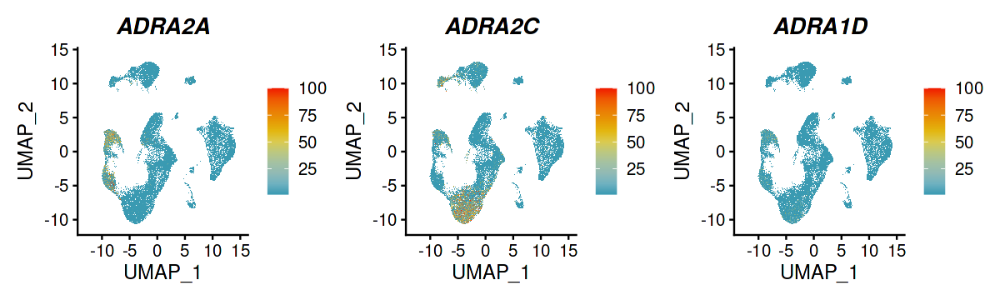

In [4]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=10, repr.plot.height=3)
FeaturePlot(czi, features = c('ADRA2A','ADRA2C','ADRA1D'), ncol=3, col=pal, order = T,,max.cutoff=2)&theme( plot.title = element_text(face='bold.italic'))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



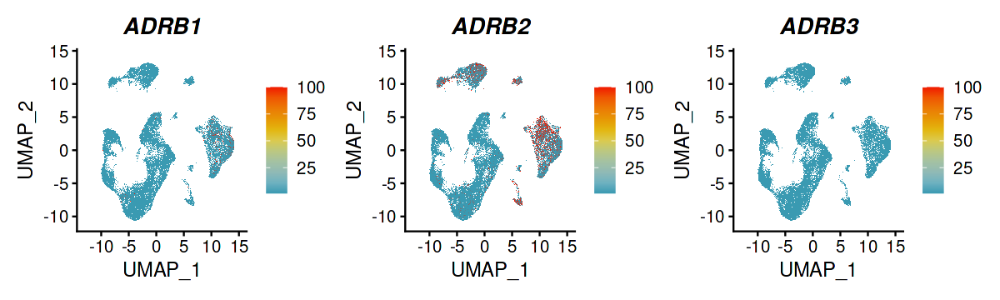

In [36]:
options(repr.plot.width=10, repr.plot.height=3)
FeaturePlot(czi, features =c('ADRB1','ADRB2','ADRB3'), ncol=3, col=pal, order = T,max.cutoff = 0.1)&theme( plot.title = element_text(face='bold.italic'))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


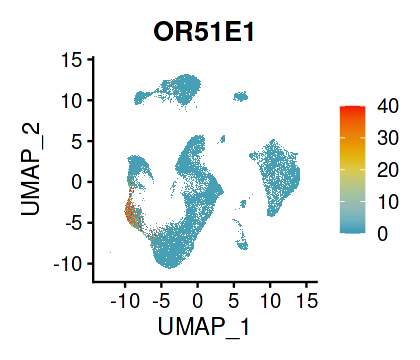

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


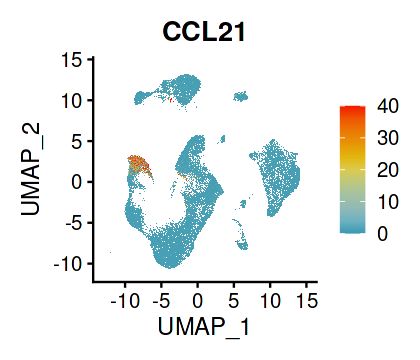

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


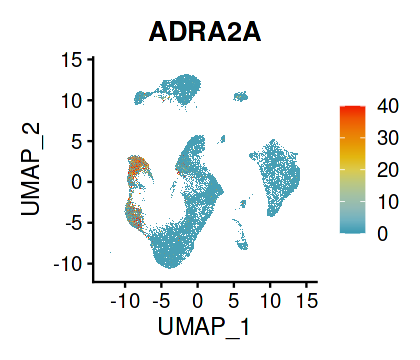

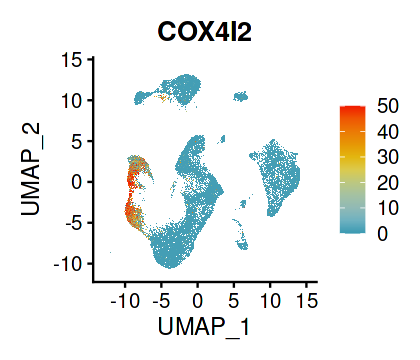

In [37]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=3.5, repr.plot.height=3)
FeaturePlot(czi, features = c('OR51E1'), ncol=1, col=pal, order = T,min.cutoff = NA ,max.cutoff=NA)+ 
scale_color_gradientn(
  colors = pal,
  limits = c(0, 40), oob = scales::squish
)
FeaturePlot(czi, features = c('CCL21'), ncol=1, col=pal, order = T,min.cutoff = NA,max.cutoff=NA) +
scale_color_gradientn(
  colors = pal,
  limits = c(0, 40), oob = scales::squish
)
FeaturePlot(czi, features = c('ADRA2A'), ncol=1, col=pal, order = T,min.cutoff = NA,max.cutoff=NA)+ 
scale_color_gradientn(
  colors = pal,
  limits = c(0, 40), oob = scales::squish
)
FeaturePlot(czi, features = c('COX4I2'), ncol=1, col=pal, order = T,min.cutoff = NA,max.cutoff=NA)+ 
scale_color_gradientn(
  colors = pal,
  limits = c(0, 50), oob = scales::squish
)

In [11]:
DefaultAssay(czi)<-'SCT'
collagen=list(c('FKBP10', 'COL18A1', 'TNXB', 'COL14A1', 'LUM', 'DPT', 'LOXL1', 'COL1A1', 'COMP', 'COL3A1', 'SFRP2', 'COL1A2', 'COL5A1', 'LOX', 'COL5A2', 'COL6A1', 'FMOD', 'DDR2'))
czi<- AddModuleScore(object = czi,features = collagen,ctrl = 5,name = 'collagen')

In [12]:
ecm=list(c('VIT', 'PDGFRA', 'COL14A1', 'MMP2', 'FBLN1', 'TNFRSF11B', 'NPNT', 'FBLN2', 'COL1A1', 'ADAMTS5', 'COL3A1', 'CCDC80', 'PRDX4', 'COL1A2', 'CRISPLD2', 'ABI3BP', 'MMP23B', 'COL5A2', 'ITGA8', 'TGFBI', 'MATN2',
          'SNED1', 'TNXB', 'ITGB2', 'FN1', 'NID1', 'NPNT', 'LYVE1', 'FBLN5', 'SGCE', 'COL3A1', 'BCAM', 'ITGA8', 'ZYX', 'ITGBL1', 'ITGA7', 'ITGA6', 'SVEP1', 'CD34'))
czi<- AddModuleScore(object = czi,features = ecm,ctrl = 5,name = 'ECM')

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



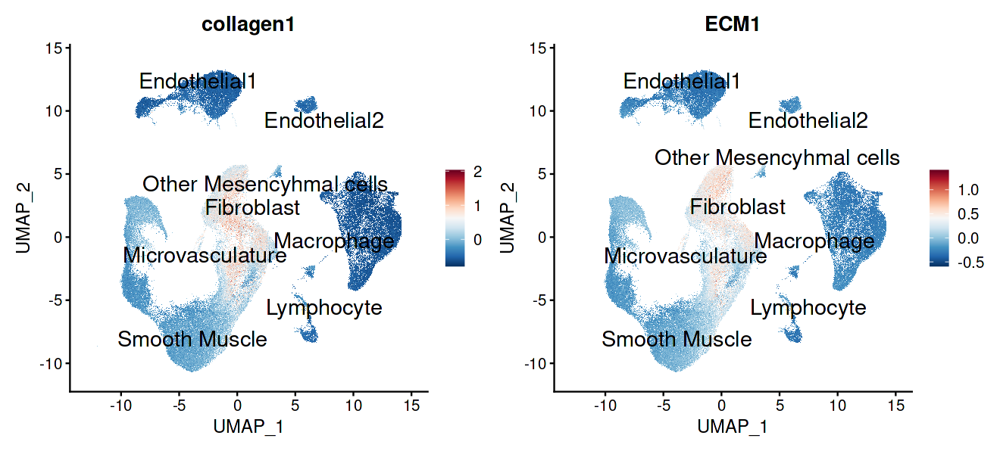

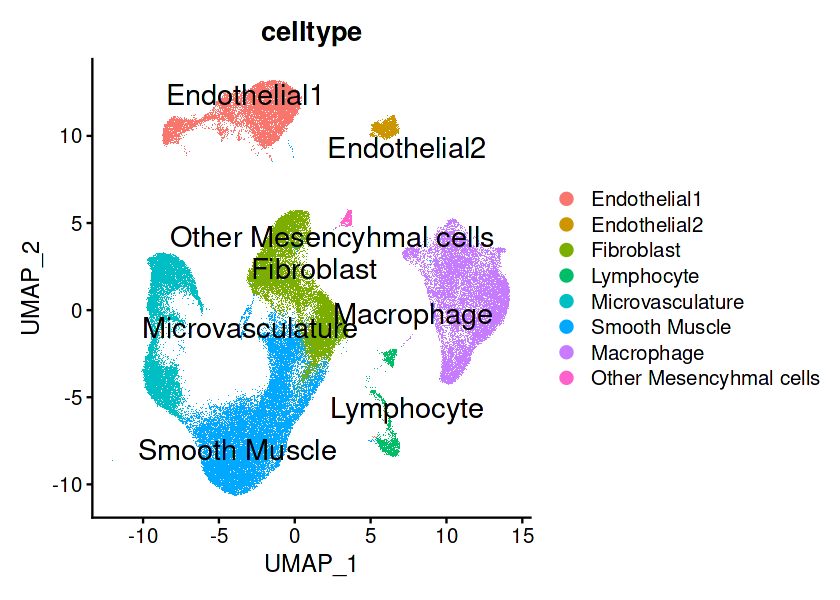

In [17]:
options(repr.plot.width=11, repr.plot.height=5)
FeaturePlot(czi,
            features = c('collagen1',"ECM1"), label = TRUE, repel = TRUE,label.size = 6) &
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(czi, reduction = "umap", group.by = "celltype", label = T, label.size = 6,repel = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



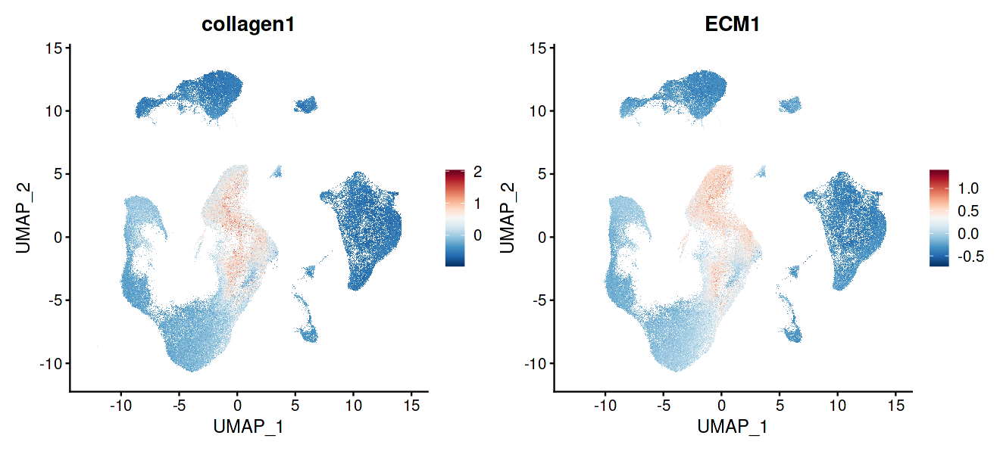

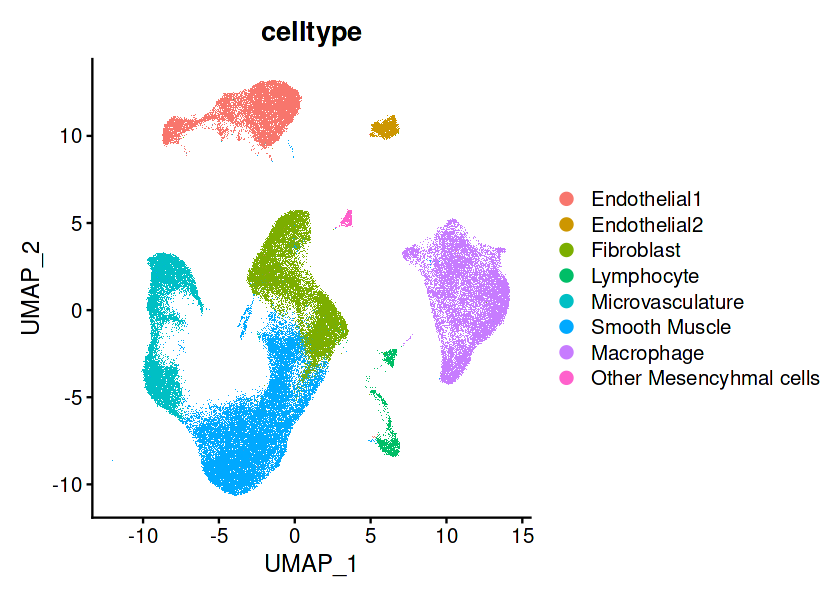

In [13]:
options(repr.plot.width=11, repr.plot.height=5)
FeaturePlot(czi,
            features = c('collagen1',"ECM1"), label = F, repel = TRUE,label.size = 6) &
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(czi, reduction = "umap", group.by = "celltype", label = F, label.size = 6,repel = TRUE)

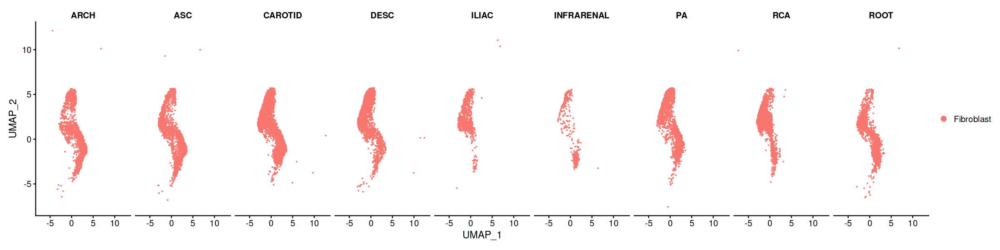

In [212]:
options(repr.plot.width=20, repr.plot.height=5)
DimPlot(fb, reduction = "umap", split.by ='Site',label = F, label.size = 5,repel = TRUE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


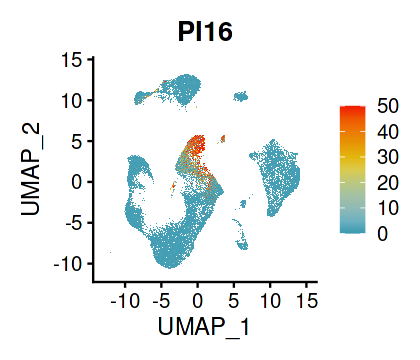

In [38]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=3.5, repr.plot.height=3)
FeaturePlot(czi, features = c('PI16'), ncol=1, col=pal, order = T,min.cutoff = NA,max.cutoff=NA)+ 
scale_color_gradientn(
  colors = pal,
  limits = c(0, 50), oob = scales::squish
)

In [59]:
DefaultAssay(fb)<-'integrated'
fb<-FindVariableFeatures(fb,verbose = F)
fb<-RunPCA(fb,verbose = F)
fb<-FindNeighbors(fb, dims = 1:20,verbose = F)
fb<-RunUMAP(fb, dims = 1:20,verbose = F)

In [60]:
fb<-FindClusters(fb, resolution=0.2, dims = 1:20,verbose = F)

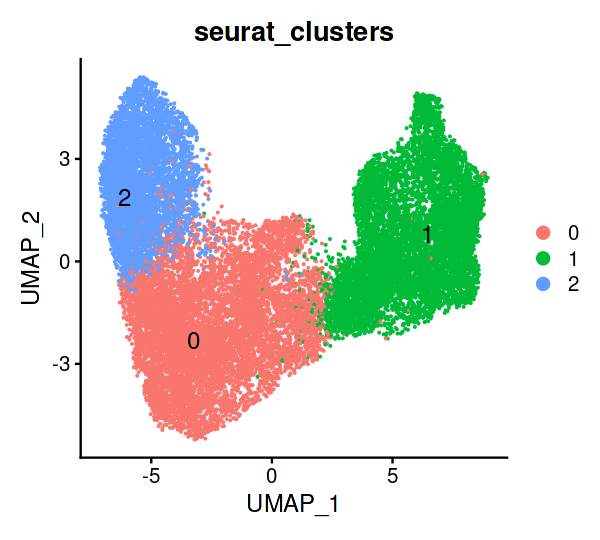

In [61]:
options(repr.plot.width=5, repr.plot.height=4.5)
DimPlot(fb, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'seurat_clusters')

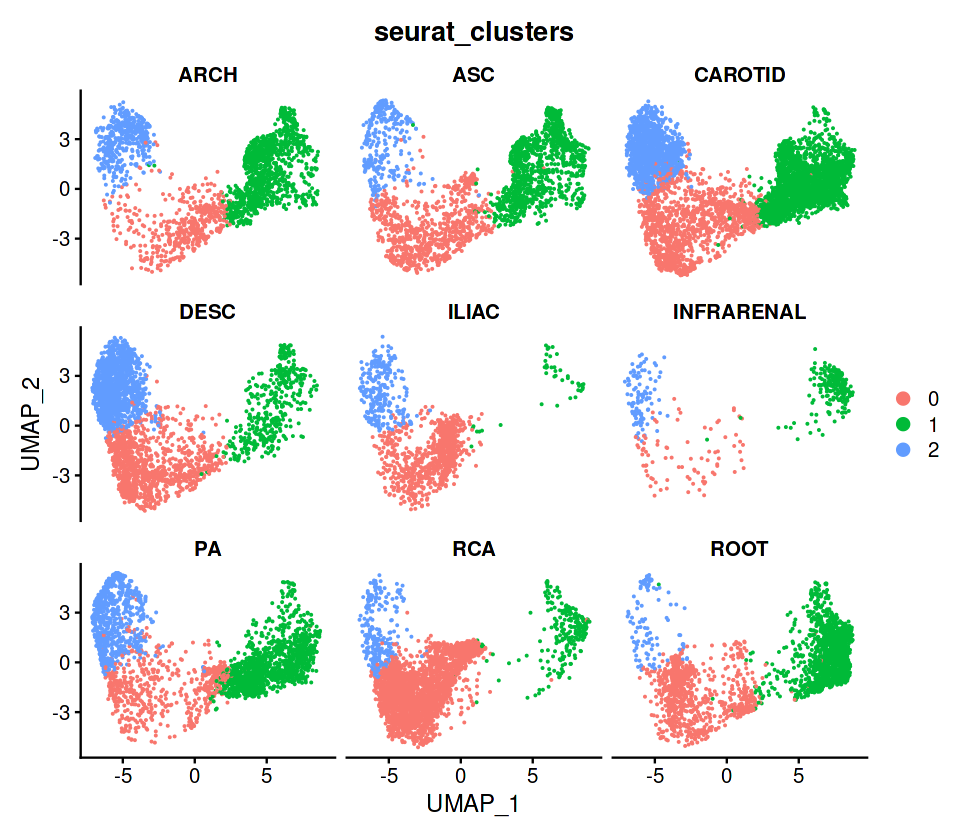

In [700]:
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(fb, split.by = "Site", ncol = 3,group.by = 'seurat_clusters')

In [170]:
Idents(fb)<-fb$Site
levels(fb)

[1] "RCA"        "ASC"        "ARCH"       "DESC"       "INFRARENAL"
[6] "ILIAC"      "PA"         "CAROTID"    "ROOT"

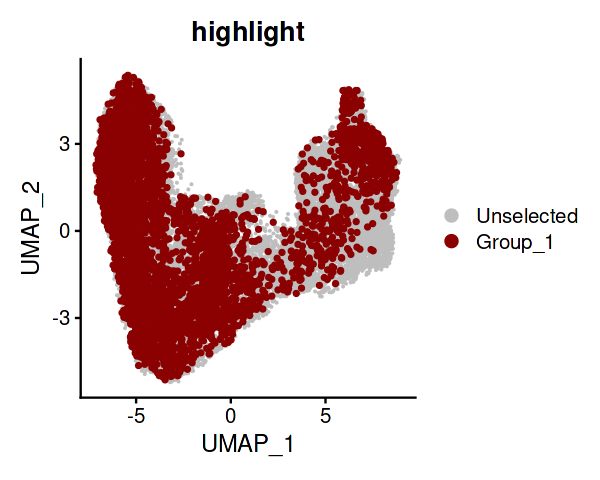

In [173]:
options(repr.plot.width=5, repr.plot.height=4)
DimPlot(fb, label=F, group.by="Site", cells.highlight= list( WhichCells(fb, idents = c("INFRARENAL",'ILIAC','DESC'))),
        cols.highlight = c( "darkred"), cols= "grey")

In [62]:
fb<-FindClusters(fb, resolution=1, dims = 1:20,verbose = F)

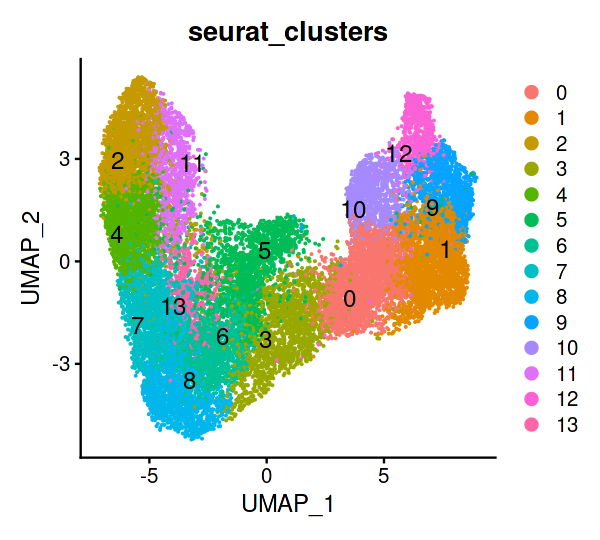

In [63]:
options(repr.plot.width=5, repr.plot.height=4.5)
DimPlot(fb, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'seurat_clusters')

In [64]:
subset(fb,idents=c('12','9'),invert=T)->fb1

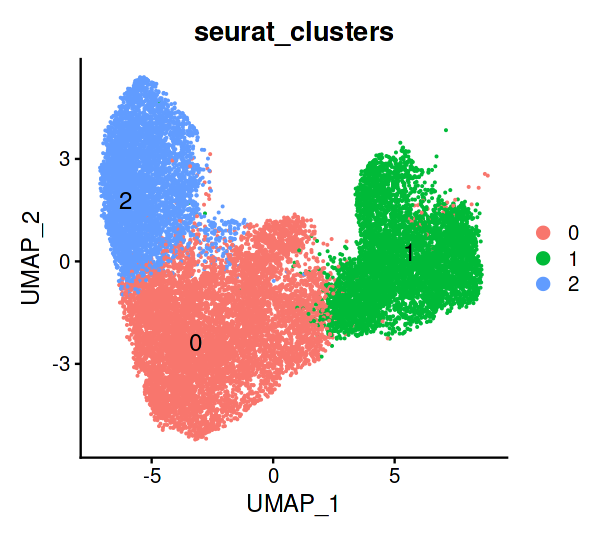

In [65]:
fb1<-FindNeighbors(fb1, dims = 1:20,verbose = F)
fb1<-FindClusters(fb1, resolution=0.1, dims = 1:20,verbose = F)
options(repr.plot.width=5, repr.plot.height=4.5)
DimPlot(fb1, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'seurat_clusters')

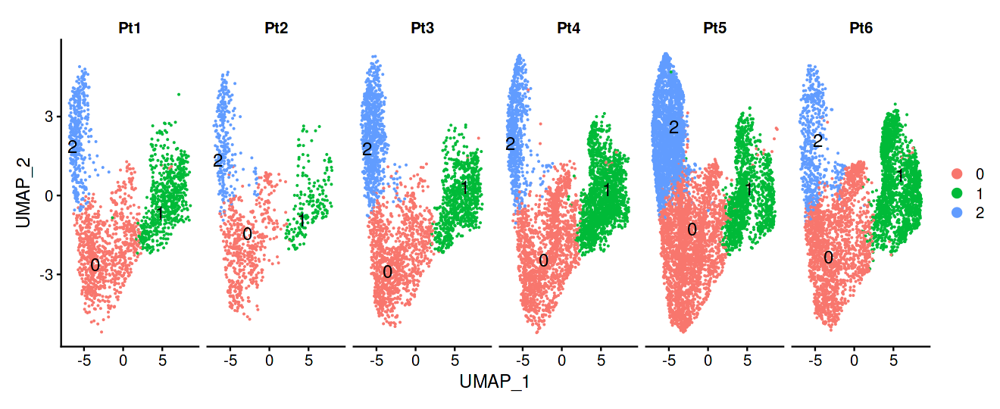

In [110]:
options(repr.plot.width=11, repr.plot.height=4.5)
DimPlot(fb1, reduction = "umap", label = T, label.size = 5,repel = TRUE,split.by = 'Pt')

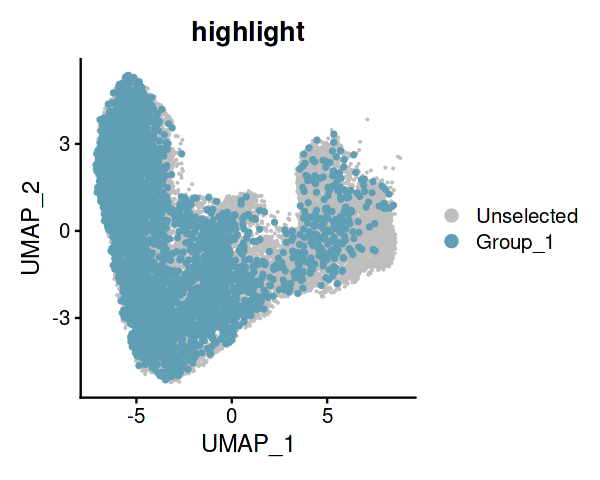

In [191]:
fb1$Site->Idents(fb1)
options(repr.plot.width=5, repr.plot.height=4)
DimPlot(fb1, label=F, group.by="Site", cells.highlight= list( WhichCells(fb1, idents = c("INFRARENAL",'ILIAC','DESC'))),
        cols.highlight = c( "#5F9EB4"), cols= "grey")

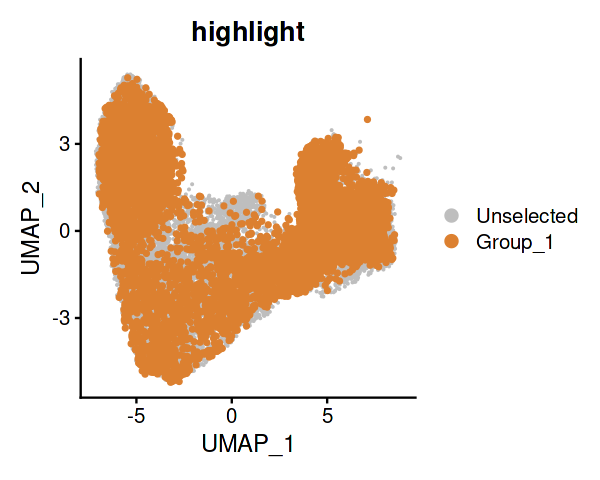

In [192]:
options(repr.plot.width=5, repr.plot.height=4)
DimPlot(fb1, label=F, group.by="Site", cells.highlight= list( WhichCells(fb1, idents = c("CAROTID",'ARCH'))),
        cols.highlight = c( "#DC8030"), cols= "grey")

In [117]:
subset(fb1, subset=Pt=="Pt1")->fb1_pt1

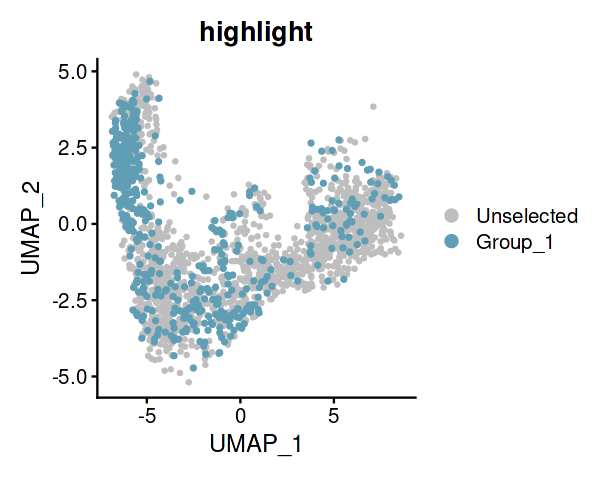

In [119]:
fb1$Site->Idents(fb1)
options(repr.plot.width=5, repr.plot.height=4)
DimPlot(fb1_pt1, label=F, group.by="Site", cells.highlight= list( WhichCells(fb1, idents = c("INFRARENAL",'ILIAC','DESC'))),
        cols.highlight = c( "#5F9EB4"), cols= "grey")

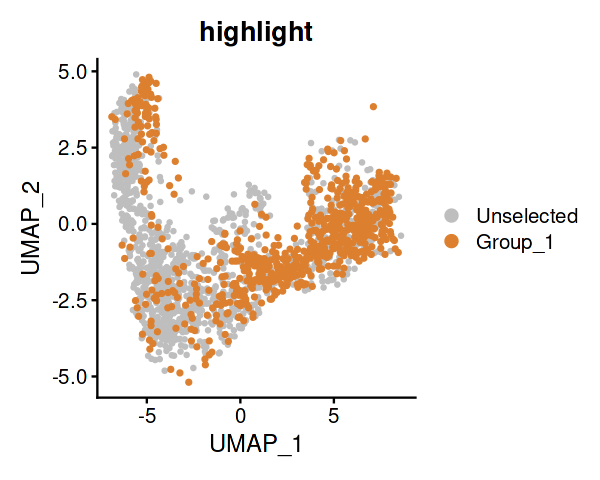

In [121]:
options(repr.plot.width=5, repr.plot.height=4)
DimPlot(fb1_pt1, label=F, group.by="Site", cells.highlight= list( WhichCells(fb1, idents = c("CAROTID",'ARCH'))),
        cols.highlight = c( "#DC8030"), cols= "grey")

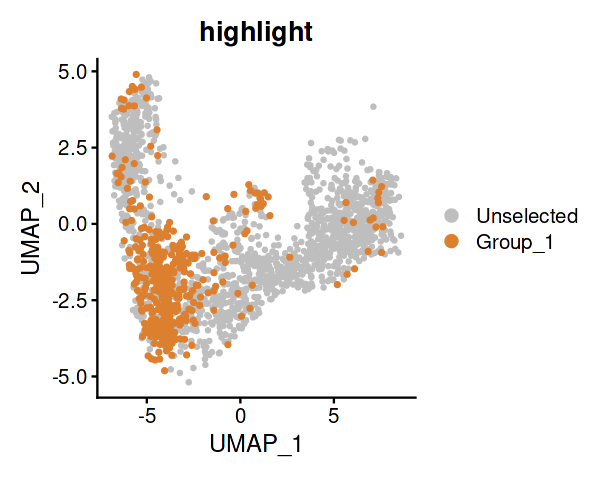

In [122]:
options(repr.plot.width=5, repr.plot.height=4)
DimPlot(fb1_pt1, label=F, group.by="Site", cells.highlight= list( WhichCells(fb1, idents = c("RCA"))),
        cols.highlight = c( "#DC8030"), cols= "grey")

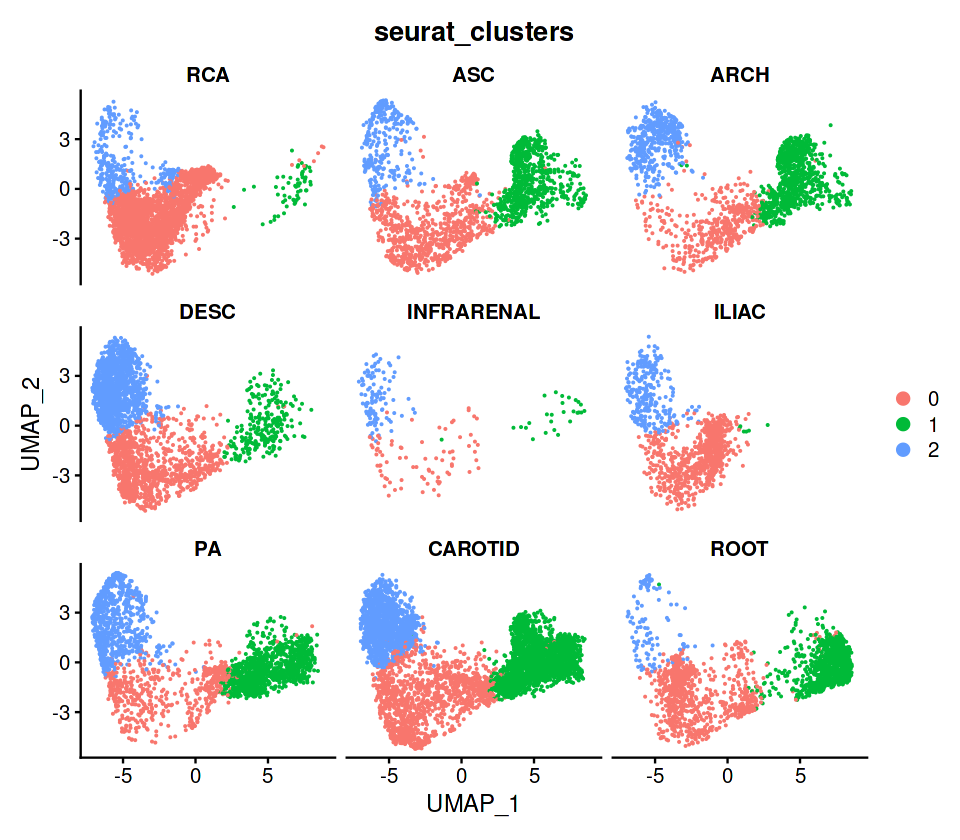

In [67]:
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(fb1, split.by = "Site", ncol = 3,group.by = 'seurat_clusters')

In [98]:
dcast(as.data.frame(table(fb1$Site,fb1$seurat_clusters)),Var1~Var2)->dat

Using Freq as value column: use value.var to override.



In [99]:
rownames(dat)<-dat$Var1
dat[2:4]->dat

In [100]:
rowSums(dat)->dat$sum
dat$`0`/dat$sum->dat$pct0
dat$`1`/dat$sum->dat$pct1
dat$`2`/dat$sum->dat$pct2

In [101]:
dat[5:7]->dat
rownames(dat)->dat$seg
melt(dat)->dat1

Using seg as id variables



In [109]:
dat

,pct0,pct1,pct2,seg
,<dbl>,<dbl>,<dbl>,<chr>
RCA,0.8614029,0.018976618,0.11962047,RCA
ASC,0.4510662,0.387643521,0.16129032,ASC
ARCH,0.2506667,0.491733333,0.25760000,ARCH
DESC,0.4083901,0.089996414,0.50161348,DESC
INFRARENAL,0.3696682,0.127962085,0.50236967,INFRARENAL
ILIAC,0.7590150,0.005277045,0.23570800,ILIAC
PA,0.2305511,0.459076175,0.31037277,PA
CAROTID,0.2754429,0.439637412,0.28491965,CAROTID
ROOT,0.4503220,0.496780129,0.05289788,ROOT


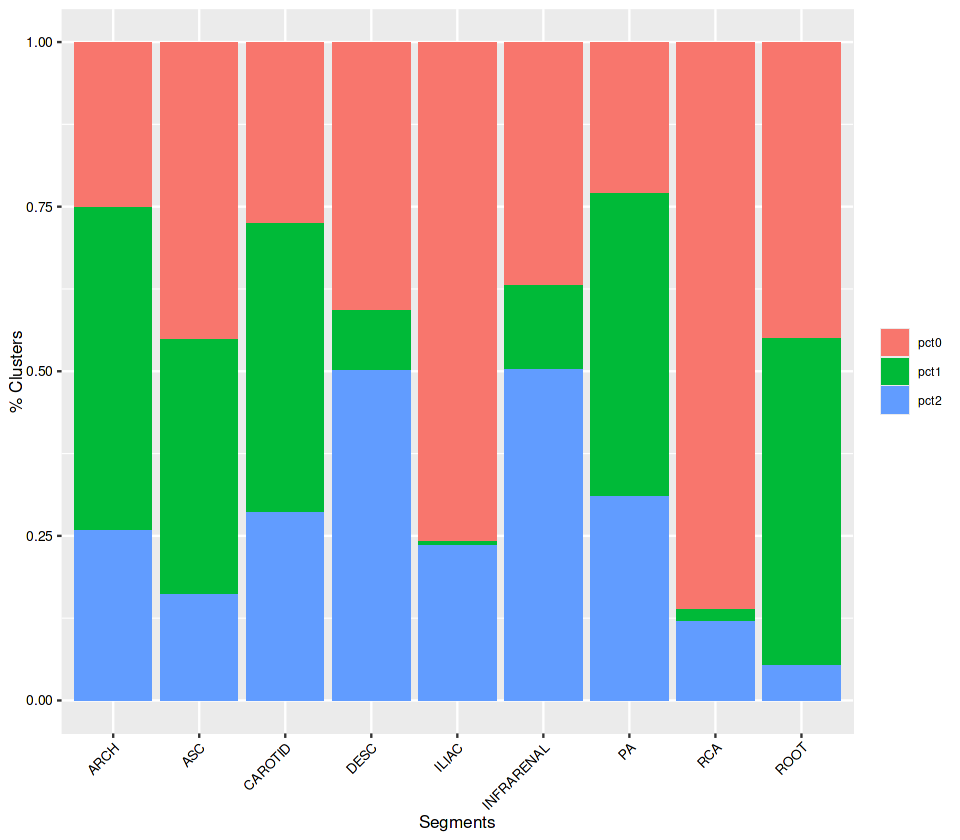

In [108]:
ggplot(dat1,aes(x=seg,y=value,fill=variable))+
	geom_bar(stat="identity")+
	theme(
		legend.text = element_text(size=7), 
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent"),
		axis.text.y = element_text(size=8,colour = 'black'),
		axis.title = element_text(size=10,colour = 'black'),
		axis.text.x =element_text(size=8,colour = 'black',angle = 45, hjust=1)
	)+
		xlab("Segments")+
		ylab("% Clusters")

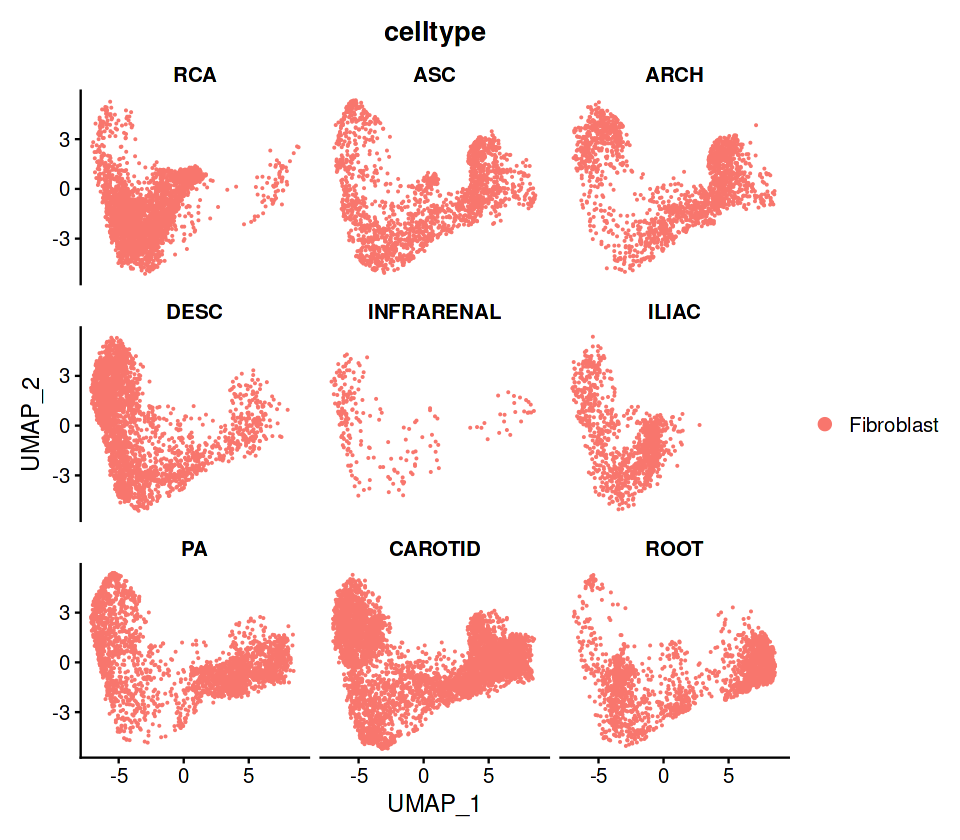

In [66]:
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(fb1, split.by = "Site", ncol = 3,group.by = 'celltype')

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



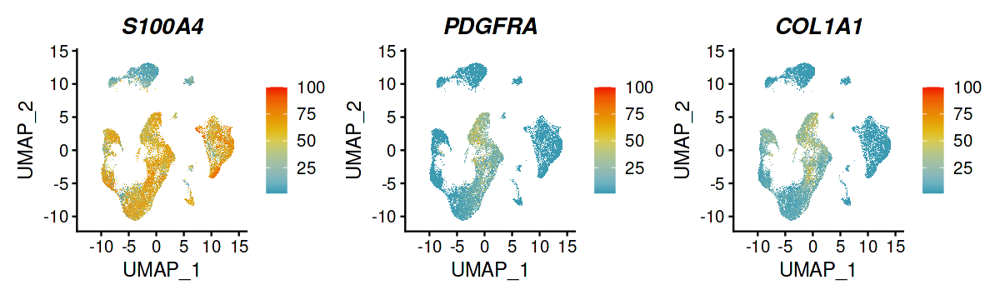

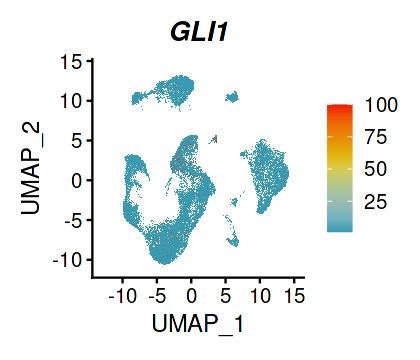

In [59]:
DefaultAssay(czi)<-'SCT'
options(repr.plot.width=10, repr.plot.height=3)
FeaturePlot(czi, features = c('S100A4','PDGFRA','COL1A1'), ncol=3, col=pal, order = T)&theme( plot.title = element_text(face='bold.italic'))
options(repr.plot.width=3.5, repr.plot.height=3)
FeaturePlot(czi, features = c('GLI1'), ncol=1, col=pal, order = T,max.cutoff = 0.1)&theme( plot.title = element_text(face='bold.italic'))

In [109]:
read.table('Markers/FB_mk.txt',sep='\t',fill=NA,header=T)->dat
rownames(dat)->dat$rank
dat<- dat[seq(dim(dat)[1],1),]
dat<-transform(dat,rank=factor(rank,levels=unique(rank)))

In [110]:
head(dat)

,id,pval,logFC,pct.1,pct.2,p.adj,cell,gene,label,rank
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<fct>
648,GLI1,0,1.4750849,0.050,0.064,0,Fibroblast,GLI1,GLI1,648
647,HLA-DRA,0,-1.0389623,0.238,0.534,0,Fibroblast,HLA-DRA,,647
646,RGS5.1,0,-0.9615243,0.188,0.523,0,Fibroblast,RGS5,,646
645,HLA-DRB1.1,0,-0.9571471,0.295,0.534,0,Fibroblast,HLA-DRB1,,645
644,RNASE1.1,0,-0.9529953,0.210,0.520,0,Fibroblast,RNASE1,,644
643,CD74.1,0,-0.9010951,0.480,0.612,0,Fibroblast,CD74,,643


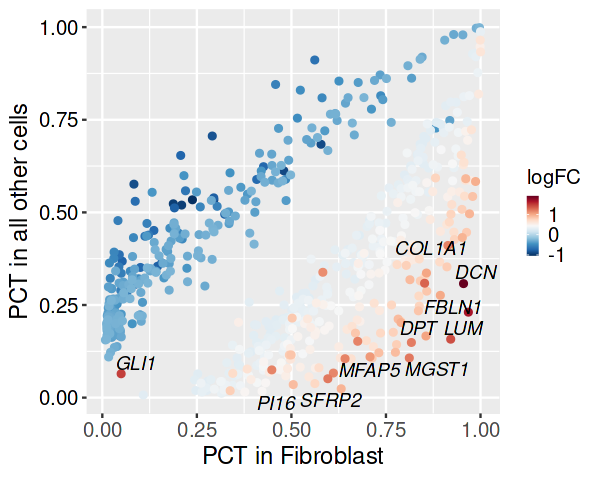

In [111]:
options(repr.plot.width=5, repr.plot.height=4)
ggplot(dat,aes(x=pct.1,y=pct.2,label = label))+
    geom_jitter(aes(color=logFC))+
    geom_text_repel(max.overlaps = 20,box.padding = 0.1,fontface = "italic")+
     scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
	theme( 
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=12),
		axis.title.x = element_text(size=14),
        axis.title.y = element_text(size=14),
		legend.key.size = unit(0.1,"inches"),
		legend.text = element_text(size=12),
		legend.title = element_text(size=12),
		legend.background = element_rect(fill="transparent"),
		plot.title = element_text(hjust = 0.5,size=16)
	)+
	ylab("PCT in all other cells")+
	xlab("PCT in Fibroblast")

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



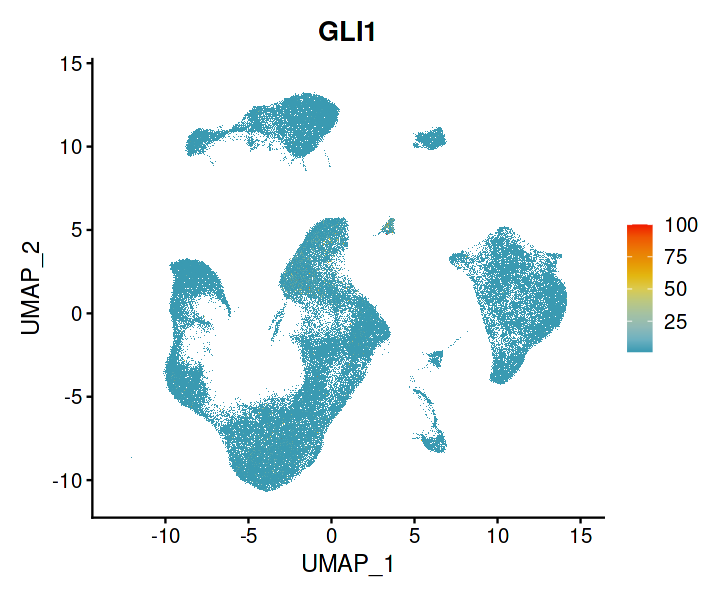

In [243]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=6, repr.plot.height=5)
FeaturePlot(czi,features = c("GLI1"), cols = pal)

In [10]:
a <- DotPlot(object = czi, features = 'GLI1',group.by = 'celltype2',assay = 'RNA')
a$data

,avg.exp,pct.exp,features.plot,id,avg.exp.scaled
,<dbl>,<dbl>,<fct>,<fct>,<dbl>
GLI1,0.002478288,0.3641591,GLI1,Macrophage,-0.5249035
GLI11,0.003693470,0.4915776,GLI1,Microvasculature,-0.4515568
GLI12,0.047431538,5.1821827,GLI1,Fibroblast,2.1884101
GLI13,0.002878937,0.4560301,GLI1,Endothelial1,-0.5007209
GLI14,0.014562527,1.8172700,GLI1,Smooth Muscle,0.2044838
GLI15,0.001947561,0.1328021,GLI1,Lymphocyte,-0.5569374
GLI16,0.005230642,0.6486486,GLI1,Endothelial2,-0.3587753


In [9]:
levels(czi$celltype2)

[1] "Endothelial1"     "Endothelial2"     "Fibroblast"       "Lymphocyte"      
[5] "Microvasculature" "Smooth Muscle"    "Macrophage"

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



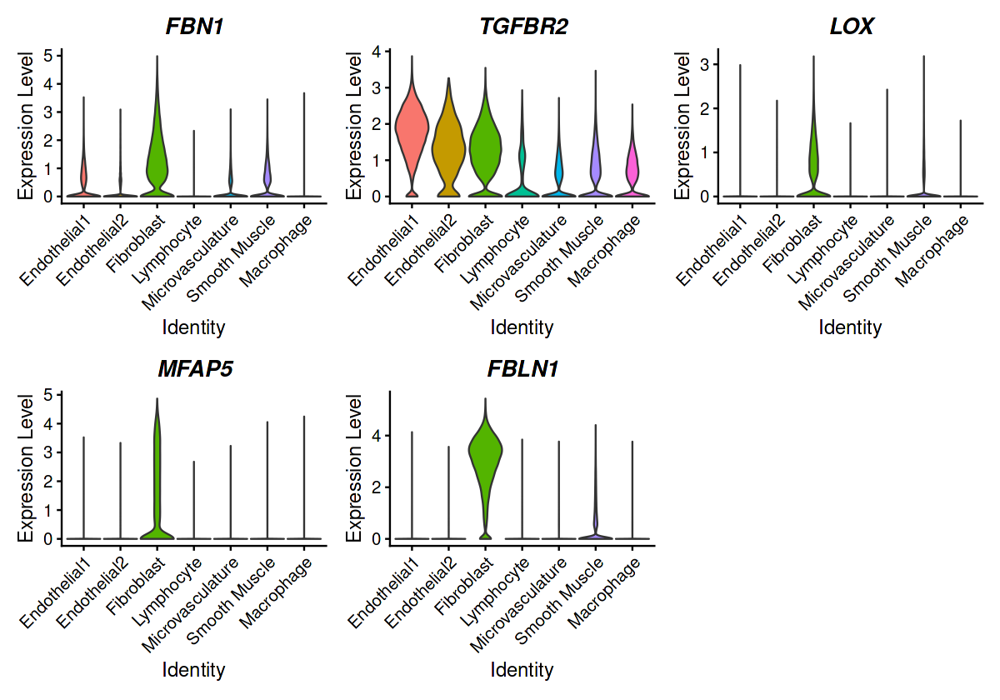

In [58]:
DefaultAssay(czi)<-'RNA'
options(repr.plot.width=10, repr.plot.height=7)
VlnPlot(czi, features = c('FBN1','TGFBR2','LOX','MFAP5','FBLN1'),  ncol=3,pt.size=0,group.by = 'celltype2')&theme( plot.title = element_text(face='bold.italic'))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



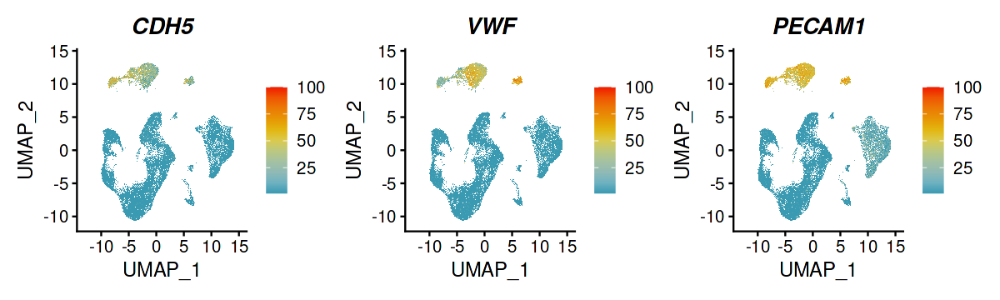

In [60]:
DefaultAssay(czi)<-'SCT'
options(repr.plot.width=10, repr.plot.height=3)
FeaturePlot(czi, features = c('CDH5','VWF','PECAM1'), ncol=3, col=pal, order = T)&theme( plot.title = element_text(face='bold.italic'))

In [53]:
subset(czi, subset=celltype=='Endothelial')->ec

In [54]:
DefaultAssay(ec)<-'integrated'
ec<-FindVariableFeatures(ec,verbose = F)
ec<-RunPCA(ec,verbose = F)
ec<-FindNeighbors(ec, dims = 1:20,verbose = F)
ec<-FindClusters(ec, resolution=0.5, dims = 1:20,verbose = F)
ec<-RunUMAP(ec, dims = 1:20,verbose = F)

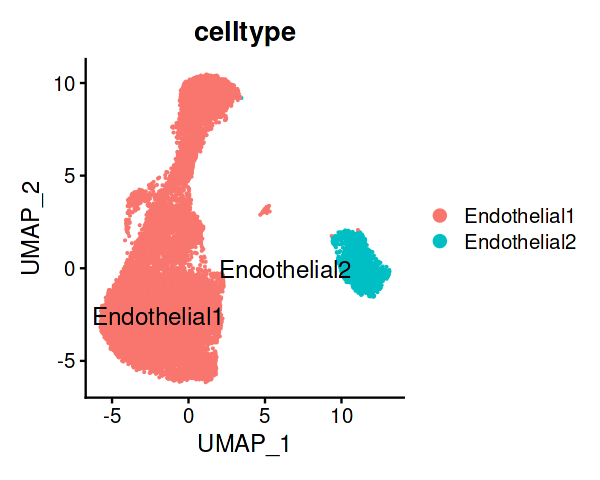

In [290]:
options(repr.plot.width=5, repr.plot.height=4)
DimPlot(ec, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'celltype')

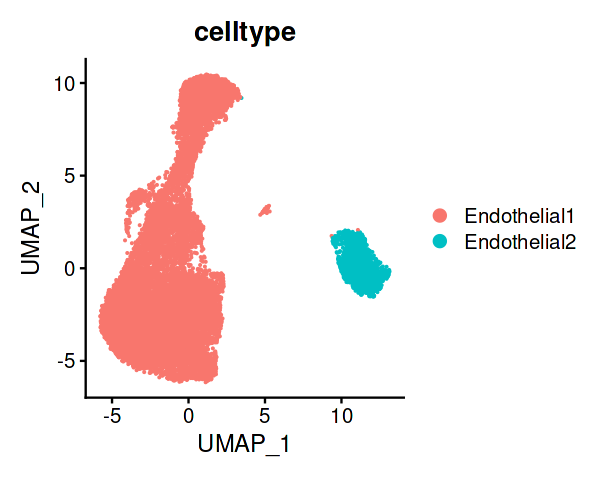

In [17]:
options(repr.plot.width=5, repr.plot.height=4)
DimPlot(ec, reduction = "umap", label = F, label.size = 5,repel = TRUE,group.by = 'celltype')

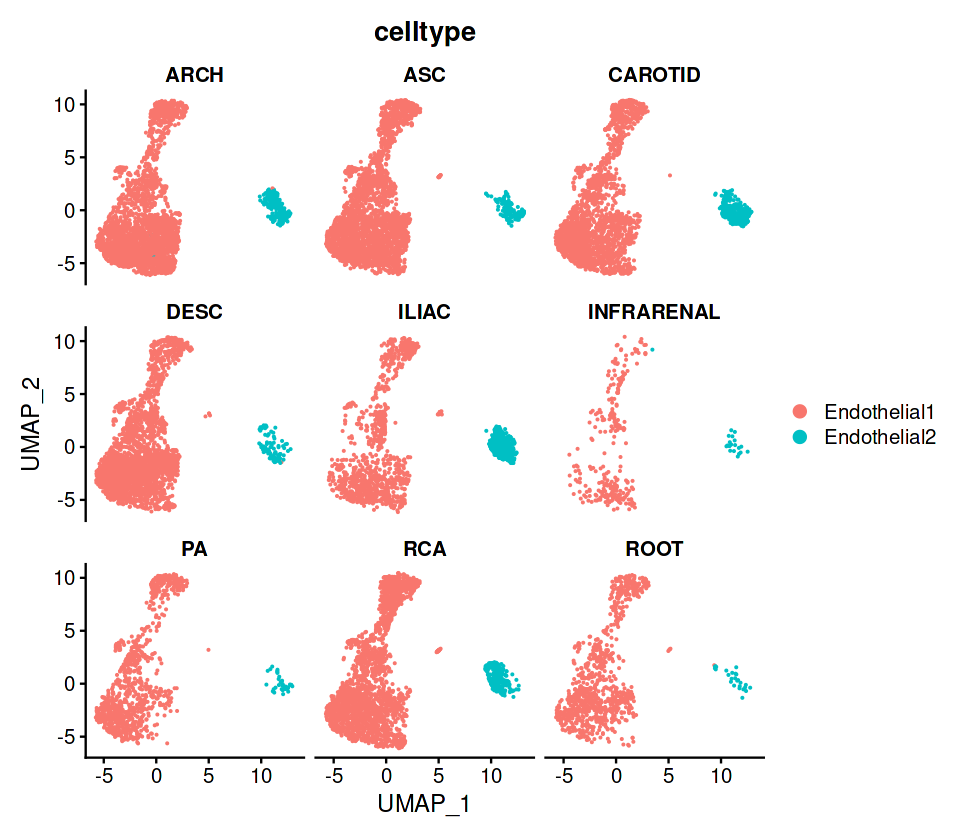

In [250]:
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(ec, split.by = "Site", ncol = 3,group.by = 'celltype')

In [44]:
subset(czi, subset=celltype2=='Endothelial1')->endo1

In [43]:
table(czi$celltype2)


    Endothelial1     Endothelial2       Fibroblast       Lymphocyte 
           16227             1850            22944             2259 
Microvasculature    Smooth Muscle       Macrophage 
           15257            33897            20870 

In [46]:
DefaultAssay(endo1)<-'integrated'
endo1<-FindVariableFeatures(endo1,verbose = F)
endo1<-RunPCA(endo1,verbose = F)
endo1<-FindNeighbors(endo1, dims = 1:20,verbose = F)
endo1<-RunUMAP(endo1, dims = 1:20,verbose = F)

In [47]:
endo1<-FindClusters(endo1, resolution = 0.05,verbose = F)

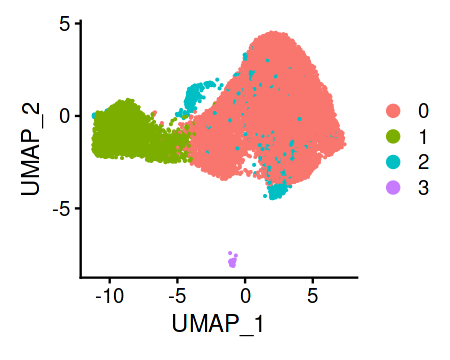

In [6]:
options(repr.plot.width=3.75, repr.plot.height=3)
DimPlot(endo1, reduction = "umap", label = F, label.size = 5,repel = TRUE)

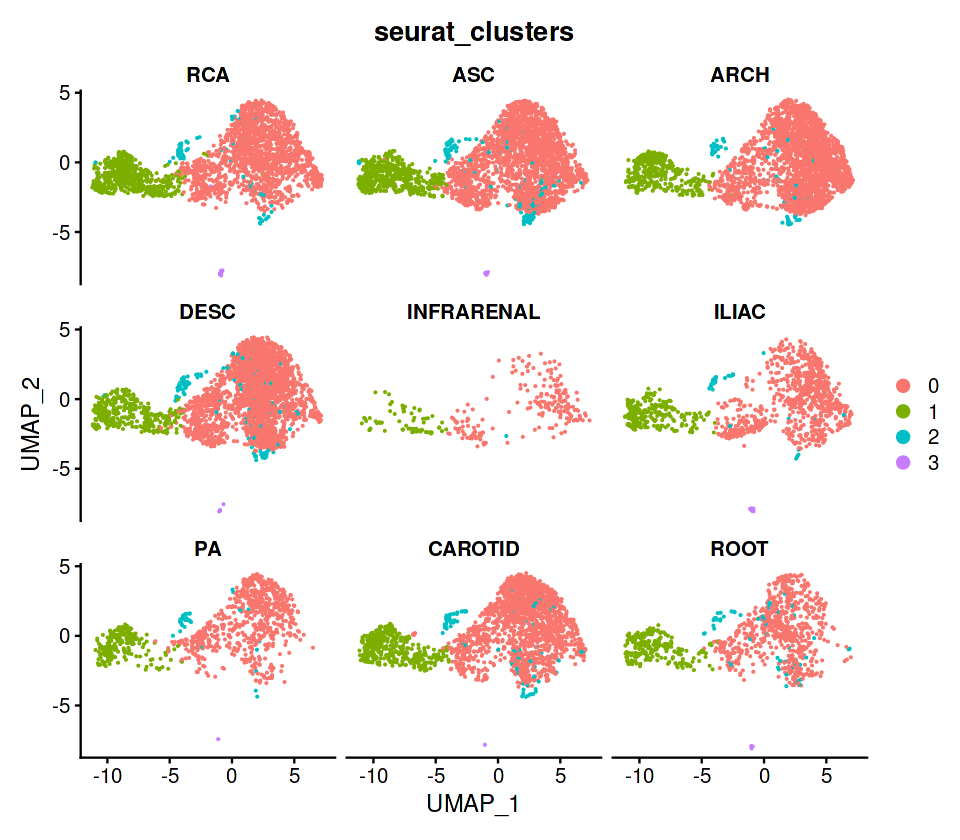

In [7]:
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(endo1, split.by = "Site", ncol = 3,group.by = 'seurat_clusters')

In [10]:
SCTransform(endo1,verbose = F)->endo1

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


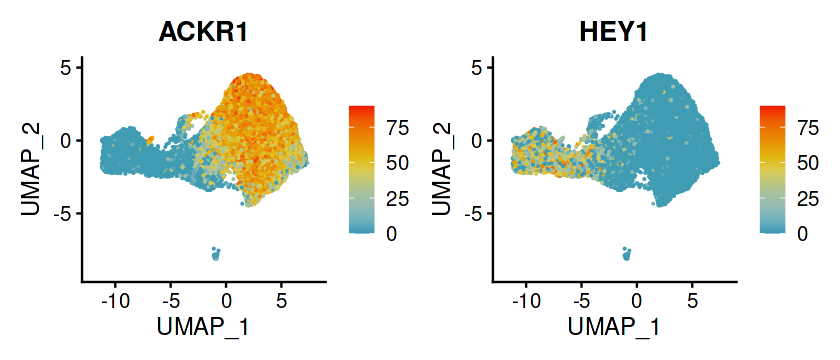

In [48]:
DefaultAssay(endo1)<-'RNA'
options(repr.plot.width=7, repr.plot.height=3)
FeaturePlot(endo1, features = c('ACKR1','HEY1'), ncol=2, col=pal,order=F)& 
scale_color_gradientn(
  colors = pal,
  limits = c(0, 90), oob = scales::squish
)

In [ ]:
DefaultAssay(czi)<-'SCT'
options(repr.plot.width=7, repr.plot.height=3)
VlnPlot(czi, features = c('ACKR1','HEY1'), ncol=2,pt.size=0,group.by='celltype')

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



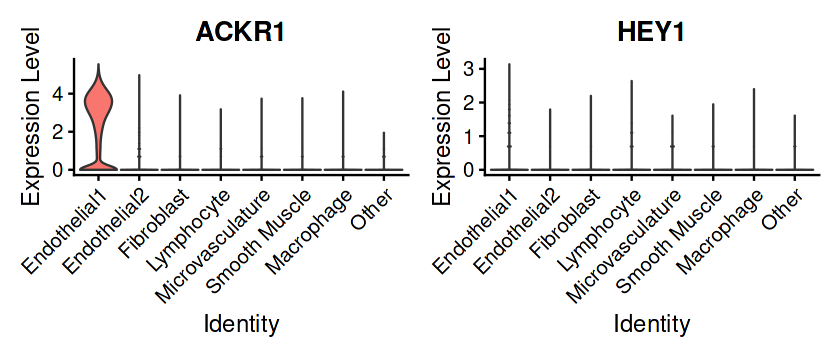

In [7]:
DefaultAssay(czi)<-'SCT'
options(repr.plot.width=7, repr.plot.height=3)
VlnPlot(czi, features = c('ACKR1','HEY1'), ncol=2,pt.size=0,group.by='celltype')

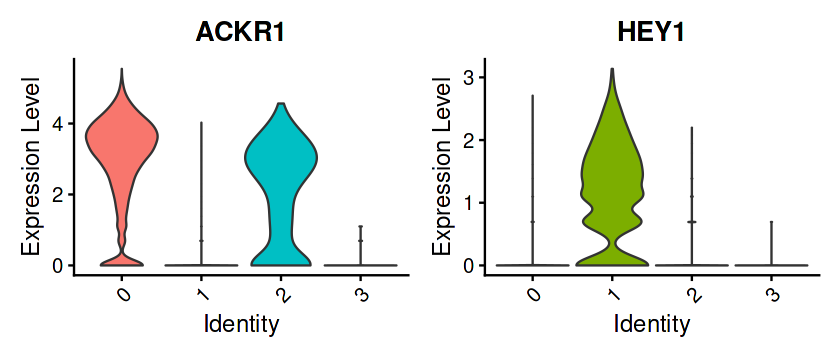

In [8]:
DefaultAssay(endo1)<-'SCT'
options(repr.plot.width=7, repr.plot.height=3)
VlnPlot(endo1, features = c('ACKR1','HEY1'), ncol=2,pt.size=0)

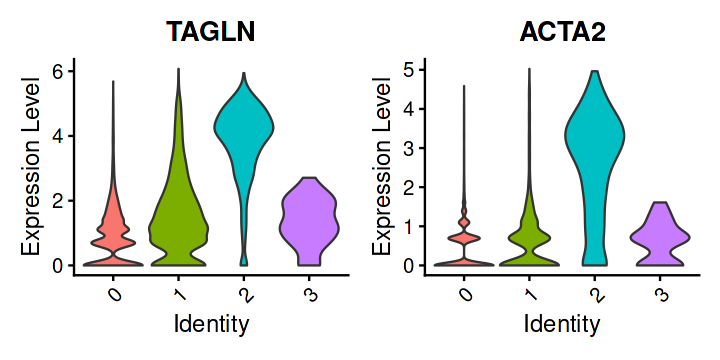

In [9]:
DefaultAssay(endo1)<-'SCT'
options(repr.plot.width=6, repr.plot.height=3)
VlnPlot(endo1, features = c('TAGLN','ACTA2'),  ncol=2,pt.size=0)

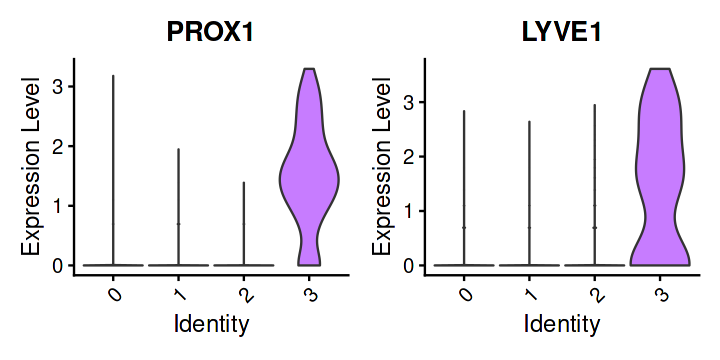

In [10]:
DefaultAssay(endo1)<-'SCT'
options(repr.plot.width=6, repr.plot.height=3)
VlnPlot(endo1, features = c('PROX1','LYVE1'),  ncol=2,pt.size=0)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


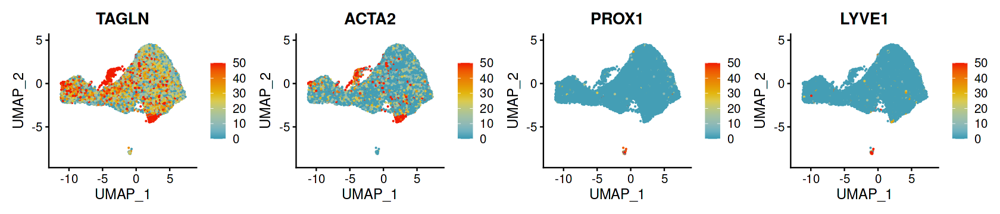

In [50]:
DefaultAssay(endo1)<-'RNA'
options(repr.plot.width=14, repr.plot.height=3)
FeaturePlot(endo1, features = c('TAGLN','ACTA2','PROX1','LYVE1'), ncol=4, col=pal,order=F)& 
scale_color_gradientn(
  colors = pal,
  limits = c(0, 50), oob = scales::squish
)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


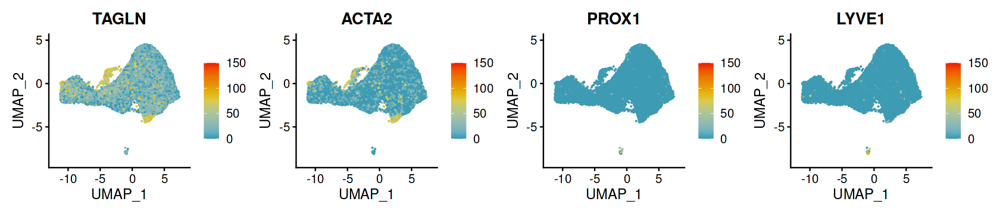

In [65]:
DefaultAssay(endo1)<-'RNA'
options(repr.plot.width=14, repr.plot.height=3)
FeaturePlot(endo1, features = c('TAGLN','ACTA2','PROX1','LYVE1'), ncol=4, col=pal,order=F)& 
scale_color_gradientn(
  colors = pal,
  limits = c(0, 150), oob = scales::squish
)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



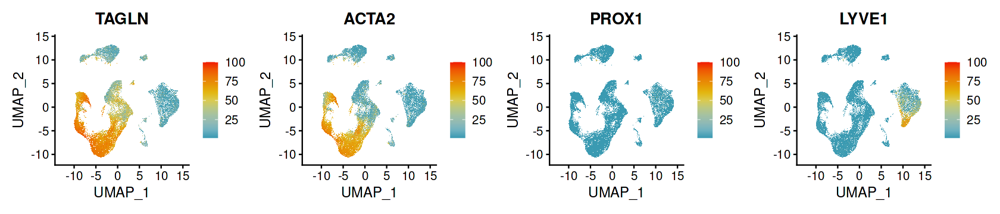

In [58]:
DefaultAssay(czi)<-'SCT'
options(repr.plot.width=14, repr.plot.height=3)
FeaturePlot(czi, features = c('TAGLN','ACTA2','PROX1','LYVE1'), ncol=4, col=pal, order = T)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



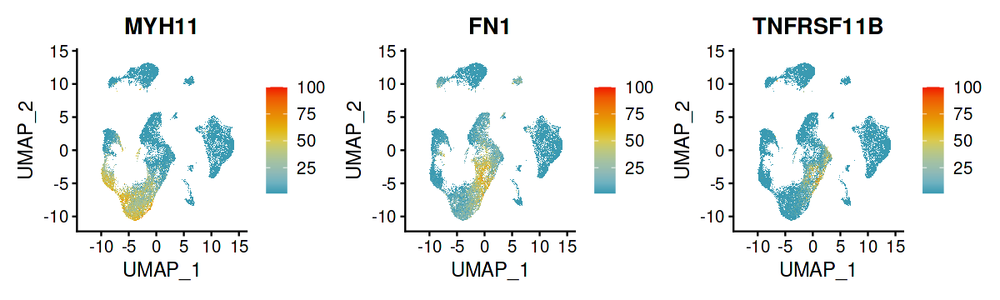

In [8]:
DefaultAssay(czi)<-'SCT'
options(repr.plot.width=10, repr.plot.height=3)
FeaturePlot(czi, features = c('MYH11','FN1','TNFRSF11B'), ncol=3, col=pal, order = T,min.cutoff = 'q30')

In [294]:
DefaultAssay(ec)<-'RNA'
Idents(ec)<-ec$celltype
FindMarkers(ec,ident.1 = 'Endothelial1',ident.2='Endothelial2',assay = 'RNA',slot = 'data',
           only.pos = F,verbose=F)->ec_de

In [297]:
write.table(ec_de,'Markers/EC_2sub_DEG.txt',sep='\t',quote=F)

In [64]:
paste(ec$celltype, ec$Site, sep='_')->ec$type_site

In [304]:
ec$type_site->Idents(ec)
FindAllMarkers(ec,assay = 'RNA',verbose = F,only.pos = T)->ec_site_sub_mk
write.table(ec_site_sub_mk,'Markers/ec_site_2sub_mk.txt',sep = '\t',quote=F)

In [308]:
rownames(ec_site_sub_mk[grep("^HOX*", rownames(ec_site_sub_mk)), ])

[1] "HOMER3"    "HOMER31"   "HOMER32"   "HOXA5"     "HOMER33"   "HOXA4"    
 [7] "HOXB7"     "HOXA10-AS" "HOXA9"     "HOXA10"    "HOXA51"    "HOXB71"   
[13] "HOXA7"     "HOXA3"     "HOXB3"     "HOXB72"    "HOXA91"    "HOXA71"   
[19] "HOXB73"

In [61]:
HOXs<-c('HOXA5', 'HOXA4', 'HOXB7', 'HOXA10-AS', 'HOXA9', 'HOXA10', 'HOXA51', 'HOXB71', 'HOXA7', 'HOXA3', 'HOXB3', 'HOXB72', 'HOXA91', 'HOXA71', 'HOXB73')

In [66]:
ec$type_site->Idents(ec)
levels(ec)

[1] "Endothelial1_RCA"        "Endothelial2_RCA"       
 [3] "Endothelial1_ASC"        "Endothelial2_ASC"       
 [5] "Endothelial1_ARCH"       "Endothelial2_ARCH"      
 [7] "Endothelial1_DESC"       "Endothelial2_DESC"      
 [9] "Endothelial1_INFRARENAL" "Endothelial2_INFRARENAL"
[11] "Endothelial1_ILIAC"      "Endothelial2_ILIAC"     
[13] "Endothelial1_PA"         "Endothelial2_PA"        
[15] "Endothelial1_CAROTID"    "Endothelial2_CAROTID"   
[17] "Endothelial1_ROOT"       "Endothelial2_ROOT"

In [67]:
levels(ec)<-c('Endothelial1_RCA','Endothelial1_ASC','Endothelial1_ARCH','Endothelial1_DESC','Endothelial1_INFRARENAL','Endothelial1_ILIAC','Endothelial1_PA','Endothelial1_CAROTID','Endothelial1_ROOT',
              'Endothelial2_RCA','Endothelial2_ASC','Endothelial2_ARCH','Endothelial2_DESC','Endothelial2_INFRARENAL','Endothelial2_ILIAC','Endothelial2_PA','Endothelial2_CAROTID','Endothelial2_ROOT')

In [69]:
make_italics <- function(x) {
  as.expression(lapply(x, function(y) bquote(italic(.(y)))))
}

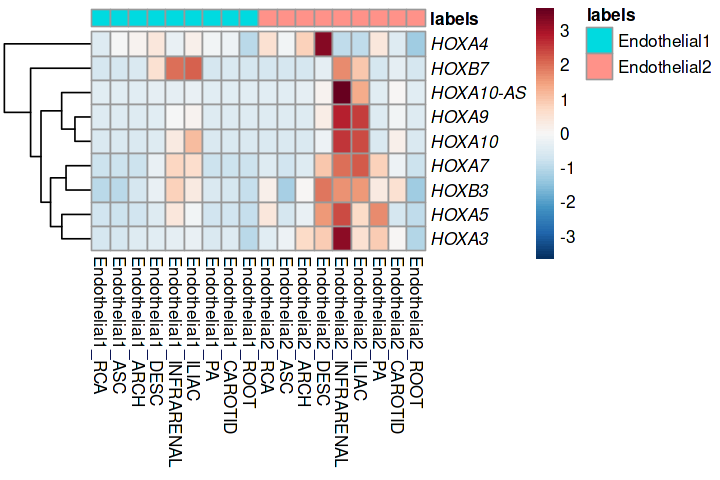

In [71]:
AverageExpression(ec,features = HOXs)->HOXs_exp
HOXs_exp$RNA->dat
labels = c(rep('Endothelial1',9),rep('Endothelial2',9))
anno = data.frame(labels)
rownames(anno) = colnames(dat)
options(repr.plot.width=6, repr.plot.height=4)
pheatmap(dat,color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),cluster_cols = F,annotation_col = anno,scale='row',
        labels_row= make_italics(rownames(dat)))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


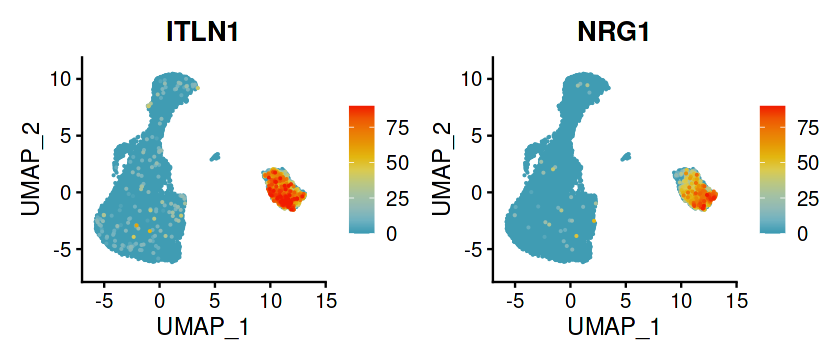

In [56]:
DefaultAssay(ec)<-'RNA'
options(repr.plot.width=7, repr.plot.height=3)
FeaturePlot(ec, features = c('ITLN1','NRG1'), ncol=2, col=pal,order=T)& 
scale_color_gradientn(
  colors = pal,
  limits = c(0, 90), oob = scales::squish
)

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


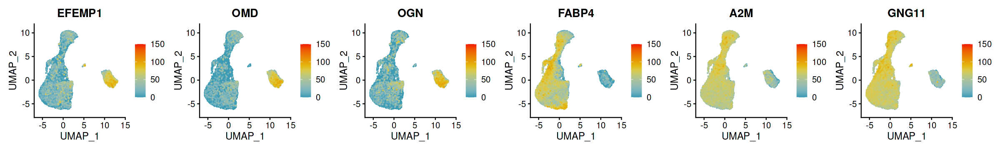

In [74]:
DefaultAssay(ec)<-'RNA'
options(repr.plot.width=20, repr.plot.height=3)
FeaturePlot(ec, features = c('EFEMP1','OMD','OGN','FABP4','A2M','GNG11'), ncol=6, col=pal,order=T)& 
scale_color_gradientn(
  colors = pal,
  limits = c(0, 150), oob = scales::squish
)

In [331]:
table(ec$celltype)


    Endothelial1     Endothelial2       Fibroblast       Lymphocyte 
           16227             1850                0                0 
Microvasculature    Smooth Muscle       Macrophage            Other 
               0                0                0                0 

In [338]:
bp<-read.table('Markers/GO/Endo2_BP.txt',header=T,sep="\t")
bp[1:10,]->bp
bp$Term<-str_split_fixed(bp$Term,"~",2)[,2]
bp<- bp[seq(dim(bp)[1],1),]
bp<-transform(bp,Term=factor(Term,levels=unique(Term)))

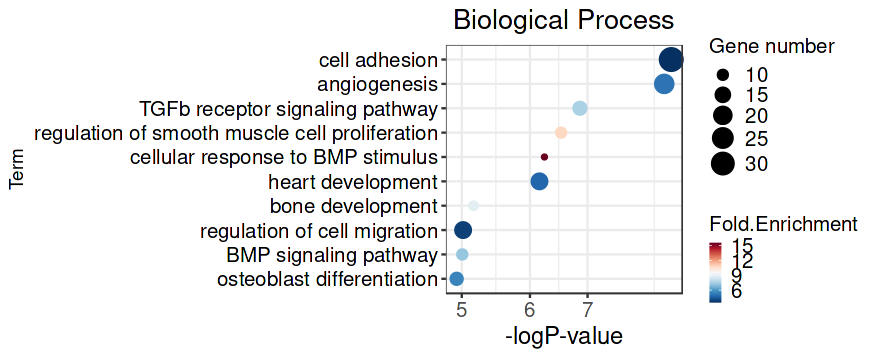

In [341]:
options(repr.plot.width=7.3, repr.plot.height=3)
ggplot(bp, aes(x=-1*log10(PValue), y=Term)) + 
	geom_point(aes(size=Count, color=Fold.Enrichment))+
    scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
	labs(
		color=expression(Fold.Enrichment), 
		size="Gene number",
		x="-logP-value",
		# y="Pathway name",
		title="Biological Process")+
	theme_bw()+
	scale_x_log10()+
	theme(
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=12),
		axis.title.x = element_text(size=14),
		legend.key.size = unit(0.1,"inches"),
		legend.text = element_text(size=12),
		legend.title = element_text(size=12),
		legend.background = element_rect(fill="transparent"),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [365]:
gad<-read.csv('Markers/GO/Endo2_GAD.csv',header=T)
gad[1:10,]->gad

In [366]:
gad<- gad[seq(dim(gad)[1],1),]
gad<-transform(gad,Term=factor(Term,levels=unique(Term)))

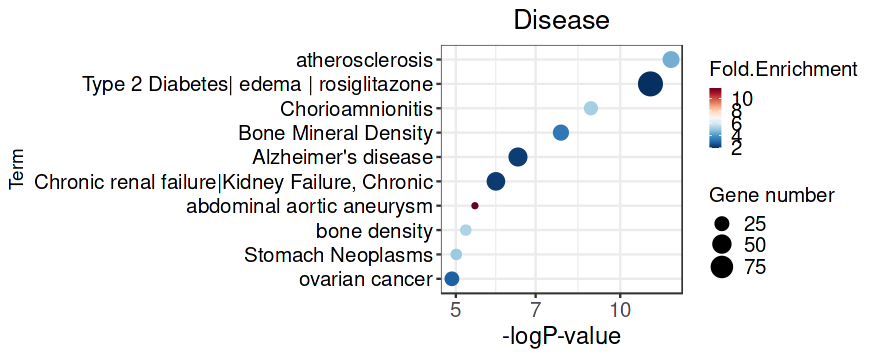

In [368]:
options(repr.plot.width=7.3, repr.plot.height=3)
ggplot(gad, aes(x=-1*log10(PValue), y=Term)) + 
	geom_point(aes(size=Count, color=Fold.Enrichment))+
    scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
	labs(
		color=expression(Fold.Enrichment), 
		size="Gene number",
		x="-logP-value",
		# y="Pathway name",
		title="Disease")+
	theme_bw()+
	scale_x_log10()+
	theme(
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=12),
		axis.title.x = element_text(size=14),
		legend.key.size = unit(0.1,"inches"),
		legend.text = element_text(size=12),
		legend.title = element_text(size=12),
		legend.background = element_rect(fill="transparent"),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [ ]:
as.data.frame(table(czi$Site, czi$celltype))->dat

In [451]:
cbind(as.data.frame(table(czi$Site)),dcast(dat, Var1~Var2)[2:9])->dat

Using Freq as value column: use value.var to override.



In [452]:
dat$Lymphocyte<-dat$Lymphocyte/dat$Freq
dat$Macrophage<-dat$Macrophage/dat$Freq

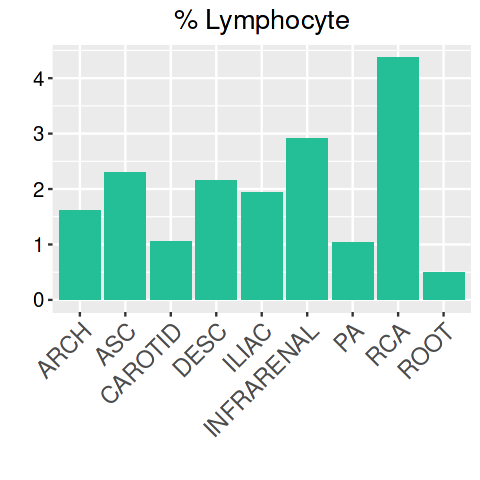

In [426]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(dat, aes(x=Var1, y=Lymphocyte*100)) + 
	geom_bar(stat= 'identity',fill='#24BF97')+
	labs(x="",y='',
		title="% Lymphocyte")+
	theme(
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


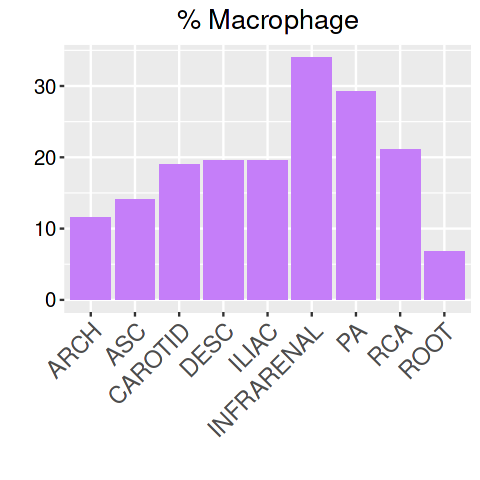

In [427]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(dat, aes(x=Var1, y=Macrophage*100)) + 
	geom_bar(stat= 'identity',fill='#C57EF9')+
	labs(x="",y='',
		title="% Macrophage")+
	theme(
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [453]:
dat$Endothelial1<-dat$Endothelial1/dat$Freq
dat$Endothelial2<-dat$Endothelial2/dat$Freq
dat$Fibroblast<-dat$Fibroblast/dat$Freq
dat$Microvasculature<-dat$Microvasculature/dat$Freq
dat$`Smooth Muscle`<-dat$`Smooth Muscle`/dat$Freq

In [454]:
dat$Var1->rownames(dat)
dat[,3:9]->dat

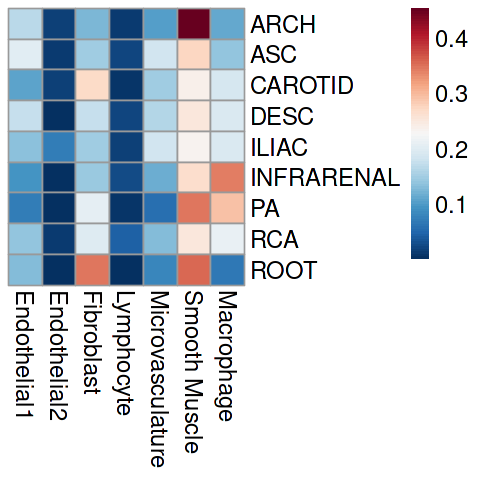

In [457]:
options(repr.plot.width=4, repr.plot.height=4)
pheatmap(dat,color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),cluster_cols = F,cluster_rows = F,scale='none',
           fontsize=14)

In [442]:
rownames(dat)->dat$Site
melt(dat)->dat1

Using Site as id variables



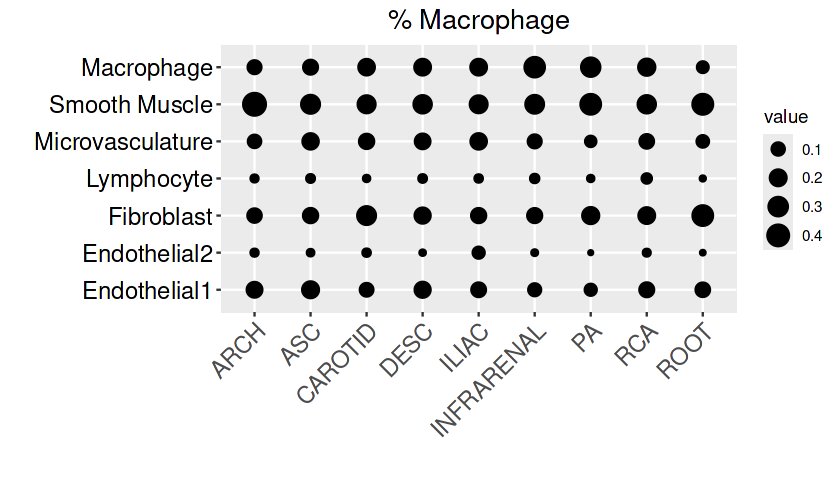

In [446]:
options(repr.plot.width=7, repr.plot.height=4)
ggplot(dat1, aes(x=Site, y=variable)) + 
	geom_point(aes(size=value))+
	labs(x="",y='',
		title="% Macrophage")+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


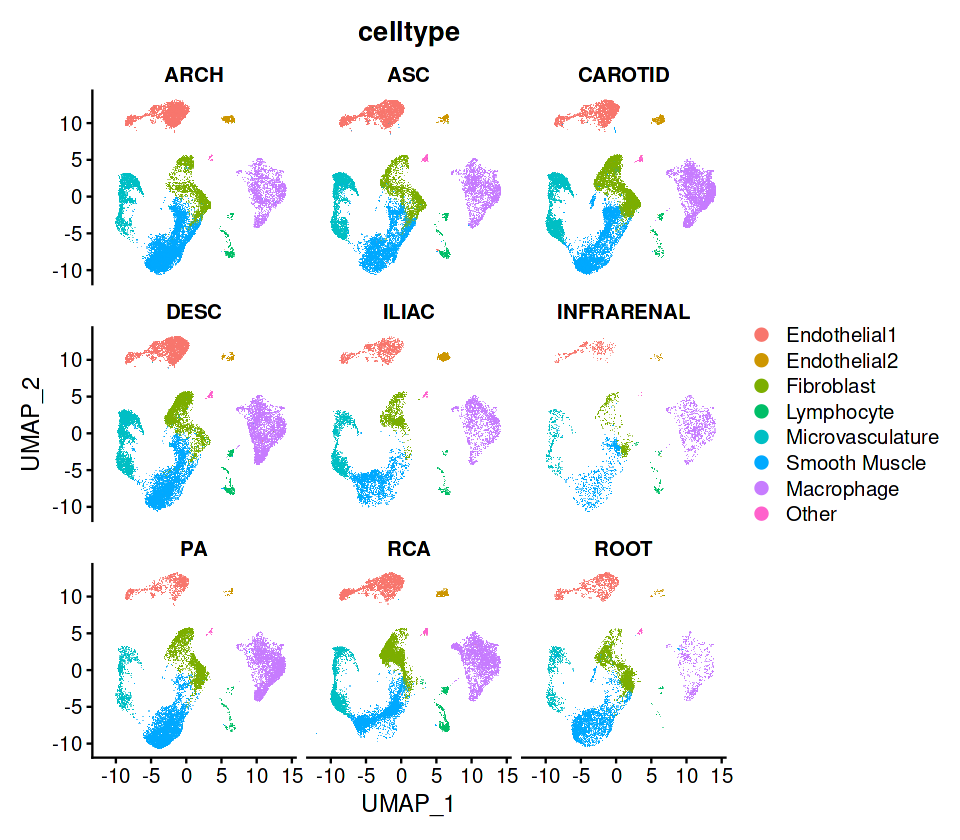

In [472]:
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(czi, split.by = "Site", ncol = 3,group.by = 'celltype',raster=T,pt.size = 2)

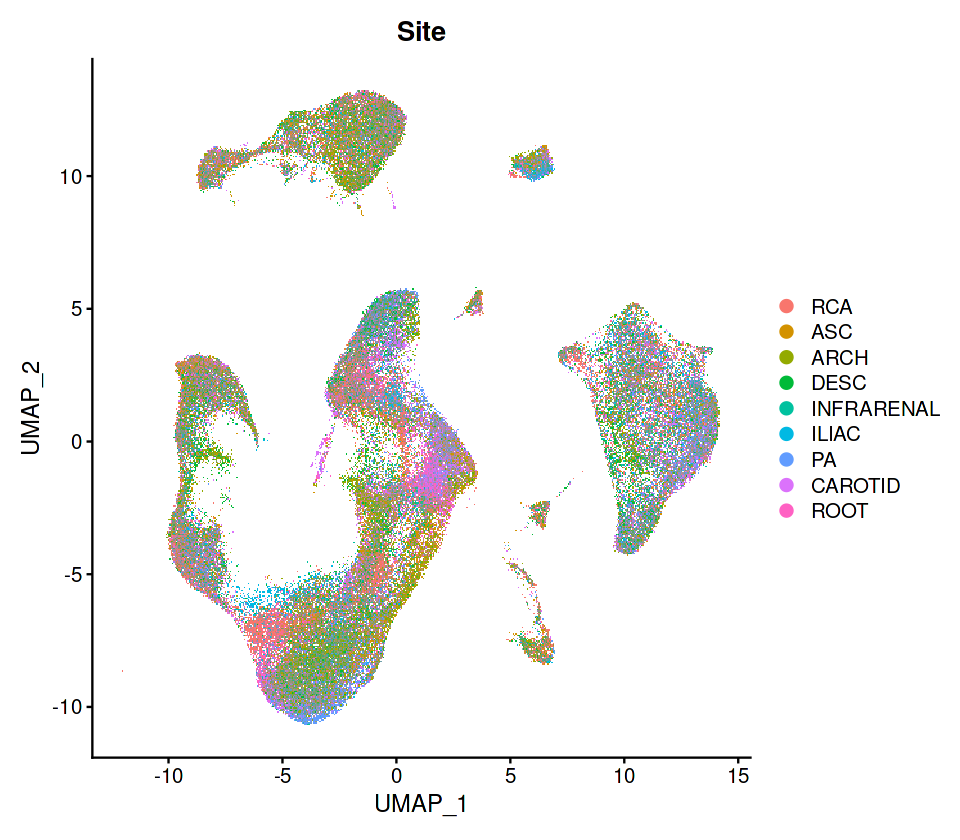

In [69]:
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(czi, group.by = 'Site',raster=T,pt.size = 1,shuffle = T)

In [24]:
DefaultAssay(smc)<-'integrated'
smc<-FindVariableFeatures(smc,verbose = F)
smc<-RunPCA(smc,verbose = F)
smc<-FindNeighbors(smc, dims = 1:30,verbose = F)
smc<-RunUMAP(smc, dims = 1:30,verbose = F)

In [33]:
smc<-FindClusters(smc, resolution=0.15, dims = 1:30,verbose = F)

In [35]:
smc$seurat_clusters->Idents(smc)
cluster.ids <- c("0", "1", "1", "2", "3")
names(cluster.ids) <- levels(smc)
smc <- RenameIdents(smc, cluster.ids)
smc$seurat_clusters1<-Idents(smc)

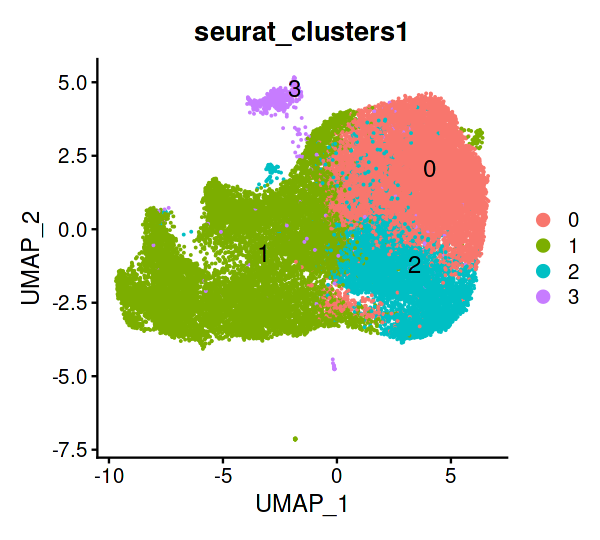

In [36]:
options(repr.plot.width=5, repr.plot.height=4.5)
DimPlot(smc, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'seurat_clusters1')

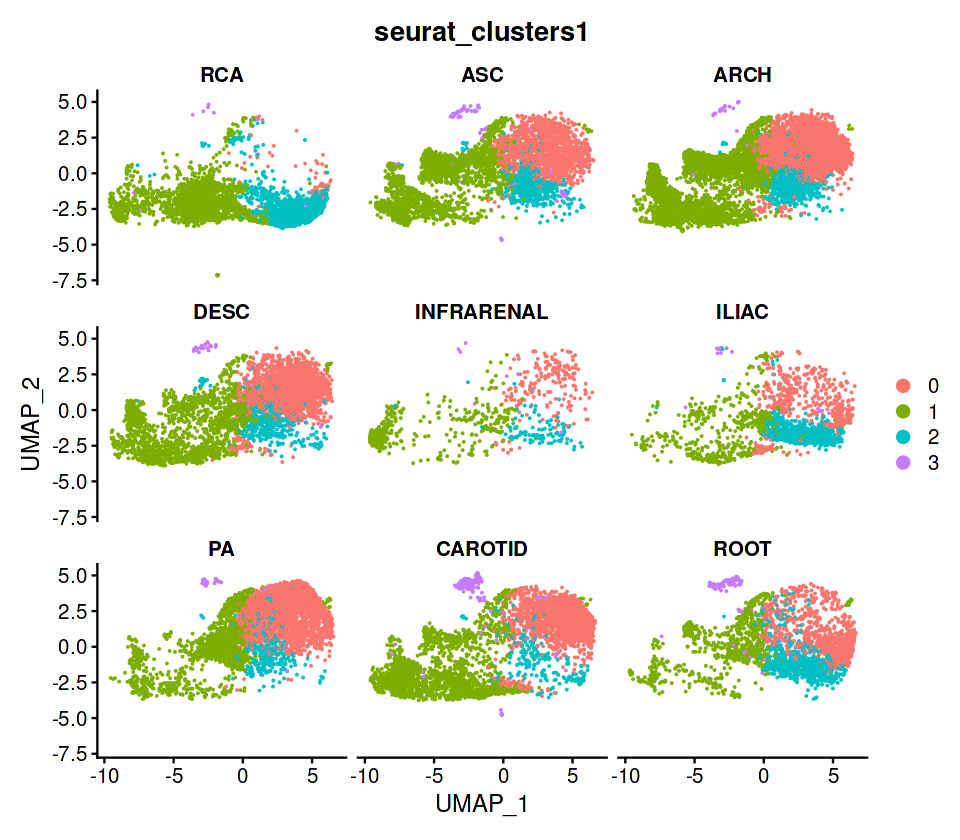

In [37]:
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(smc, split.by = "Site", ncol = 3,group.by = 'seurat_clusters1')

In [131]:
allmarkers<-function(obj){
    obj$Site->Idents(obj)
    FindAllMarkers(obj,assay = 'RNA',only.pos = T,verbose = F)->mks
    return(mks)
}

In [474]:
ls()

[1] "allmarkers"          "anno"                "bp"                 
 [4] "celltype_marker"     "celltype_sct_marker" "clu_marker"         
 [7] "clu_sct_marker"      "cluster.ids"         "collagen"           
[10] "currentcol"          "czi"                 "dat"                
[13] "Dat"                 "dat1"                "deg"                
[16] "ec"                  "ec_de"               "ec_site_sub_mk"     
[19] "ecm"                 "endo1"               "fb"                 
[22] "gad"                 "go"                  "gp"                 
[25] "HOXs"                "HOXs_exp"            "immune"             
[28] "kegg"                "labels"              "pal"                
[31] "pal1"                "smc"                 "smc_micro"          
[34] "smc_micro_de"        "smc_micro_de_fast"

In [14]:
czi$celltype->Idents(czi)
subset(czi, ident='Endothelial1')->ec1
subset(czi, ident='Endothelial2')->ec2
subset(czi, ident='Microvasculature')->micro
subset(czi, ident='Macrophage')->mp
subset(czi, ident='Lymphocyte')->lym

In [482]:
saveRDS(ec1,'RDS/ec1.rds')
saveRDS(ec2,'RDS/ec2.rds')
saveRDS(micro,'RDS/micro.rds')
saveRDS(mp,'RDS/mp.rds')
saveRDS(lym,'RDS/lym.rds')

In [483]:
allmarkers(ec1)->ec1_mk
allmarkers(ec2)->ec2_mk
allmarkers(fb)->fb_mk
allmarkers(micro)->micro_mk
allmarkers(mp)->mp_mk
allmarkers(smc)->smc_mk
allmarkers(lym)->lym_mk

In [504]:
allmarkers(ec)->ec_mk

In [522]:
write.table(ec1_mk,'Markers/ec1_site_mk.txt',sep = '\t',quote=F)
write.table(ec2_mk,'Markers/ec2_site_mk.txt',sep = '\t',quote=F)
write.table(ec_mk,'Markers/ec_site_mk.txt',sep = '\t',quote=F)
write.table(fb_mk,'Markers/fb_site_mk.txt',sep = '\t',quote=F)
write.table(micro_mk,'Markers/micro_site_mk.txt',sep = '\t',quote=F)
write.table(mp_mk,'Markers/mp_site_mk.txt',sep = '\t',quote=F)
write.table(smc_mk,'Markers/smc_site_mk.txt',sep = '\t',quote=F)
write.table(lym_mk,'Markers/lym_site_mk.txt',sep = '\t',quote=F)

In [18]:
read.table('Markers/ec1_site_mk.txt',sep = '\t',header=T)->ec1_mk
read.table('Markers/ec2_site_mk.txt',sep = '\t',header=T)->ec2_mk
read.table('Markers/ec_site_mk.txt',sep = '\t',header=T)->ec_mk
read.table('Markers/fb_site_mk.txt',sep = '\t',header=T)->fb_mk
read.table('Markers/mp_site_mk.txt',sep = '\t',header=T)->mp_mk
read.table('Markers/smc_site_mk.txt',sep = '\t',header=T)->smc_mk
read.table('Markers/lym_site_mk.txt',sep = '\t',header=T)->lym_mk
read.table('Markers/micro_site_mk.txt',sep = '\t',header=T)->micro_mk

In [19]:
get_tab<-function(mk){
    as.data.frame(table(mk$cluster))->dat
    dat[,1]->rownames(dat)
    dat[,2]->dat
    return(dat)
}

In [20]:
as.data.frame(cbind(get_tab(ec1_mk),get_tab(ec2_mk),get_tab(fb_mk),get_tab(lym_mk),get_tab(micro_mk),get_tab(smc_mk),get_tab(mp_mk)))->dat
rownames(dat)<-as.data.frame(table(lym_mk$cluster))[,1]
colnames(dat)<-c( "Endothelial1", "Endothelial2","Fibroblast", "Lymphocyte", "Microvasculature","Smooth Muscle","Macrophage")

In [498]:
dat

,Endothelial1,Endothelial2,Fibroblast,Lymphocyte,Microvasculature,Smooth Muscle,Macrophage
,<int>,<int>,<int>,<int>,<int>,<int>,<int>
RCA,0,126,98,15,35,60,23
ASC,2,126,13,32,6,6,0
ARCH,4,54,17,28,5,15,5
DESC,0,62,53,48,1,4,2
INFRARENAL,102,143,136,178,88,144,55
ILIAC,6,41,73,129,14,39,10
PA,0,94,24,13,3,34,4
CAROTID,2,37,12,11,1,15,0
ROOT,13,169,47,836,34,54,111


Using Site as id variables



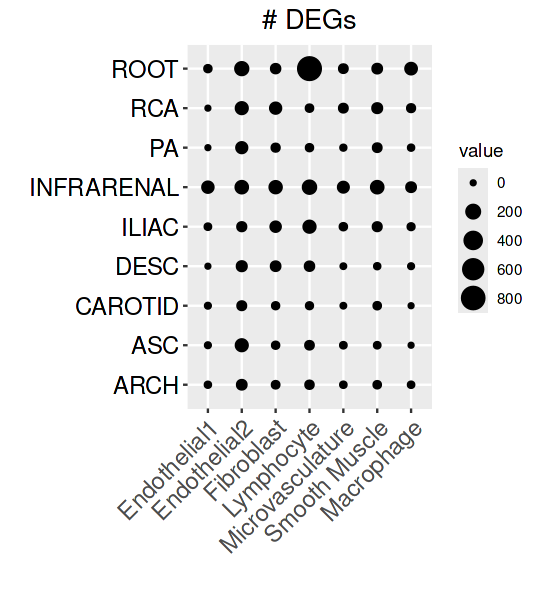

In [503]:
rownames(dat)->dat$Site
melt(dat)->dat1
options(repr.plot.width=4.5, repr.plot.height=5)
ggplot(dat1, aes(y=Site, x=variable)) + 
	geom_point(aes(size=value))+
	labs(x="",y='',
		title="# DEGs")+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [21]:
as.data.frame(cbind(get_tab(ec_mk),get_tab(fb_mk),get_tab(lym_mk),get_tab(micro_mk),get_tab(smc_mk),get_tab(mp_mk)))->dat
rownames(dat)<-as.data.frame(table(lym_mk$cluster))[,1]
colnames(dat)<-c( "Endothelial","Fibroblast", "Lymphocyte", "Microvasculature","Smooth Muscle","Macrophage")

Using Site as id variables



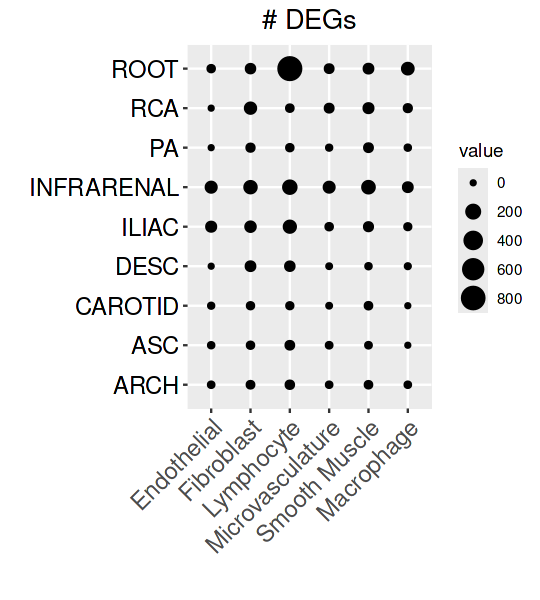

In [523]:
rownames(dat)->dat$Site
melt(dat)->dat1
options(repr.plot.width=4.5, repr.plot.height=5)
ggplot(dat1, aes(y=Site, x=variable)) + 
	geom_point(aes(size=value))+
	labs(x="",y='',
		title="# DEGs")+
    #scale_size(range = c(1, 10))+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [528]:
as.data.frame(colSums(dat[,1:6]))->num
colnames(num)<-'num'

In [530]:
num$cell<-rownames(num)

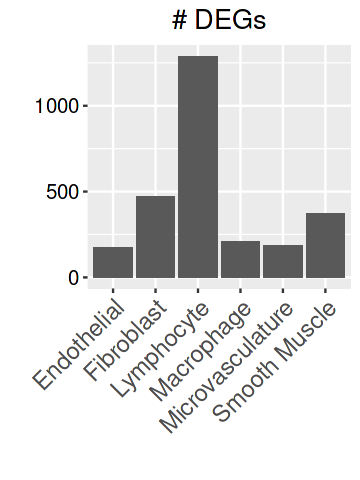

In [532]:
options(repr.plot.width=3, repr.plot.height=4)
ggplot(num, aes(x=cell, y=num)) + 
	geom_bar(stat= 'identity')+
	labs(x="",y='',
		title="# DEGs")+
	theme(
		axis.text.y = element_text(size=12,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [644]:
rownames(smc_mk[grep("^HOX*", rownames(smc_mk)), ])
rownames(fb_mk[grep("^HOX*", rownames(fb_mk)), ])

[1] "HOXC10"  "HOXC101" "HOXA10"  "HOXC9"   "HOXA7"   "HOXA3"

[1] "HOXA5"   "HOXC10"  "HOXC9"   "HOXC101" "HOXC91"  "HOXA10"  "HOXC6"  
[8] "HOTAIR"

In [72]:
HOXs2<-c('HOXC10', 'HOXA10', 'HOXC9', 'HOXA7', 'HOXA3','HOXA5','HOXC6', 'ISL1', 'MEF2C', 'TCF21', 'HAND2', 'GATA4')

In [73]:
subset(czi,subset=celltype==c('Smooth Muscle','Fibroblast'))->fb_smc

In [74]:
fb_smc$type_site<-paste(fb_smc$celltype,fb_smc$Site,sep='_')
Idents(fb_smc)<-fb_smc$type_site

In [75]:
levels(fb_smc)<-c('Fibroblast_RCA','Fibroblast_ASC','Fibroblast_ARCH','Fibroblast_DESC','Fibroblast_INFRARENAL','Fibroblast_ILIAC','Fibroblast_PA','Fibroblast_CAROTID','Fibroblast_ROOT',
                           'Smooth Muscle_RCA','Smooth Muscle_ASC','Smooth Muscle_ARCH','Smooth Muscle_DESC','Smooth Muscle_INFRARENAL','Smooth Muscle_ILIAC','Smooth Muscle_PA','Smooth Muscle_CAROTID','Smooth Muscle_ROOT')

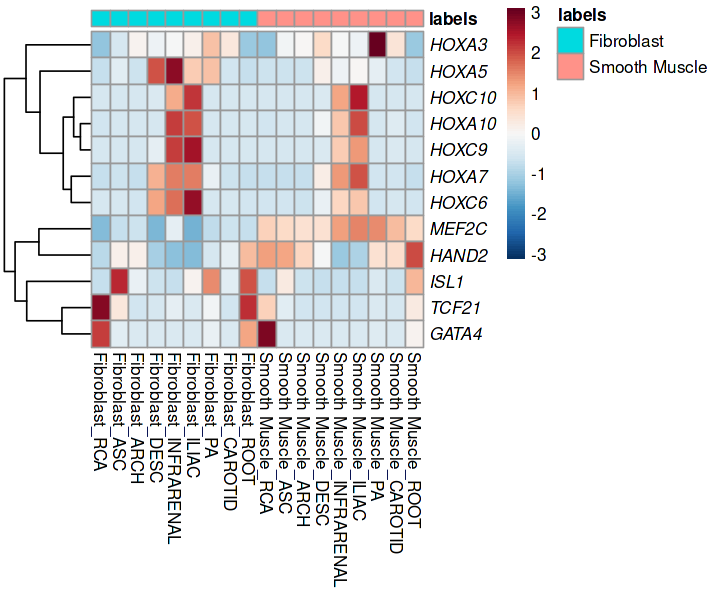

In [76]:
AverageExpression(fb_smc,features = HOXs2)$SCT->dat
labels = c(rep('Fibroblast',9),rep('Smooth Muscle',9))
anno = data.frame(labels)
rownames(anno) = colnames(dat)
options(repr.plot.width=6, repr.plot.height=5)
pheatmap(dat,color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),cluster_cols = F,annotation_col = anno,scale='row',
         labels_row= make_italics(rownames(dat)))

In [162]:
DefaultAssay(mp)<-'integrated'
mp<-FindVariableFeatures(mp,verbose = F)
mp<-RunPCA(mp,verbose = F)
mp<-FindNeighbors(mp, dims = 1:20,verbose = F)
mp<-RunUMAP(mp, dims = 1:20,verbose = F)

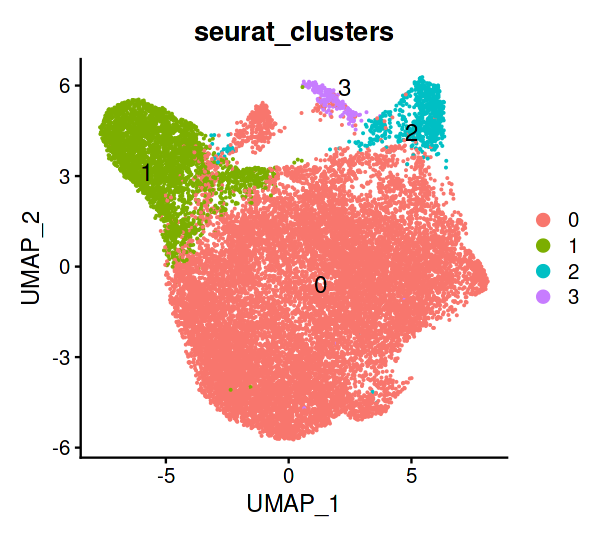

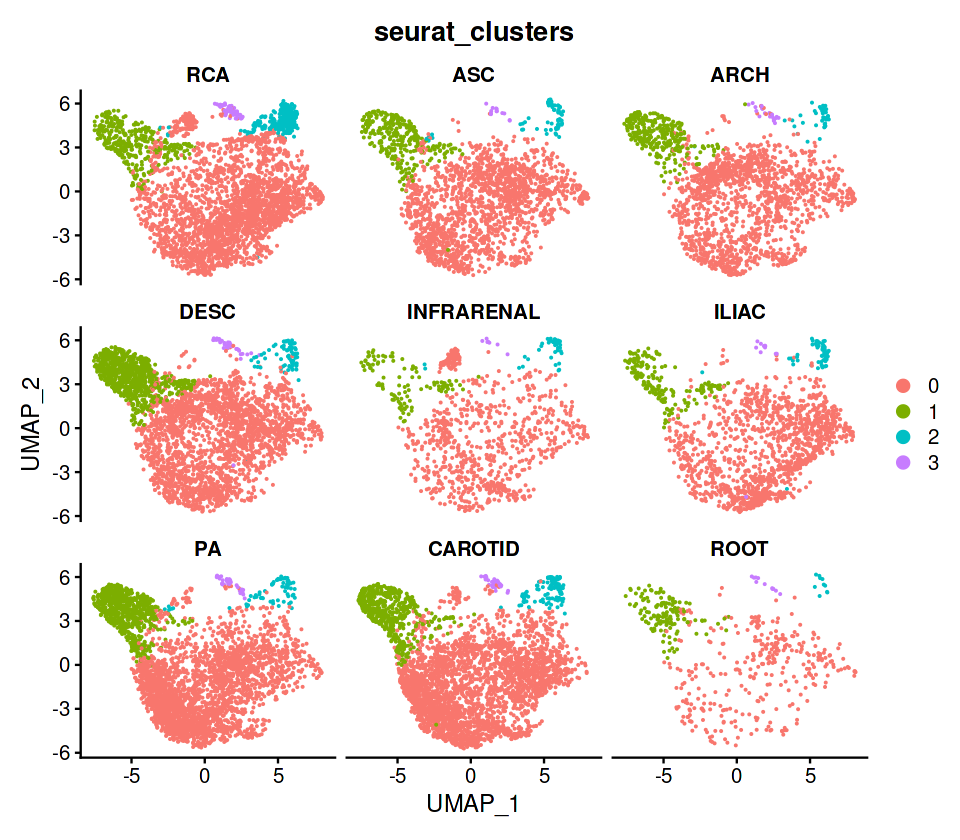

In [163]:
mp<-FindClusters(mp, resolution=0.05, dims = 1:20,verbose = F)
options(repr.plot.width=5, repr.plot.height=4.5)
DimPlot(mp, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'seurat_clusters')
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(mp, split.by = "Site", ncol = 3,group.by = 'seurat_clusters')

In [38]:
DefaultAssay(micro)<-'integrated'
micro<-FindVariableFeatures(micro,verbose = F)
micro<-RunPCA(micro,verbose = F)
micro<-FindNeighbors(micro, dims = 1:20,verbose = F)
micro<-RunUMAP(micro, dims = 1:20,verbose = F)

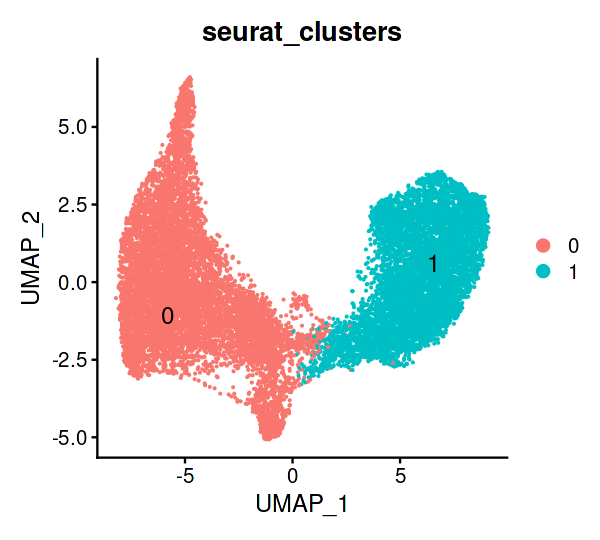

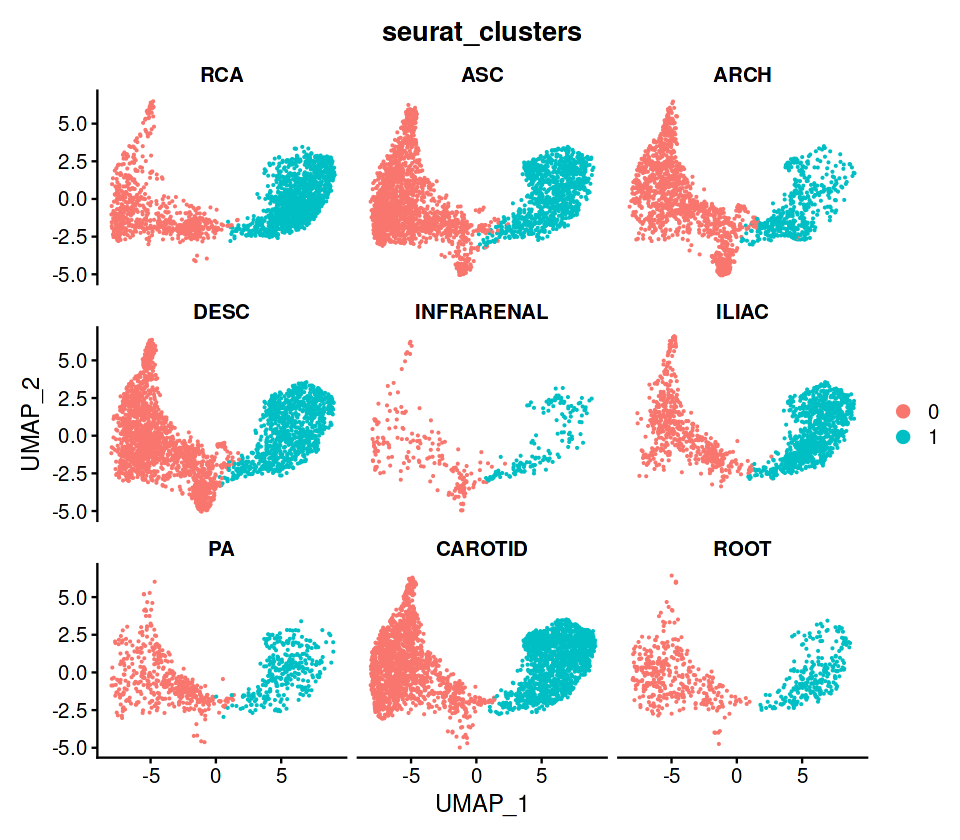

In [39]:
micro<-FindClusters(micro, resolution=0.05, dims = 1:20,verbose = F)
options(repr.plot.width=5, repr.plot.height=4.5)
DimPlot(micro, reduction = "umap", label = T, label.size = 5,repel = TRUE,group.by = 'seurat_clusters')
options(repr.plot.width=8, repr.plot.height=7)
DimPlot(micro, split.by = "Site", ncol = 3,group.by = 'seurat_clusters')

In [143]:
clumks<-function(obj){
    obj$seurat_clusters->Idents(obj)
    FindAllMarkers(obj,assay = 'RNA',only.pos = T,verbose = F)->mks
    return(mks)
}

In [120]:
clumks(fb)->fb_clumk
clumks(ec1)->ec1_clumk
clumks(mp)->mp_clumk
clumks(smc)->smc_clumk
clumks(micro)->micro_clumk

In [717]:
write.table(ec1_clumk,'Markers/ec1_clu_mk.txt',sep = '\t',quote=F)
write.table(fb_clumk,'Markers/fb_clu_mk.txt',sep = '\t',quote=F)
write.table(mp_clumk,'Markers/mp_clu_mk.txt',sep = '\t',quote=F)
write.table(micro_clumk,'Markers/micro_clu_mk.txt',sep = '\t',quote=F)
write.table(smc_clumk,'Markers/smc_clu_mk.txt',sep = '\t',quote=F)

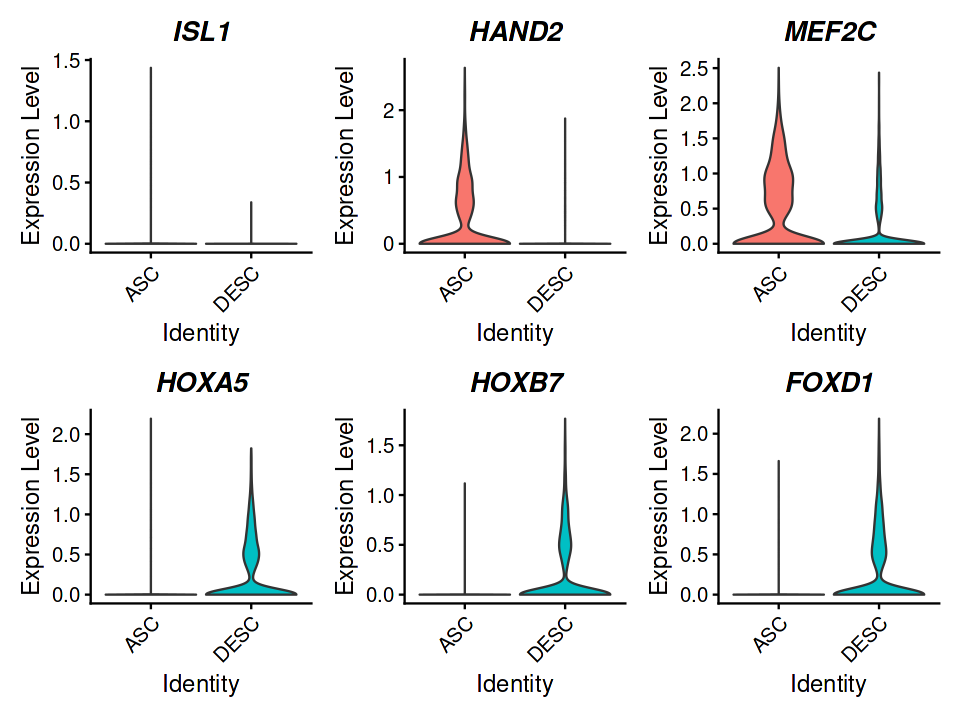

In [77]:
Idents(fb)<-fb$Site
fb_ad<-subset(fb, idents = c("ASC","DESC"))
DefaultAssay(fb_ad)<-'RNA'
options(repr.plot.width=8, repr.plot.height=6)
VlnPlot(fb_ad, features = c('ISL1','HAND2','MEF2C','HOXA5','HOXB7','FOXD1'), group.by = 'Site',ncol=3,pt.size=0)&theme( plot.title = element_text(face='bold.italic'))

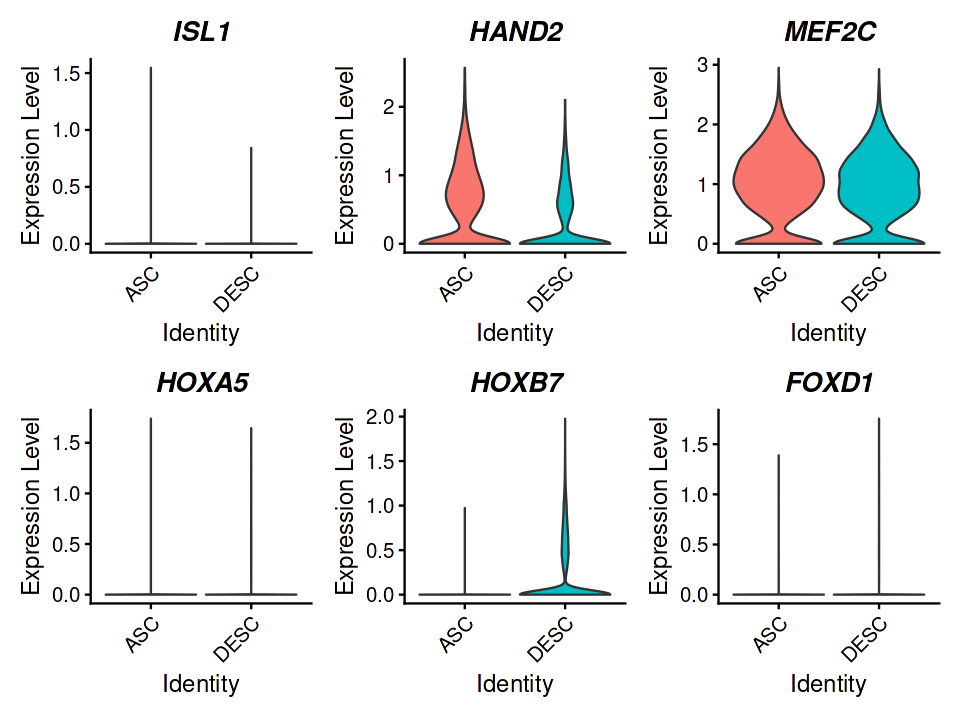

In [78]:
Idents(smc)<-smc$Site
smc_ad<-subset(smc, idents = c("ASC","DESC"))
DefaultAssay(smc_ad)<-'RNA'
options(repr.plot.width=8, repr.plot.height=6)
VlnPlot(smc_ad, features = c('ISL1','HAND2','MEF2C','HOXA5','HOXB7','FOXD1'), group.by = 'Site',ncol=3,pt.size=0)&theme( plot.title = element_text(face='bold.italic'))

In [769]:
Idents(smc_ad)<-smc_ad$Site
FindMarkers(smc_ad, ident.1='ASC',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F)->smc_ad_deg
FindMarkers(smc_ad, ident.1='ASC',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->smc_ad_deg2
write.table(smc_ad_deg,'Markers/smc_AD_deg.txt',sep='\t',quote = F)
write.table(smc_ad_deg2,'Markers/smc_AD_deg2.txt',sep='\t',quote = F)

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



In [771]:
Idents(fb_ad)<-fb_ad$Site
FindMarkers(fb_ad, ident.1='ASC',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F)->fb_ad_deg
FindMarkers(fb_ad, ident.1='ASC',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->fb_ad_deg2
write.table(fb_ad_deg,'Markers/fb_AD_deg.txt',sep='\t',quote = F)
write.table(fb_ad_deg2,'Markers/fb_AD_deg2.txt',sep='\t',quote = F)

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



In [772]:
Idents(mp)<-mp$Site
mp_ad<-subset(mp, idents = c("ASC","DESC"))
Idents(mp_ad)<-mp_ad$Site
FindMarkers(mp_ad, ident.1='ASC',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F)->mp_ad_deg
FindMarkers(mp_ad, ident.1='ASC',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->mp_ad_deg2
write.table(mp_ad_deg,'Markers/mp_AD_deg.txt',sep='\t',quote = F)
write.table(mp_ad_deg2,'Markers/mp_AD_deg2.txt',sep='\t',quote = F)

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



In [773]:
Idents(ec1)<-ec1$Site
ec1_ad<-subset(ec1, idents = c("ASC","DESC"))
Idents(ec1_ad)<-ec1_ad$Site
FindMarkers(ec1_ad, ident.1='ASC',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F)->ec1_ad_deg
FindMarkers(ec1_ad, ident.1='ASC',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->ec1_ad_deg2
write.table(ec1_ad_deg,'Markers/ec1_AD_deg.txt',sep='\t',quote = F)
write.table(ec1_ad_deg2,'Markers/ec1_AD_deg2.txt',sep='\t',quote = F)

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



In [774]:
Idents(micro)<-micro$Site
micro_ad<-subset(micro, idents = c("ASC","DESC"))
Idents(micro_ad)<-micro_ad$Site
FindMarkers(micro_ad, ident.1='ASC',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F)->micro_ad_deg
FindMarkers(micro_ad, ident.1='ASC',ident.2='DESC',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->micro_ad_deg2
write.table(micro_ad_deg,'Markers/micro_AD_deg.txt',sep='\t',quote = F)
write.table(micro_ad_deg2,'Markers/micro_AD_deg2.txt',sep='\t',quote = F)

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



In [2]:
readRDS('RDS/CZI_processed.rds')->czi

In [4]:
table(czi$Age, czi$Site,czi$Pt)

, ,  = Pt1

    
      RCA  ASC ARCH DESC INFRARENAL ILIAC   PA CAROTID ROOT
  38    0    0    0    0          0     0    0       0    0
  39    0    0    0    0          0     0    0       0    0
  46    0    0    0    0          0     0    0       0    0
  48    0    0    0    0          0     0    0       0    0
  67 2947  991 4630 2539       1654  1193 2040    3317    0
  69    0    0    0    0          0     0    0       0    0

, ,  = Pt2

    
      RCA  ASC ARCH DESC INFRARENAL ILIAC   PA CAROTID ROOT
  38    0    0    0    0          0     0    0       0    0
  39    0    0    0    0          0     0    0       0    0
  46    0    0    0    0          0     0    0       0    0
  48  713    0    0 1622       1200     0    0    2431    0
  67  938    0    0    0          0     0    0       0    0
  69    0    0    0    0          0     0    0       0    0

, ,  = Pt3

    
      RCA  ASC ARCH DESC INFRARENAL ILIAC   PA CAROTID ROOT
  38    0    0    0    0          0     0    0 

In [21]:
readRDS('RDS/fb.rds')->fb
readRDS('RDS/smc.rds')->smc

In [63]:
readRDS('RDS/ec.rds')->ec

In [22]:
readRDS('RDS/micro.rds')->micro
readRDS('RDS/mp.rds')->mp
readRDS('RDS/ec1.rds')->ec1
readRDS('RDS/ec2.rds')->ec2
readRDS('RDS/lym.rds')->lym

In [23]:
DefaultAssay(czi)<-'RNA'

In [ ]:
Idents(czi)<-czi$Site
FindAllMarkers(czi,only.pos = T,assay = 'RNA',verbose = F)->site_de
FindAllMarkers(czi,only.pos = T,assay = 'RNA',verbose = F,test.use = 'DESeq2')->site_de2

In [5]:
write.table(site_de,'Markers/Site_mk.txt',sep='\t',quote = F)
write.table(site_de2,'Markers/Site_DESmk.txt',sep='\t',quote = F)

In [6]:
paste(czi$Site,czi$celltype,sep='_')->czi$Site_type
Idents(czi)<-czi$Site_type

In [ ]:
FindAllMarkers(czi,only.pos = T,assay = 'RNA',verbose = F)->sitetype_de
FindAllMarkers(czi,only.pos = T,assay = 'RNA',verbose = F,test.use = 'DESeq2')->sitetype_de2

In [8]:
write.table(sitetype_de,'Markers/SiteType_mk.txt',sep='\t',quote = F)
write.table(sitetype_de2,'Markers/SiteType_DESmk.txt',sep='\t',quote = F)

In [79]:
read.table('Exp/HOX.genes',header=F,sep='\t')->hox
read.table('Exp/HOX_pc.genes',header=F,sep='\t')->hox_pc

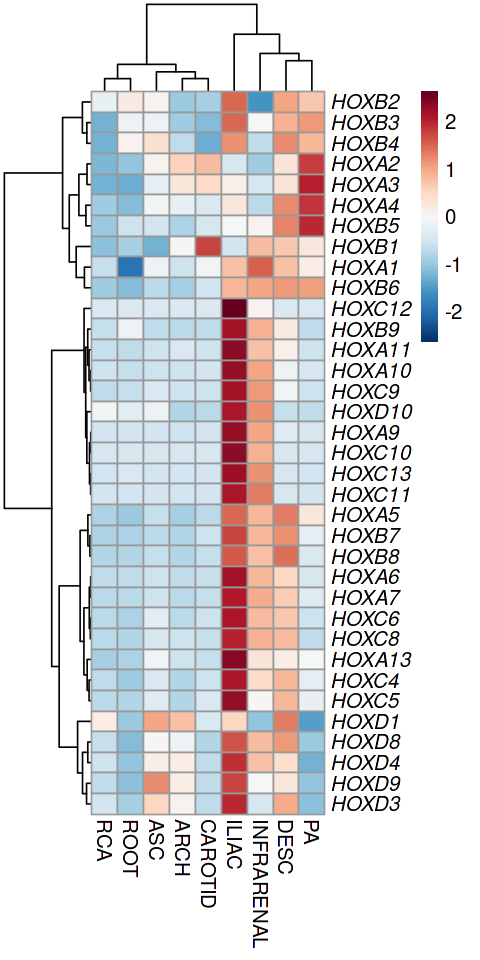

In [80]:
Idents(czi)<-czi$Site
AverageExpression(czi,features = hox_pc$V1)$RNA->dat
options(repr.plot.width=4, repr.plot.height=8)
pheatmap(dat,color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),scale='row',fontsize=12,
         clustering_method = 'ward.D',labels_row= make_italics(rownames(dat)))

In [81]:
paste(czi$Site,czi$Pt,sep='_')->czi$Site_Pt
Idents(czi)<-czi$Site_Pt

In [82]:
levels(czi)<-c('ARCH_Pt1', 'ARCH_Pt3', 'ARCH_Pt4', 'ARCH_Pt5', 'ARCH_Pt6', 'ASC_Pt1', 'ASC_Pt3', 'ASC_Pt4', 'ASC_Pt5', 'ASC_Pt6', 'CAROTID_Pt1', 'CAROTID_Pt2', 'CAROTID_Pt3', 'CAROTID_Pt4', 'CAROTID_Pt5', 'DESC_Pt1', 'DESC_Pt2', 'DESC_Pt3', 'DESC_Pt4', 'DESC_Pt5', 'ILIAC_Pt1', 'ILIAC_Pt4', 'ILIAC_Pt5', 'INFRARENAL_Pt1', 'INFRARENAL_Pt2', 'PA_Pt1', 'PA_Pt3', 'PA_Pt4', 'PA_Pt5', 'RCA_Pt1', 'RCA_Pt2', 'RCA_Pt3', 'RCA_Pt4', 'RCA_Pt5', 'RCA_Pt6', 'ROOT_Pt5', 'ROOT_Pt6')

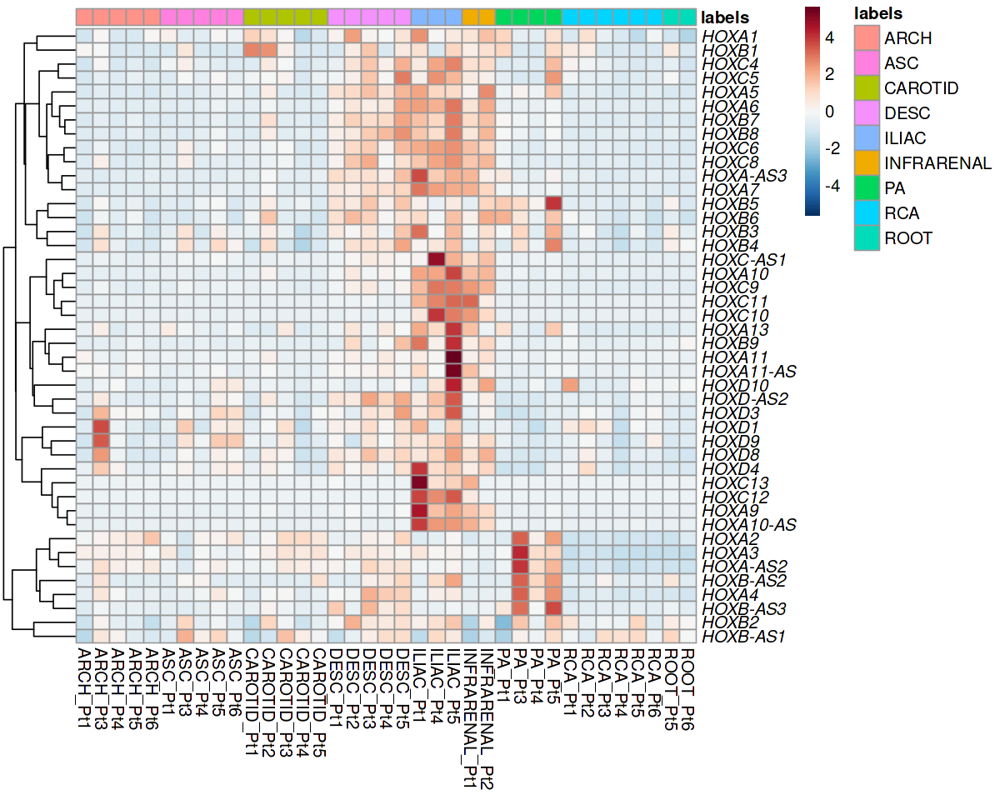

In [83]:
AverageExpression(czi,features = hox$V1)$SCT->dat
labels = c(rep('ARCH',5),rep('ASC',5),rep('CAROTID',5),rep('DESC',5),rep('ILIAC',3),rep('INFRARENAL',2),rep('PA',4),rep('RCA',6),rep('ROOT',2))
anno = data.frame(labels)
rownames(anno) = colnames(dat)
options(repr.plot.width=10, repr.plot.height=8)
pheatmap(dat,color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),cluster_cols = F,scale='row',fontsize=12,annotation_col = anno,
        labels_row= make_italics(rownames(dat)))

In [84]:
subset(czi, subset=Site=="DESC")->desc

In [85]:
Idents(desc)<-desc$celltype2

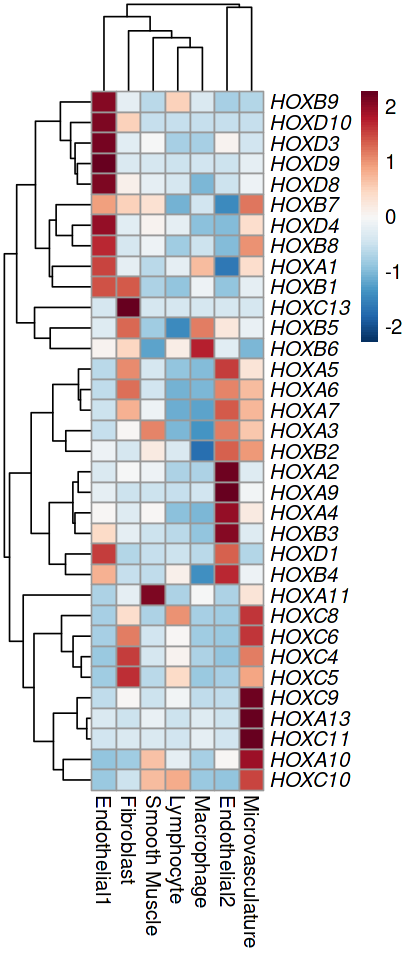

In [86]:
AverageExpression(desc,features = hox_pc$V1)$RNA->dat
dat[which(rowSums(dat)>0),]->dat
options(repr.plot.width=3.5, repr.plot.height=8)
pheatmap(dat,color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),scale='row',fontsize=12,
        labels_row= make_italics(rownames(dat)))

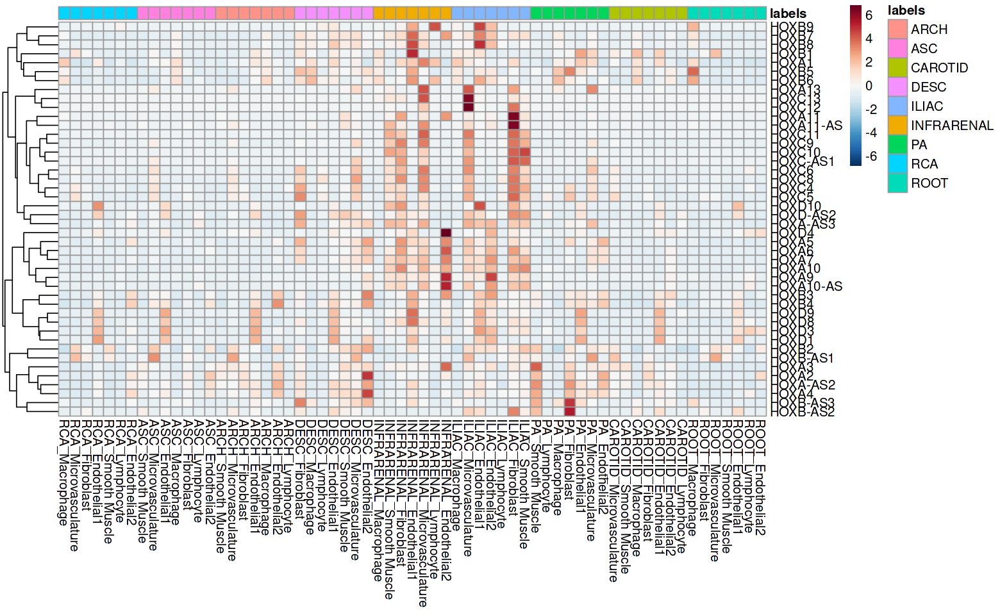

In [71]:
paste(czi$Site,czi$celltype2,sep='_')->czi$Site_type
Idents(czi)<-czi$Site_type
AverageExpression(czi,features = hox$V1)$SCT->dat
labels = c(rep('RCA',7),rep('ASC',7),rep('ARCH',7),rep('DESC',7),rep('INFRARENAL',7),rep('ILIAC',7),rep('PA',7),rep('CAROTID',7),rep('ROOT',7))
anno = data.frame(labels)
rownames(anno) = colnames(dat)
options(repr.plot.width=13, repr.plot.height=8)
pheatmap(dat,color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),cluster_cols = F,scale='row',fontsize=12,annotation_col = anno,
        )#labels_col=c('Macrophage', 'Microvasculature', 'Fibroblast', 'Endothelial1', 'Smooth Muscle', 'Lymphocyte', 'Endothelial2', 'Smooth Muscle', 'Microvasculature', 'Endothelial1', 'Macrophage', 'Fibroblast', 'Lymphocyte', 'Endothelial2', 'Smooth Muscle', 'Microvasculature', 'Fibroblast', 'Endothelial1', 'Macrophage', 'Endothelial2', 'Lymphocyte', 'Fibroblast', 'Macrophage', 'Lymphocyte', 'Endothelial1', 'Smooth Muscle', 'Microvasculature', 'Endothelial2', 'Macrophage', 'Smooth Muscle', 'Fibroblast', 'Endothelial1', 'Microvasculature', 'Lymphocyte', 'Endothelial2', 'Macrophage', 'Microvasculature', 'Endothelial1', 'Endothelial2', 'Lymphocyte', 'Fibroblast', 'Smooth Muscle', 'Smooth Muscle', 'Lymphocyte', 'Macrophage', 'Fibroblast', 'Endothelial1', 'Microvasculature', 'Endothelial2', 'Microvasculature', 'Smooth Muscle', 'Macrophage', 'Fibroblast', 'Endothelial1', 'Endothelial2', 'Lymphocyte', 'Macrophage', 'Fibroblast', 'Microvasculature', 'Smooth Muscle', 'Endothelial1', 'Lymphocyte', 'Endothelial2'))

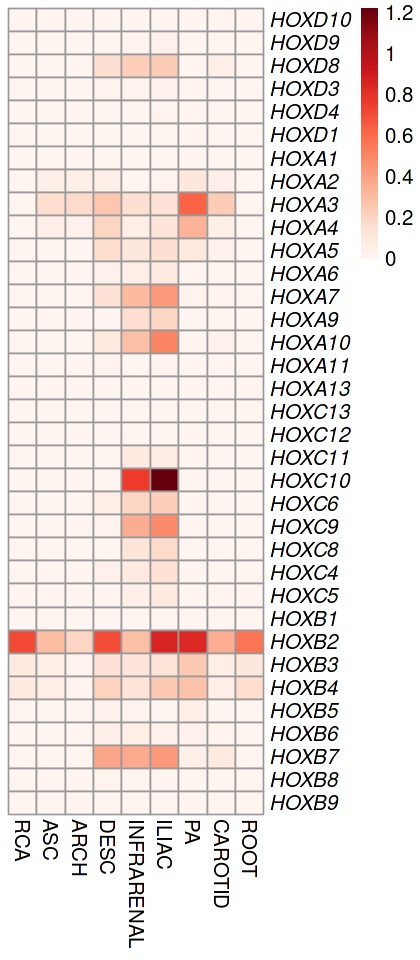

In [87]:
AverageExpression(smc,features = hox_pc$V1,group.by='Site')$SCT->dat
dat[which(rowSums(dat)>0),]->dat
options(repr.plot.width=3.5, repr.plot.height=8)
pheatmap(dat,color=colorRampPalette(brewer.pal(11,"Reds"))(100),scale='none',
         fontsize=12,cluster_cols = F,cluster_rows = F,labels_row= make_italics(rownames(dat)))

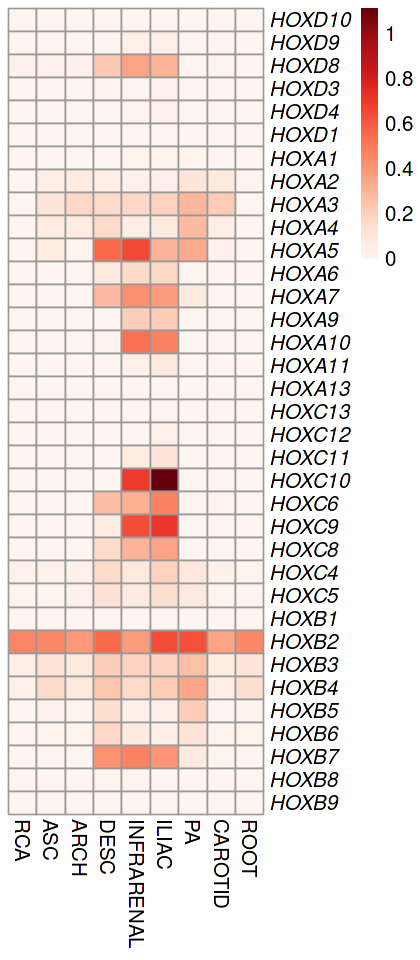

In [88]:
AverageExpression(fb,features = hox_pc$V1,group.by='Site')$SCT->dat
dat[which(rowSums(dat)>0),]->dat
options(repr.plot.width=3.5, repr.plot.height=8)
pheatmap(dat,color=colorRampPalette(brewer.pal(11,"Reds"))(100),scale='none',fontsize=12,
         cluster_cols = F,cluster_rows = F,labels_row= make_italics(rownames(dat)))

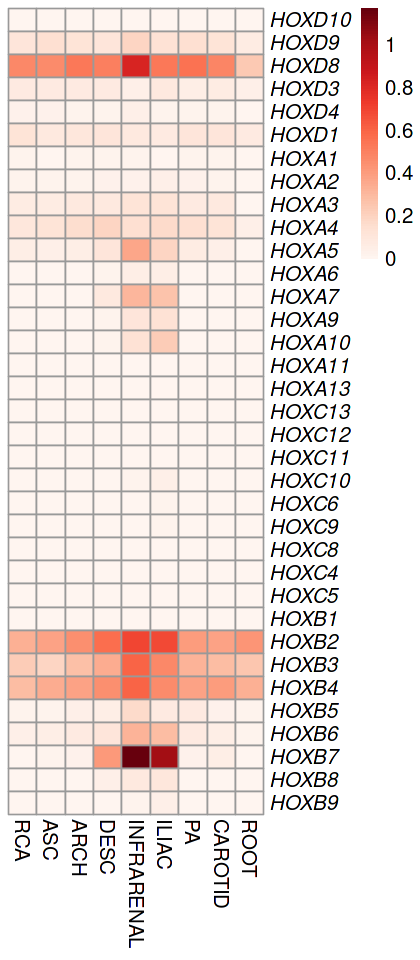

In [89]:
AverageExpression(ec1,features = hox_pc$V1,group.by='Site')$SCT->dat
dat[which(rowSums(dat)>0),]->dat
options(repr.plot.width=3.5, repr.plot.height=8)
pheatmap(dat,color=colorRampPalette(brewer.pal(11,"Reds"))(100),scale='none',fontsize=12,
         cluster_cols = F,cluster_rows = F,labels_row= make_italics(rownames(dat)))

In [90]:
AverageExpression(ec2,features = hox_pc$V1,group.by='Site')$SCT->dat

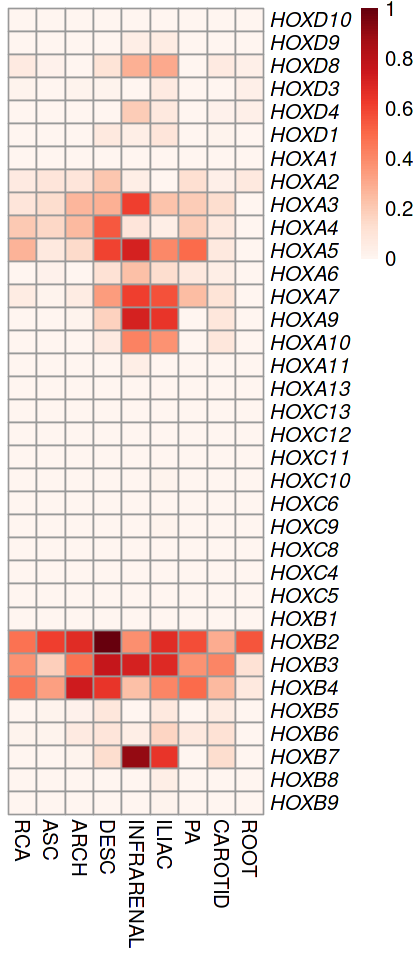

In [91]:
#dat[which(rowSums(dat)>0),]->dat
options(repr.plot.width=3.5, repr.plot.height=8)
pheatmap(dat,color=colorRampPalette(brewer.pal(11,"Reds"))(100),scale='none',fontsize=12,
         cluster_cols = F,cluster_rows = F,labels_row= make_italics(rownames(dat)))

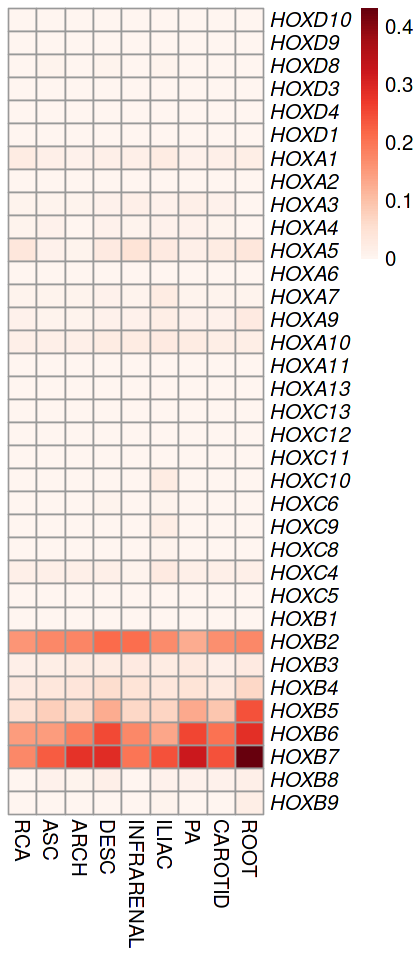

In [92]:
AverageExpression(mp,features = hox_pc$V1,group.by='Site')$SCT->dat
dat[which(rowSums(dat)>0),]->dat
options(repr.plot.width=3.5, repr.plot.height=8)
pheatmap(dat,color=colorRampPalette(brewer.pal(11,"Reds"))(100),scale='none',fontsize=12,
         cluster_cols = F,cluster_rows = F,labels_row= make_italics(rownames(dat)))

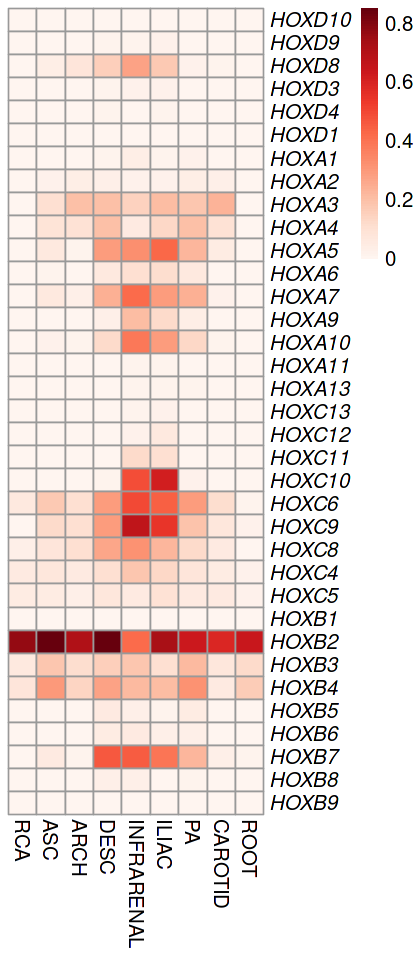

In [94]:
AverageExpression(micro,features = hox_pc$V1,group.by='Site')$SCT->dat
dat[which(rowSums(dat)>0),]->dat
options(repr.plot.width=3.5, repr.plot.height=8)
pheatmap(dat,color=colorRampPalette(brewer.pal(11,"Reds"))(100),scale='none',fontsize=12,
         cluster_cols = F,cluster_rows = F,labels_row= make_italics(rownames(dat)))

In [86]:
paste(czi$celltype, czi$Site, sep='_')->czi$type_site

In [116]:
melt(res_exp_sct)->cor_dat_hox

In [117]:
cor_dat_all$group<-'Whole Transcriptome'
cor_dat_hox$group<-'HOX genes'

In [118]:
rbind(cor_dat_all,cor_dat_hox)->cor_dat

In [121]:
cor_dat[which(cor_dat$Var1!=cor_dat$Var2),]->cor_dat

In [124]:
paste(cor_dat$Var1,cor_dat$Var2,sep='-')->cor_dat$comp

In [127]:
dcast(cor_dat,formula = comp~group)->dat

`geom_smooth()` using formula = 'y ~ x'


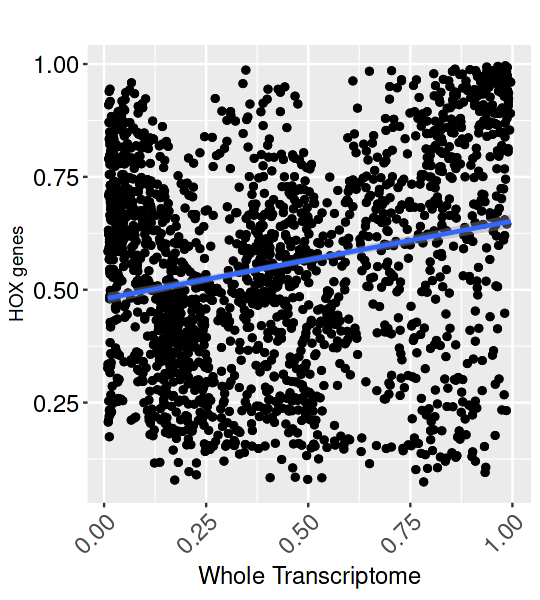

In [139]:
options(repr.plot.width=4.5, repr.plot.height=5)
ggplot(dat, aes(y=`HOX genes`, x=`Whole Transcriptome`)) + 
	geom_jitter()+
    geom_smooth(method = 'lm')+
	labs(x="Whole Transcriptome",y='HOX genes',
		title="")+
	theme(
		axis.text.y = element_text(size=14,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)


In [95]:
subset(fb,subset=Site%in%c("ASC","DESC"))->fb_ad

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


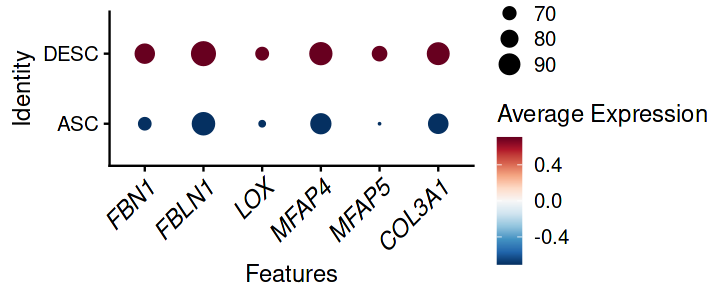

In [98]:
DefaultAssay(fb_ad)<-'SCT'
options(repr.plot.width=6, repr.plot.height=2.5)
DotPlot(fb_ad, features = c("FBN1","FBLN1","LOX",'MFAP4','MFAP5','COL3A1'),group.by='Site')+
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
    theme(axis.text.x = element_text(size=14,angle=45,hjust=1,face='italic'))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


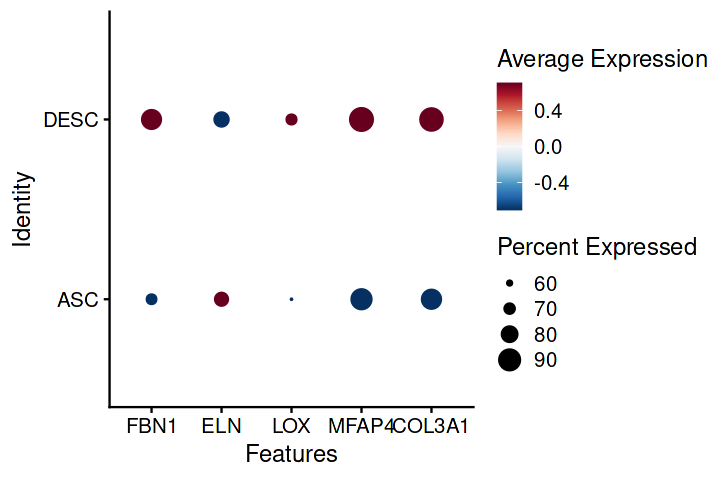

In [154]:
DefaultAssay(fb_ad)<-'SCT'
options(repr.plot.width=6, repr.plot.height=4)
DotPlot(fb_ad, features = c("FBN1","FBNL1","LOX",'MFAP4','MFAP5','COL3A1'),group.by='Site')+
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

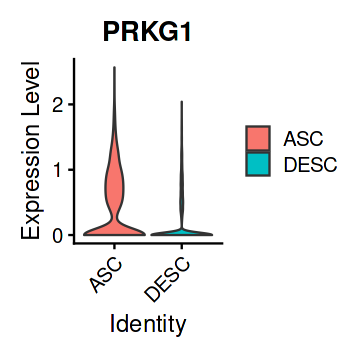

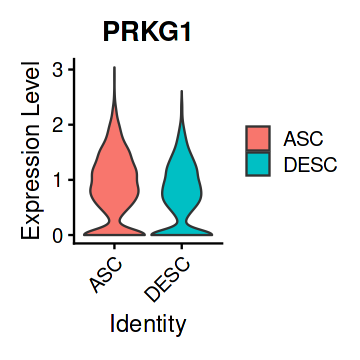

In [42]:
options(repr.plot.width=3, repr.plot.height=3)
VlnPlot(fb_ad, features = c('PRKG1'),pt.size=0,group.by='Site',assay = 'RNA')
VlnPlot(smc_ad, features = c('PRKG1'),pt.size=0,group.by='Site',assay = 'RNA')

In [99]:
subset(smc,subset=Site%in%c("ASC","DESC"))->smc_ad

In [100]:
read.table('Markers/FB_GAWS_genes.res',header=F)->dat

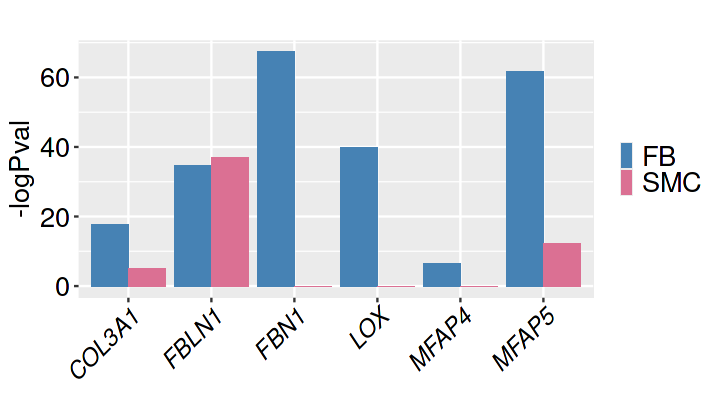

In [102]:
options(repr.plot.width=6, repr.plot.height=3.5)
ggplot(dat, aes(x=V1, y=-log10(V6),fill=V7) )+ 
	geom_bar(stat='identity',position="dodge")+
	scale_fill_manual(values=c("steelblue","palevioletred"))+
	labs(x="",y='-logPval',title="")+
	theme(
		axis.text.y = element_text(size=16,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1,color='black',face='italic'),
		axis.title.y = element_text(size=16),
        legend.key.size = unit(0.1,"inches"),
		legend.text = element_text(size=16),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent")
	)


In [181]:
paste(fb_ad$Pt,fb_ad$Site,sep='_')->fb_ad$Pt_Site

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


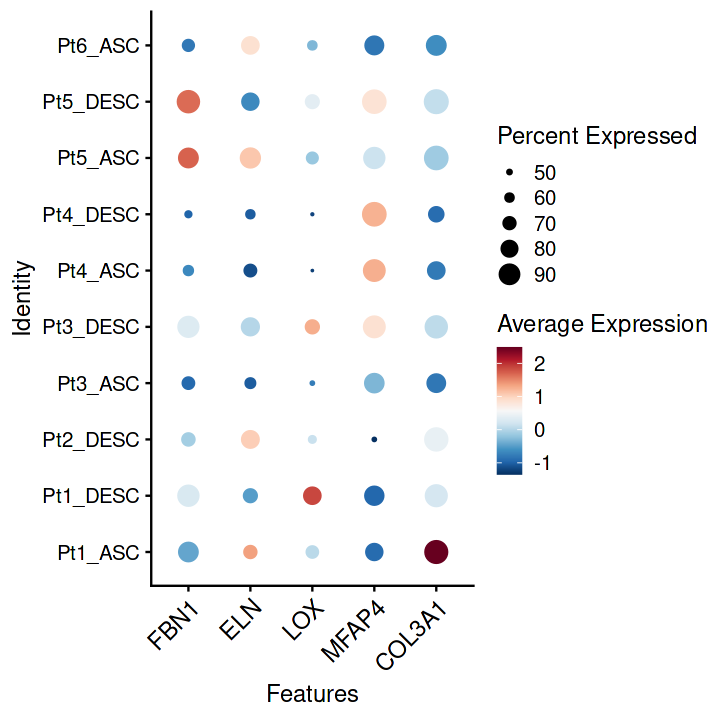

In [182]:
DefaultAssay(fb_ad)<-'SCT'
options(repr.plot.width=6, repr.plot.height=6)
DotPlot(fb_ad, features = c("FBN1","ELN","LOX",'MFAP4','COL3A1'),group.by='Pt_Site')+
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))+
    theme(axis.text.x = element_text(size=14,angle=45,hjust=1))

Using V3 as id variables



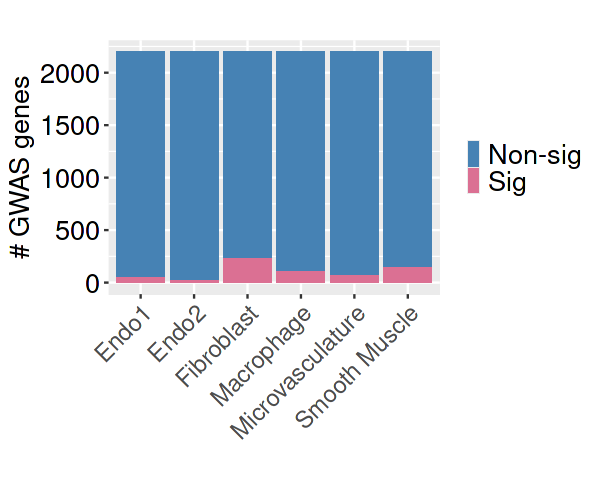

In [195]:
read.table('Markers/gwas_sig_prop.txt',sep='\t',header=F)->dat
melt(dat)->dat
dat$variable<-c('Non-sig','Non-sig','Non-sig','Non-sig','Non-sig','Non-sig','Sig','Sig','Sig','Sig','Sig','Sig')
options(repr.plot.width=5, repr.plot.height=4)
ggplot(dat, aes(x=V3, y=value,fill=variable) )+ 
	geom_bar(stat='identity')+
	scale_fill_manual(values=c("steelblue","palevioletred"))+
	labs(x="",y='# GWAS genes',title="")+
	theme(
		axis.text.y = element_text(size=16,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.y = element_text(size=16),
        legend.key.size = unit(0.1,"inches"),
		legend.text = element_text(size=16),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent")
	)

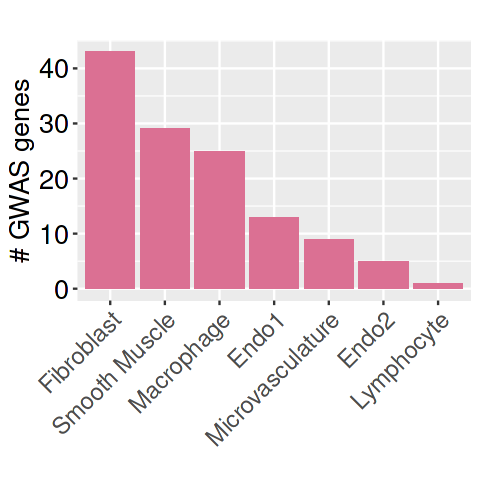

In [7]:
read.table('Markers/gwas_sig_prop2.txt',sep='\t',header=F)->dat
dat[order(dat$V1,decreasing = T),]->dat
dat<-dat[seq(dim(dat)[1],1),]
dat<-transform(dat,V2=factor(dat$V2,levels=rev(unique(dat$V2))))
options(repr.plot.width=4, repr.plot.height=4)
ggplot(dat, aes(x=V2, y=V1,fill=''))+ 
	geom_bar(stat='identity')+
	scale_fill_manual(values=c("palevioletred"))+
	labs(x="",y='# GWAS genes',title="")+
	theme(
		axis.text.y = element_text(size=16,color='black'),
		axis.text.x = element_text(size=14,angle=45,hjust=1),
		axis.title.y = element_text(size=16),
		legend.position = 'none'
	)

In [104]:
read.table('Markers/allcell_site_DESmk_carca_gwas.txt',sep='\t',header=F)->dat

In [106]:
head(dat)

,V1,V2,V3,V4,V5,V6,V7,V8
,<chr>,<int>,<dbl>,<chr>,<int>,<chr>,<int>,<chr>
1,chr1,150570985,7.210208,MCL1,-18920,SNORA40,2030,Endothelial1
2,chr1,150572037,7.463568,MCL1,-19972,SNORA40,978,Endothelial1
3,chr1,154394417,10.466228,RP11-350G8.7,-6805,SHE,47831,Endothelial1
4,chr1,154395125,15.966979,RP11-350G8.7,-7513,SHE,47123,Endothelial1
5,chr1,154395212,15.124881,RP11-350G8.7,-7600,SHE,47036,Endothelial1
6,chr1,154395839,19.227458,RP11-350G8.7,-8227,SHE,46409,Endothelial1


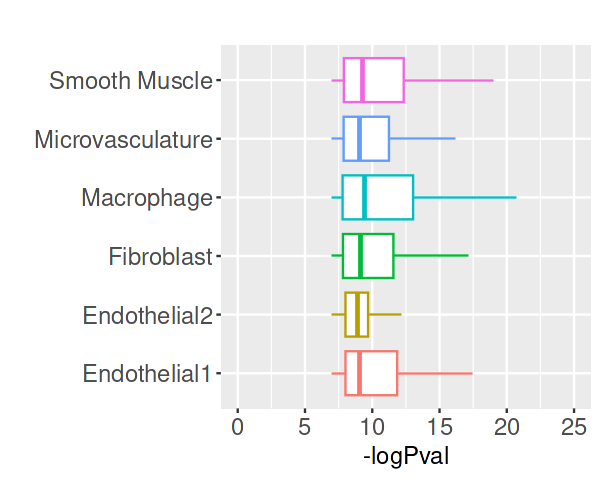

In [116]:
options(repr.plot.width=5, repr.plot.height=4)
ggplot(dat, aes(x=V3, y=V8,color=V8)) + 
	geom_boxplot(outlier.shape = NA)+
	labs(y="",x='-logPval',
		title="")+
	theme(
        legend.position="none",
		axis.text.y = element_text(size=14),
		axis.text.x = element_text(size=14),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16)
	)+
xlim(c(0,25))


In [152]:
cell<-c("Endothelial1", "Endothelial2","Fibroblast", "Lymphocyte", "Microvasculature","Smooth Muscle","Macrophage")
hits<-c(52,17,232,0,65,148,103)
total<-c(757,276,3856,26,1181,2227,1825)
query<-c(rep(2299,7))
as.data.frame(cbind(cell,hits,total,query))->dat
as.numeric(dat$hits)->dat$hits
as.numeric(dat$total)->dat$total
as.numeric(dat$query)->dat$query

In [124]:
czi

An object of class Seurat 
50048 features across 113304 samples within 3 assays 
Active assay: RNA (23024 features, 0 variable features)
 2 other assays present: SCT, integrated
 2 dimensional reductions calculated: pca, umap

In [153]:
dat$Pval<-dbinom(dat$hits,dat$total,dat$query/23024,log=F)

In [154]:
dat$logP<--log(dat$Pval)

In [155]:
dat

cell,hits,total,query,Pval,logP
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Endothelial1,52,757,2299,6.103381e-04,7.401497
Endothelial2,17,276,2299,7.626810e-03,4.876086
Fibroblast,232,3856,2299,3.705277e-19,42.439359
Lymphocyte,0,26,2299,6.488702e-02,2.735108
Microvasculature,65,1181,2299,9.400461e-09,18.482507
Smooth Muscle,148,2227,2299,6.434249e-09,18.861631
Macrophage,103,1825,2299,7.986732e-12,25.553239


In [168]:
dat[order(dat$hits,decreasing = F),]->dat
dat<-dat[seq(dim(dat)[1],1),]
dat<-transform(dat,cell=factor(cell,levels=rev(unique(cell))))

In [169]:
dat

,cell,hits,total,query,Pval,logP
,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
3,Fibroblast,232,3856,2299,3.705277e-19,42.439359
6,Smooth Muscle,148,2227,2299,6.434249e-09,18.861631
7,Macrophage,103,1825,2299,7.986732e-12,25.553239
5,Microvasculature,65,1181,2299,9.400461e-09,18.482507
1,Endothelial1,52,757,2299,6.103381e-04,7.401497
2,Endothelial2,17,276,2299,7.626810e-03,4.876086
4,Lymphocyte,0,26,2299,6.488702e-02,2.735108


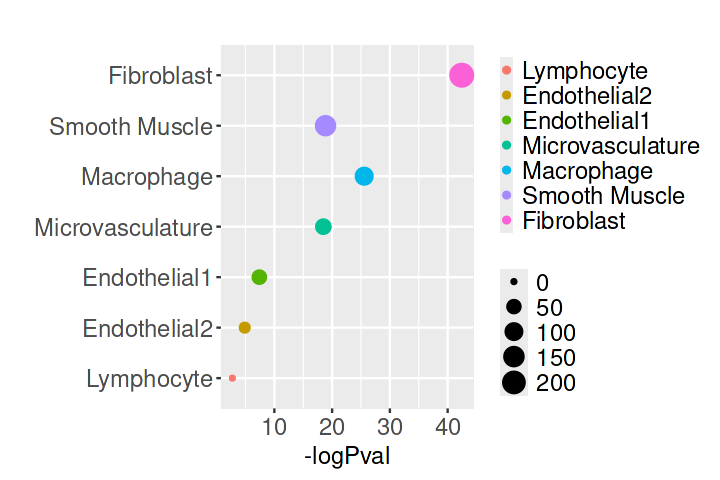

In [172]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(dat, aes(x=-log(Pval), y=cell,color=cell,size=hits)) + 
	geom_point()+
	labs(y="",x='-logPval',
		title="")+
	theme(
		axis.text.y = element_text(size=14),
		axis.text.x = element_text(size=14),
		axis.title.x = element_text(size=14),
		plot.title = element_text(hjust = 0.5,size=16),
        legend.key.size = unit(0.1,"inches"),
		legend.text = element_text(size=14),
		legend.title = element_blank(),
		legend.background = element_rect(fill="transparent")
	)


In [173]:
read.table('Markers/GWAS/CAD.tsv',sep='\t',header=F)->dat

In [174]:
dat

V1,V2,V3,V4,V5,V6,V7,V8,V9
<chr>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>
CAD,69,2112,0.012358000,1.348760,9.866550e-13,5.919930e-12,6,Endothelial2
CAD,117,2112,0.019867400,1.564300,2.913016e-22,1.747810e-21,6,Fibroblast
CAD,255,2112,0.062948900,1.060590,4.304373e-23,1.291312e-22,3,Endothelial1
CAD,1,2112,0.000424448,0.551231,3.658506e-01,6.883116e-01,1,Lymphocyte
CAD,95,2112,0.019279700,1.256810,8.526892e-14,5.116135e-13,6,Microvasculature
CAD,156,2112,0.029956200,1.306870,5.311437e-24,2.655719e-23,5,Macrophage
CAD,200,2112,0.036355600,1.339020,1.505598e-33,7.527992e-33,5,Smooth Muscle


In [176]:
library("ggsci")

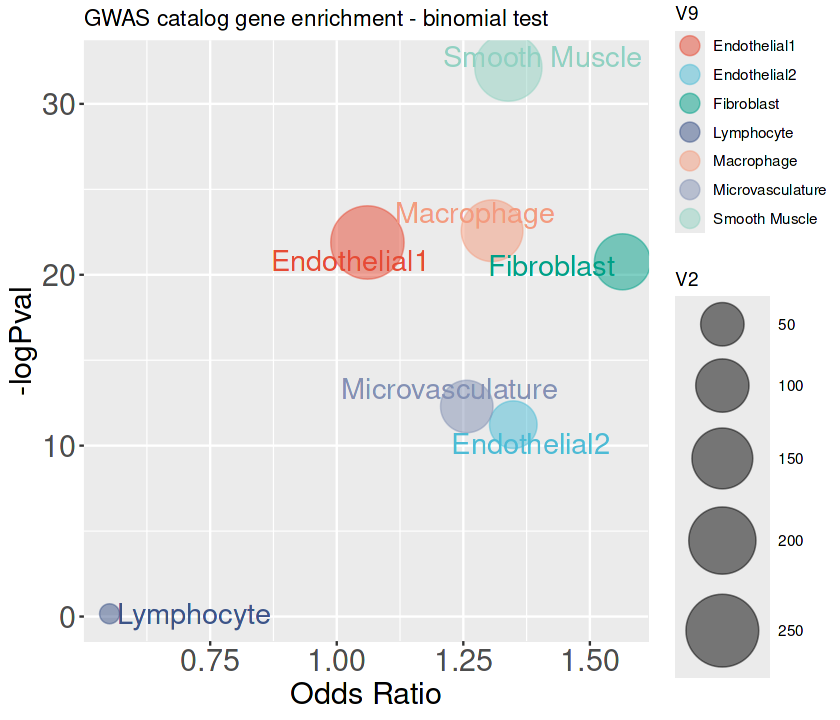

In [179]:
options(repr.plot.width=7, repr.plot.height=6)
ggplot(dat, aes(x=V5, y=-log10(V7),label=V9)) +
    geom_point(shape=19, alpha=0.5, aes(size=V2,color=V9)) +
    xlab("Odds Ratio") + ylab("-logPval") +
    ggtitle ("GWAS catalog gene enrichment - binomial test") +
    scale_size(range = c(5, 20))+
    theme(axis.text=element_text(size=18),
    axis.title=element_text(size=18))+
    guides(color = guide_legend(override.aes = list(size = 5)))+
    scale_color_npg()+
    geom_text_repel(aes(label=V9, color = V9), size=6,show.legend=F)

In [223]:
read.table('Markers/GO/plot.txt',sep='\t',header=T)->dat
dat$Term<-str_split_fixed(dat$Term,"~",2)[,2]
dcast(dat,Term~Cell, value.var = 'Fold.Enrichment' )->dat
dat[is.na(dat)]<-0
dat$Term->rownames(dat)
dat[,2:ncol(dat)]->dat

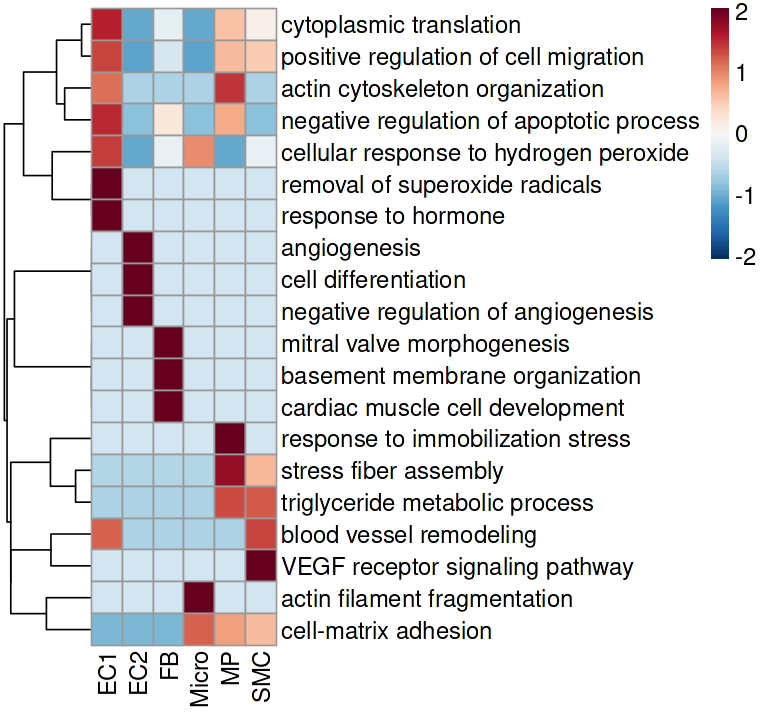

In [227]:
options(repr.plot.width=6.5, repr.plot.height=6)
pheatmap(dat,color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),cluster_cols = F,cluster_rows = T,scale='row',
           fontsize=14,angle_col=90)

In [ ]:
Idents(smc)<-smc$Gender
FindMarkers(smc, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F)->smc_sex_deg
FindMarkers(smc, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->smc_sex_deg2
write.table(smc_sex_deg,'Markers/smc_sex_deg.txt',sep='\t',quote = F)
write.table(smc_sex_deg2,'Markers/smc_sex_deg2.txt',sep='\t',quote = F)

converting counts to integer mode

gene-wise dispersion estimates



In [ ]:
Idents(fb)<-fb$Gender
FindMarkers(fb, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F)->fb_sex_deg
FindMarkers(fb, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->fb_sex_deg2
write.table(fb_sex_deg,'Markers/fb_sex_deg.txt',sep='\t',quote = F)
write.table(fb_sex_deg2,'Markers/fb_sex_deg2.txt',sep='\t',quote = F)

In [ ]:
Idents(ec1)<-ec1$Gender
FindMarkers(ec1, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F)->ec1_sex_deg
FindMarkers(ec1, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->ec1_sex_deg2
write.table(ec1_sex_deg,'Markers/ec1_sex_deg.txt',sep='\t',quote = F)
write.table(ec1_sex_deg2,'Markers/ec1_sex_deg2.txt',sep='\t',quote = F)

In [ ]:
Idents(ec2)<-ec2$Gender
FindMarkers(ec2, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F)->ec2_sex_deg
FindMarkers(ec2, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->ec2_sex_deg2
write.table(ec2_sex_deg,'Markers/ec2_sex_deg.txt',sep='\t',quote = F)
write.table(ec2_sex_deg2,'Markers/ec2_sex_deg2.txt',sep='\t',quote = F)

In [ ]:
Idents(mp)<-mp$Gender
FindMarkers(mp, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F)->mp_sex_deg
FindMarkers(mp, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->mp_sex_deg2
write.table(mp_sex_deg,'Markers/mp_sex_deg.txt',sep='\t',quote = F)
write.table(mp_sex_deg2,'Markers/mp_sex_deg2.txt',sep='\t',quote = F)

In [ ]:
Idents(micro)<-micro$Gender
FindMarkers(micro, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F)->micro_sex_deg
FindMarkers(micro, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->micro_sex_deg2
write.table(micro_sex_deg,'Markers/micro_sex_deg.txt',sep='\t',quote = F)
write.table(micro_sex_deg2,'Markers/micro_sex_deg2.txt',sep='\t',quote = F)

In [ ]:
Idents(ec2)<-ec2$Gender
FindMarkers(ec2, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F)->ec2_sex_deg
FindMarkers(ec2, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->ec2_sex_deg2
write.table(ec2_sex_deg,'Markers/ec2_sex_deg.txt',sep='\t',quote = F)
write.table(ec2_sex_deg2,'Markers/ec2_sex_deg2.txt',sep='\t',quote = F)

In [ ]:
Idents(lym)<-lym$Gender
FindMarkers(lym, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F)->lym_sex_deg
FindMarkers(lym, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F,test.use = 'DESeq2')->lym_sex_deg2
write.table(lym_sex_deg,'Markers/lym_sex_deg.txt',sep='\t',quote = F)
write.table(lym_sex_deg2,'Markers/lym_sex_deg2.txt',sep='\t',quote = F)

In [16]:
ls()

[1] "currentcol"     "czi"            "ec1"            "ec1_sex_deg"   
 [5] "ec1_sex_deg2"   "ec2"            "ec2_sex_deg"    "ec2_sex_deg2"  
 [9] "fb"             "fb_sex_deg"     "fb_sex_deg2"    "lym"           
[13] "lym_sex_deg"    "lym_sex_deg2"   "micro"          "micro_sex_deg" 
[17] "micro_sex_deg2" "mp"             "mp_sex_deg"     "mp_sex_deg2"   
[21] "pal"            "pal1"           "smc"            "smc_sex_deg"   
[25] "smc_sex_deg2"

In [21]:
write.table(czi@meta.data,'Meta/czi.meta',sep='\t',quote=F)

In [7]:
DefaultAssay(czi)<-'SCT'

In [8]:
ModScore=c('FN1','LUM','TNFRSF11B', "COL15A1", "IGFBP2", "ANXA2", "COL14A1", "COL12A1", "IGFBP6", "MMP2", "COL1A1", "COL3A1","COL1A2", "COL4A2", "COL5A1", "COL4A1", "COL5A2", "SERPINH1", "FMOD",
           "ECM1", "CSF1", "CLEC11A", "LRRC17", "FSTL3", "COL1A1", "TWSG1", "MGP", "COL5A2", "CDH11", "SOST", "GPM6B", "PDLIM7")
czi <- AddModuleScore(object = czi,features = ModScore,ctrl = 5,name = 'ModulationScore')

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


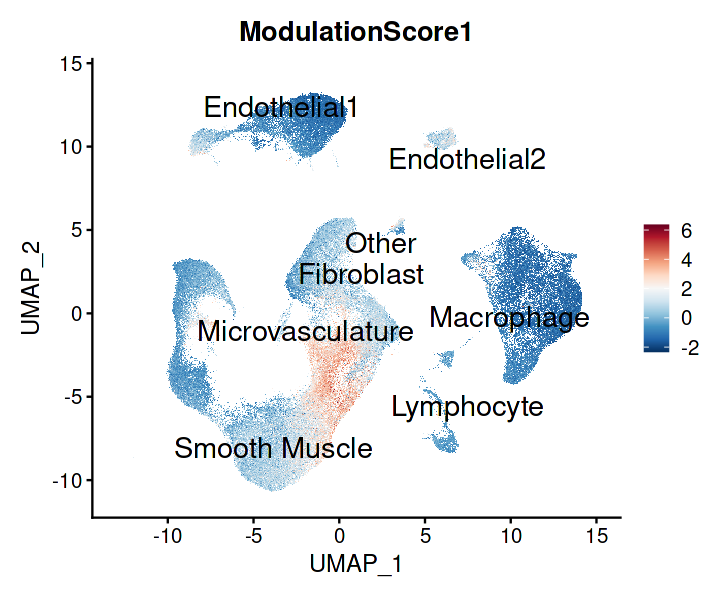

In [11]:
options(repr.plot.width=6, repr.plot.height=5)
Idents(czi)<-czi$celltype
FeaturePlot(czi,features = "ModulationScore1", label = T, repel = TRUE,label.size = 6) +
            scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "RdBu")))

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



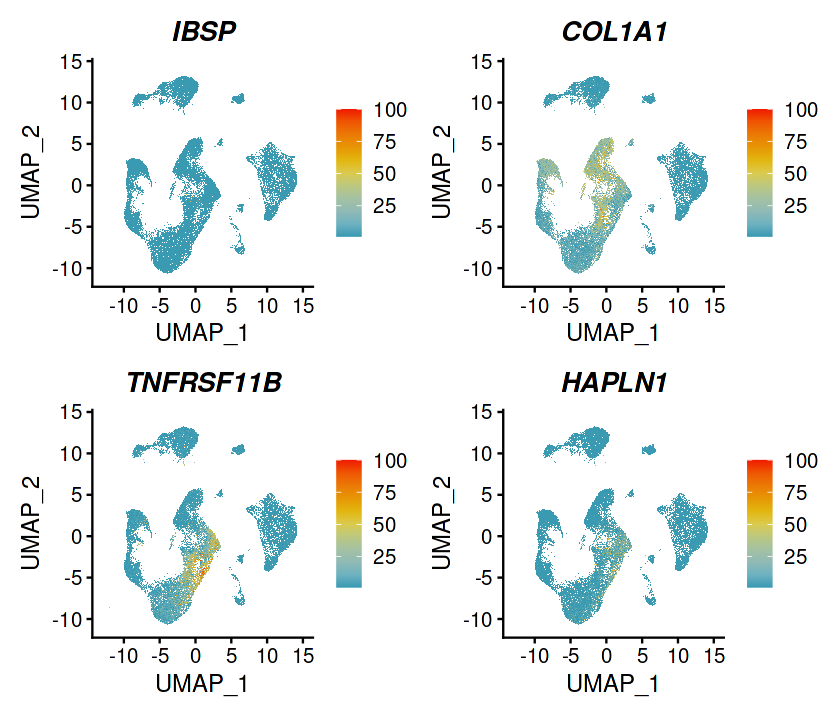

In [103]:
options(repr.plot.width=7, repr.plot.height=6)
FeaturePlot(czi, features = c('IBSP','COL1A1','TNFRSF11B','HAPLN1'), ncol=2, col=pal,order=T)&theme( plot.title = element_text(face='bold.italic'))

In [43]:
library(gprofiler2)
library(ggplot2)
library(dplyr)

In [47]:
read.table('Markers/todavid.txt',sep='\t',header=T)->dat

In [48]:
colnames(dat)

[1] "EC1"   "EC2"   "FB"    "Micro" "MP"    "SMC"

In [49]:
dat$EC1->genelist
gp = gost(genelist, organism = "hsapiens")
gp$result$celltype<-'EC1'
res<-gp$result

In [50]:
for (i in colnames(dat)[2:6]){
    genelist<-dat[,i]
    gp = gost(genelist, organism = "hsapiens")
    gp$result$celltype<-i
    rbind(res,gp$result)->res
    }

In [123]:
(res$intersection_size/res$query_size)/(res$term_size/res$effective_domain_size)->res$FoldEnrichment
dcast(res,term_name~celltype,value.var = 'FoldEnrichment',fun.aggregate = mean)->dat_fe
dcast(res,term_name~celltype,value.var = 'p_value',fun.aggregate = mean)->dat_pv

In [124]:
read.table('Markers/GO/term',sep='\t')->term

In [125]:
dat_fe[which(dat_fe$term_name %in% term$V1),]->dat_fe1
rownames(dat_fe1)<-dat_fe1$term_name
dat_fe1[is.na(dat_fe1)] <- 0

In [126]:
dat_fe1[,2:ncol(dat_fe1)]->data

In [127]:
cbind(data$SMC,data$FB,data$EC2,data$EC1,data$Micro,data$MP)->data1
colnames(data1)<-c('Smooth Muscle','Fibroblast','Endothelial2','Endothelial1','Microvasculature','Macrophage')
rownames(data1)<-rownames(data)

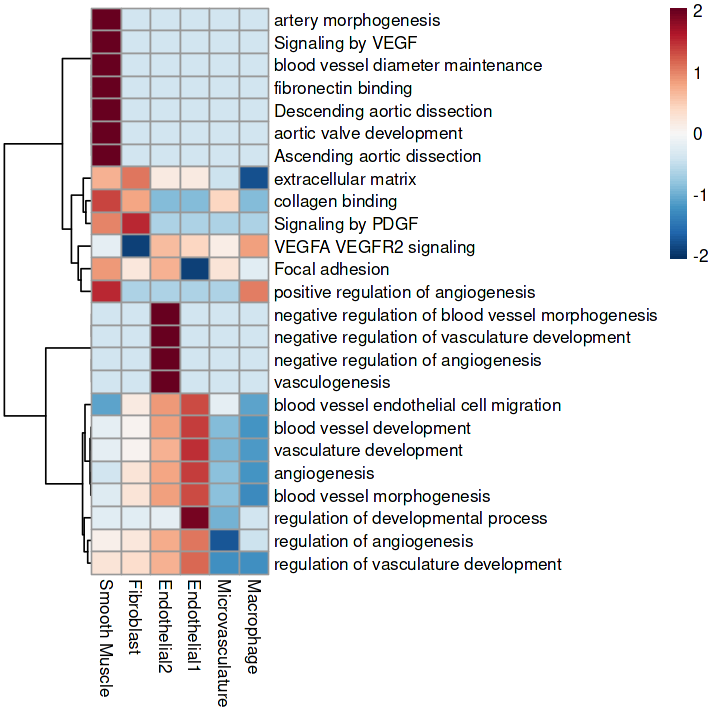

In [128]:
options(repr.plot.width=6, repr.plot.height=6)
pheatmap(data1,cluster_rows =T,cluster_cols = F,show_rownames =T,scale='row',
         color=colorRampPalette(rev(brewer.pal(11,"RdBu")))(100),clustering_method ='ward.D')

In [133]:
read.csv('Markers/motif/motif_stat_mponly.txt')->dat

In [134]:
dat$Pval<-dbinom(dat$ol,dat$size,dat$ol_bg/dat$size_bg,log=F)

In [140]:
dat$FE<-(dat$ol/dat$ol_bg)/(dat$size/dat$size_bg)

In [141]:
dat

TF,ol,size,ol_bg,size_bg,cell,Pval,FE
<chr>,<int>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>
TCF21,147,1942,39.4,943,FB,4.856319e-12,1.811689
HAND2,47,1942,14.3,943,FB,6.522320e-04,1.595968
ISL1,277,1942,79.4,943,FB,4.791317e-18,1.694032
MEF2C,74,1942,19.6,943,FB,4.705570e-07,1.833319
HOXAs,368,1942,99.4,943,FB,1.263303e-28,1.797728
HOXBs,149,1942,45.3,943,FB,1.143935e-08,1.597168
TCF21,112,1469,35.7,943,SMC,3.420524e-12,2.013908
HAND2,38,1469,17.3,943,SMC,8.427610e-03,1.410027
ISL1,201,1469,74.0,943,SMC,9.407016e-15,1.743630


In [71]:
get_num_rd(ec_rd)

[1] 281

In [2]:
readRDS('RDS/smc.rds')->smc

In [3]:
Idents(smc)<-smc$Gender
FindMarkers(smc, ident.1='Female',ident.2='Male',only.pos = F,assay = 'RNA',verbose = F,
            pseudocount.use = 0.1,test.use = 'DESeq2')->smc_sex_deg3
write.table(smc_sex_deg3,'Markers/smc_sex_deg3.txt',sep='\t',quote = F)

converting counts to integer mode

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates



In [ ]:
czi$celltype2->Idents(czi)
FindAllMarkers(czi,assay = 'RNA',verbose = F,only.pos = T)->czi_celltype2_marker

In [5]:
write.table(czi_celltype2_marker,'Markers/celltype2_mks.txt',sep = '\t',quote=F)

In [3]:
library(SeuratDisk)

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat



In [5]:
DefaultAssay(czi)<-'RNA'

In [6]:
DietSeurat(czi,counts = TRUE,data = TRUE,scale.data = FALSE, dimreducs = c('pca', 'umap'), assays = 'RNA',misc = TRUE)->czi

In [10]:
czi@meta.data$celltype4 <- as.character(czi@meta.data$celltype4)
czi@meta.data$Site <- as.character(czi@meta.data$Site)
czi@meta.data$Pt <- as.character(czi@meta.data$Pt)

In [13]:
SaveH5Seurat(czi, filename = "RDS/CZI_processed.h5Seurat")
Convert("RDS/CZI_processed.h5Seurat", dest = "h5ad",assay = "RNA")

Validating h5Seurat file

Adding data from RNA as X

Transfering meta.features to var

Adding counts from RNA as raw

Transfering meta.features to raw/var

Transfering meta.data to obs



In [3]:
colnames(smc@meta.data)

[1] "orig.ident"              "nCount_RNA"             
 [3] "nFeature_RNA"            "percent.mt"             
 [5] "percent.rb"              "Pt"                     
 [7] "Site"                    "Gender"                 
 [9] "Age"                     "nCount_SCT"             
[11] "nFeature_SCT"            "integrated_snn_res.0.08"
[13] "seurat_clusters"         "celltype"               
[15] "celltype2"               "type_site"

In [ ]:
avg_exp <- AverageExpression(smc, group.by = "celltype", assays = "RNA", slot = "data")

# 提取 RNA assay 的结果
avg_exp_df <- avg_exp$RNA  